# MatPES Foundation Potential (FP) Force-Error Analysis — MatPES-PBE

Force-error statistics across all foundation potentials using the merged MatPES PBE results.

**Main-figure sections (manuscript order):**

| Section | Purpose |
| ------- | ------- |
| 0 | Imports & load data |
| 1 | Configuration (thresholds, `MODEL_NAMES`) |
| 2 | Combined Summary Table |
| 3 | Density & CDF configuration (`FP_SHOW`, filtered results, CDFs) |
| 4 | Per-model plot style (`MODEL_STYLE`) |
| 5–7 | Per-atom density panels ($\lvert\Delta\lvert F\rvert\rvert$ vs $\lvert F_{\mathrm{DFT}}\rvert$, $\Delta\theta$ vs $\lvert F_{\mathrm{DFT}}\rvert$) |
| 8–9 | CDFs of $\lvert\Delta\lvert F\rvert\rvert$ and $\Delta\theta$ |
| 10–14 | Fraction tables, joint magnitude–angle accuracy, highly accurate force predictions, combined panel |
| 15 | Large-force-error atoms |
| 16 | Force-magnitude MAE/RMSE across DFT force-magnitude subsets |
| 17 | Far-from-equilibrium (FE) $r_F$ fractions |
| 18–36 | SI sections — including force-vector-error ($e_{\mathrm{vec}}$) counterparts (18–21), an FE-only joint magnitude–angle accuracy analysis (23), and diagnostic querying (36) |

**Input files (in `data/`):**
- `matpes_pbe_force_results_standardized.json` — the standard FPBench `force_results` schema (see `force_results.py`): `{"models": {model: {"dft_force_magnitude": [...], "fp_force_magnitude": [...], "force_magnitude_error": [...], "force_angle_error": [...], "force_vector_error": [...]}}}`


---
### Using FPBench with another dataset

The provided MatPES-PBE results reproduce the force-error analyses reported in the manuscript and SI. The same analysis workflow can be applied to another dataset using `build_force_results(...)` (see `force_results.py`).

Users provide paired Cartesian DFT and FP force vectors with matching structure and atom ordering. `build_force_results(...)` calculates the standardized per-atom quantities used throughout the FPBench force analysis:

- DFT force magnitude, $|F_{\mathrm{DFT}}|$
- FP force magnitude, $|F_{\mathrm{FP}}|$
- force-magnitude error, $\Delta|F|$
- force-angle error, $\Delta\theta$
- force-vector error, $e_{\mathrm{vec}}$

When source structure identifiers are provided, the resulting data also retain structure and atom provenance for diagnostic analysis.

```python
from force_results import build_force_results

force_results = build_force_results(
    dft_forces=dft_forces,
    fp_forces={
        "MyModel1": fp_forces_model1,
        "MyModel2": fp_forces_model2,
    },
    structure_ids=structure_ids,
)
```

The returned `force_results` follows the same schema as the provided FPBench results (loaded as `force_results` in Section 0 below) and can be passed directly to the analysis functions used throughout this notebook. There is no required file format — the public contract is the Python `force_results` structure itself, not JSON, NPZ, or any other serialization.


### Example using MatPES-PBE Cartesian forces

The example below demonstrates `build_force_results(...)` using a small set of genuine MACE-MatPES Cartesian DFT and FP forces from the MatPES-PBE evaluation data (5 structures, `examples/mace_matpes_cartesian_force_example.json`).

The example input is provided separately from the standardized MatPES-PBE FPBench reproduction results loaded in Section 0 below. It is intended only to demonstrate how raw Cartesian force data are converted into the standardized FPBench `force_results` format — not to reproduce manuscript numbers. The full raw Cartesian source contains a broader structure/atom population than the final manuscript evaluation set, so numerical values from this demonstration are not intended to reproduce the manuscript summary statistics.


**Input:** `build_force_results(...)` takes paired Cartesian DFT and FP force vectors — one `(n_atoms, 3)` array per structure for each side — plus an optional list of source-dataset structure IDs. The DFT and FP arrays for a given structure must contain the same atoms in the same ordering.

**Output:** for each atom, it calculates the standard FPBench quantities: the DFT force magnitude $|F_{\mathrm{DFT}}|$, the FP force magnitude $|F_{\mathrm{FP}}|$, the force-magnitude error $\Delta|F| = |F_{\mathrm{FP}}| - |F_{\mathrm{DFT}}|$, the force-angle error $\Delta\theta$ (degrees), and the force-vector error $e_{\mathrm{vec}} = \lVert F_{\mathrm{FP}} - F_{\mathrm{DFT}}\rVert$. When structure IDs are supplied (as here), it also returns `structure_id`/`atom_index` provenance — explained below the table.


In [1]:
import sys
sys.path.insert(0, "../scripts")

import json
from force_results import build_force_results

EXAMPLE_PATH = "../examples/mace_matpes_cartesian_force_example.json"

with open(EXAMPLE_PATH) as f:
    example_data = json.load(f)

structure_ids_demo = example_data["structure_ids"]
dft_forces_demo = example_data["dft_forces"]
fp_forces_demo = example_data["fp_forces"]

print("Structures in example file:", len(structure_ids_demo))
print("Atoms per structure:", [len(s) for s in dft_forces_demo])


Structures in example file: 5
Atoms per structure: [5, 5, 5, 5, 5]


In [2]:
# Call build_force_results(...) exactly as an outside user would —
# raw Cartesian DFT/FP forces + structure IDs in, standardized force_results out.
demo_force_results = build_force_results(
    dft_forces=dft_forces_demo,
    fp_forces={
        "MACE-MatPES": fp_forces_demo,
    },
    structure_ids=structure_ids_demo,
)


In [3]:
d = demo_force_results["MACE-MatPES"]

print("Available keys:", list(d.keys()))
print("Number of structures:", len(structure_ids_demo))
print("Number of atoms:", len(d["dft_force_magnitude"]))
print()
print("First 3 atoms, dft_force_magnitude:", d["dft_force_magnitude"][:3])
print("First 3 atoms, force_vector_error :", d["force_vector_error"][:3])


Available keys: ['dft_force_magnitude', 'fp_force_magnitude', 'force_magnitude_error', 'force_angle_error', 'force_vector_error', 'structure_id', 'atom_index']
Number of structures: 5
Number of atoms: 25

First 3 atoms, dft_force_magnitude: [0.07390029184642642, 5.842776254783342, 4.753460207943569]
First 3 atoms, force_vector_error : [0.01345691886121141, 0.17294867714002726, 0.06273843768851203]


In [4]:
import pandas as pd

demo_table = pd.DataFrame({
    "structure_id":  d["structure_id"],
    "atom_index":    d["atom_index"],
    "|F_DFT|":       d["dft_force_magnitude"],
    "|F_FP|":        d["fp_force_magnitude"],
    "Δ|F|":          d["force_magnitude_error"],
    "Δθ":            d["force_angle_error"],
    "e_vec":         d["force_vector_error"],
})
demo_table.head()


,structure_id,atom_index,|F_DFT|,|F_FP|,Δ|F|,Δθ,e_vec
0,29632,0,0.073900,0.071951,-0.001949,10.476777,0.013457
1,29632,1,5.842776,5.778528,-0.064248,1.583392,0.172949
2,29632,2,4.753460,4.808527,0.055067,0.360270,0.062738
3,29632,3,2.976830,2.868847,-0.107983,0.674902,0.113337
4,29632,4,2.957866,2.894668,-0.063198,1.836556,0.113095


**Reading `structure_id` and `atom_index`.** `structure_id` identifies the source structure in the original dataset (here, the `original_index` of the MatPES-PBE structure the atom came from). `atom_index` is the zero-based position of that atom *within that particular structure* — it restarts from 0 for every structure. For example, `structure_id = 29632, atom_index = 0` means "the first atom of source structure 29632"; `structure_id = 29632, atom_index = 4` means "the fifth atom of that same structure."

**Why provenance is useful.** Keeping `structure_id` + `atom_index` alongside the force-error quantities makes it possible to trace a selected atom's error back to the specific structure and atomic environment it came from — useful for diagnosing *why* a particular error regime occurs, not just how large it is.

**Provenance note.** The example above demonstrates provenance when structure IDs are supplied directly to `build_force_results(...)`. Structure/local-atom provenance for the released reproduction results will be addressed separately when the calculation-generation workflow is updated. The existing atom/structure-querying utility (`get_bad_atom_indices(...)`) will be revised at that stage.


Both workflows below produce the same standardized `force_results` — the manuscript/SI analyses in this notebook operate on that object, not on any particular input file format:

```
Paper reproduction:

  provided standardized MatPES-PBE results
                  ↓
            force_results
                  ↓
           FPBench analyses


Using FPBench on raw forces:

  Cartesian DFT/FP forces + structure IDs
                  ↓
       build_force_results(...)
                  ↓
            force_results
                  ↓
       same FPBench analyses
```

`demo_force_results` above is kept separate from the `force_results` loaded in Section 0 and used for the manuscript/SI reproduction below — it is not referenced by any later cell.


---
## Section 0 — Imports & Load Data


In [5]:
import sys
sys.path.insert(0, "../scripts")

import importlib, force_error_metrics
importlib.reload(force_error_metrics)
import json
import numpy as np
import pandas as pd

from force_error_metrics import (
    frac_percent,
    build_joint_dF_theta_accuracy_table,
    build_highly_accurate_force_fraction_table,
    split_triangle_heatmap,
    single_heatmap,
)

BASE = ".."  # repo-relative — run the notebook from analysis/

# Standardized FPBench force_results schema (see force_results.py):
# dft_force_magnitude, fp_force_magnitude, force_magnitude_error,
# force_angle_error, force_vector_error (e_vec) — one dict per model.
with open(f"{BASE}/data/matpes_pbe_force_results_standardized.json") as f:
    _standardized = json.load(f)

force_results = _standardized["models"]

# Legacy-keyed view for the existing analysis functions below — derived
# from force_results so every downstream cell keeps working unchanged.
all_results = {
    model: {
        "F_dft":      d["dft_force_magnitude"],
        "F_fp":     d["fp_force_magnitude"],
        "deltaF":     d["force_magnitude_error"],
        "deltaTheta": d["force_angle_error"],
        "e_vec":      d["force_vector_error"],
    }
    for model, d in force_results.items()
}

print("Models in all_results:", list(all_results.keys()))

Models in all_results: ['Mace-MP0_medium', 'chgnet', 'm3gnet_pes', 'UMA_s1_p1', 'm3gnet_matpes_pbe', 'TensorNET_matpes_PBE', 'mace_matpes_pbe']


In [6]:
import matplotlib.pyplot as plt                                                                                                                                                
plt.rcParams["figure.dpi"] = 350 

---
## Section 1 — Configuration
- `FDFT_MIN` — minimum |F_DFT| for an atom to be included in the force-error analysis
The default value is `0.01 eV/Å`, consistent with the manuscript. This cutoff excludes near-zero DFT forces, for which small absolute differences in the force components can produce large changes in the calculated force angle.
- `MODEL_NAMES` — single canonical raw-key → display-name mapping used everywhere below

In [7]:
FDFT_MIN   = 0.01                                     # eV/Å

# Model list (preserves the order from all_results)
models = list(all_results)
print("Models included:", models)
MODEL_NAMES = {
    "Mace-MP0_medium":      "MACE",
    "chgnet":               "CHGNet",
    "m3gnet_pes":           "M3GNet",
    "UMA_s1_p1":            "UMA",
    "m3gnet_matpes_pbe":    "M3GNet-MatPES",
    "TensorNET_matpes_PBE": "TensorNet-MatPES",
    "mace_matpes_pbe":      "MACE-MatPES",
}
all_results = {MODEL_NAMES.get(k, k): v for k, v in all_results.items()}
models = [MODEL_NAMES.get(m, m) for m in models]
print("Models (renamed):", models)

# Dict restricted to included models (needed early for the Combined Summary Table)
all_results_filtered = {m: all_results[m] for m in models}

Models included: ['Mace-MP0_medium', 'chgnet', 'm3gnet_pes', 'UMA_s1_p1', 'm3gnet_matpes_pbe', 'TensorNET_matpes_PBE', 'mace_matpes_pbe']
Models (renamed): ['MACE', 'CHGNet', 'M3GNet', 'UMA', 'M3GNet-MatPES', 'TensorNet-MatPES', 'MACE-MatPES']


---
## Section 2 — Combined Summary Table

Per-model overview combining several metrics from the sections above into one table.


In [8]:
import numpy as np
import pandas as pd
from force_error_metrics import (
    frac_percent,
    build_dF_mae_rmse_fdft_subset,
    build_theta_mae_rmse_fdft_subset,
)

# ── Per-column format config ───────────────────────────────────────────────
# Each entry: fmt="{:.2f}" (fixed decimals) OR sig_figs=N (significant figures)
# For MAE/RMSE pairs the same format is applied to both values.
COL_FMT = {
    "Δ|F| MAE/RMSE (eV/Å)":              {"fmt": "{:.2f}"},
    "Δθ MAE/RMSE (deg)":                  {"fmt": "{:.0f}"},
    "Δ|F| MAE/RMSE (eV/Å), |Δ|F|| < 1 eV/Å":         {"fmt": "{:.2f}"},
    "Frac. |Δ|F|| < 0.01 eV/Å (%) ↑":                  {"fmt": "{:.1f}"},
    "Frac. |Δ|F|| > 1 eV/Å (%) ↓":                     {"fmt": "{:.2f}"},
    "Δ|F| MAE/RMSE (eV/Å), FE atoms":        {"fmt": "{:.2f}"},
    "Δθ MAE/RMSE (deg), FE atoms":            {"fmt": "{:.0f}"},
    "Frac. |Δ|F|| < 0.01 eV/Å & Δθ < 1°/20° (%)":       {"sig_figs": 2},
}

def _fmt_val(cfg, v):
    """Format a single float using fmt or sig_figs from cfg."""
    if np.isnan(v):
        return "—"
    if "sig_figs" in cfg:
        n = cfg["sig_figs"]
        if v == 0:
            return "0"
        from math import floor, log10
        mag = floor(log10(abs(v)))
        decimals = max(0, n - 1 - mag)
        return f"{v:.{decimals}f}"
    return cfg["fmt"].format(v)

def _pair(cfg, mae, rmse):
    return f"{_fmt_val(cfg, mae)} / {_fmt_val(cfg, rmse)}"

# ── Compute stats ──────────────────────────────────────────────────────────
rows = {}
for model, data in all_results_filtered.items():
    F_dft  = np.abs(np.asarray(data.get("F_dft",      data.get("all_F_dft_mags")), float))
    dF     = np.abs(np.asarray(data.get("deltaF",     data.get("all_deltaF")),     float))
    dtheta = np.abs(np.asarray(data.get("deltaTheta", data.get("all_deltaTheta")), float))
    n = min(len(F_dft), len(dF), len(dtheta))
    F_dft, dF, dtheta = F_dft[:n], dF[:n], dtheta[:n]
    valid = np.isfinite(F_dft) & np.isfinite(dF) & np.isfinite(dtheta) & (F_dft > FDFT_MIN)

    # All-atom Δ|F| MAE/RMSE
    dF_v = dF[valid]
    mae_dF_all  = float(np.mean(dF_v))
    rmse_dF_all = float(np.sqrt(np.mean(dF_v ** 2)))

    # All-atom mean/RMS Δθ
    dt_v = dtheta[valid]
    mae_dt_all  = float(np.mean(dt_v))
    rmse_dt_all = float(np.sqrt(np.mean(dt_v ** 2)))

    # Δ|F| MAE/RMSE, subset on |Δ|F|| < 1 eV/Å
    sub_lt1 = dF_v[dF_v < 1.0]
    mae_dF_lt1  = float(np.mean(sub_lt1))  if sub_lt1.size else np.nan
    rmse_dF_lt1 = float(np.sqrt(np.mean(sub_lt1 ** 2))) if sub_lt1.size else np.nan

    # Frac |Δ|F|| < 0.01 eV/Å (all atoms, no angle cut)
    frac_lt001 = 100.0 * (dF_v < 0.01).sum() / dF_v.size

    # Frac |Δ|F|| > 1 eV/Å
    frac_gt1 = 100.0 * (dF_v > 1.0).sum() / dF_v.size

    # Subset on |FDFT| > 1 eV/Å
    hi = valid & (F_dft > 1.0)
    dF_hi, dt_hi = dF[hi], dtheta[hi]
    mae_dF_hi  = float(np.mean(dF_hi))  if dF_hi.size else np.nan
    rmse_dF_hi = float(np.sqrt(np.mean(dF_hi ** 2))) if dF_hi.size else np.nan
    mae_dt_hi  = float(np.mean(dt_hi))  if dt_hi.size else np.nan
    rmse_dt_hi = float(np.sqrt(np.mean(dt_hi ** 2))) if dt_hi.size else np.nan

    # Frac |Δ|F||<0.01 & Δθ<1°  (using full frac_percent which re-applies FDFT_MIN)
    fp1  = frac_percent(dF, dtheta, F_dft, 0.01, 1,  fdf_min=FDFT_MIN)
    fp20 = frac_percent(dF, dtheta, F_dft, 0.01, 20, fdf_min=FDFT_MIN)

    c = COL_FMT
    rows[model] = {
        "Δ|F| MAE/RMSE (eV/Å)":         _pair(c["Δ|F| MAE/RMSE (eV/Å)"],         mae_dF_all,  rmse_dF_all),
        "Δθ MAE/RMSE (°)":              _pair(c["Δθ MAE/RMSE (deg)"],              mae_dt_all,  rmse_dt_all),
        "Δ|F| MAE/RMSE (eV/Å), |Δ|F|| < 1 eV/Å":    _pair(c["Δ|F| MAE/RMSE (eV/Å), |Δ|F|| < 1 eV/Å"],    mae_dF_lt1,  rmse_dF_lt1),
        "Frac. |Δ|F|| < 0.01 eV/Å & Δθ < 1°/20° (%)":   _pair(c["Frac. |Δ|F|| < 0.01 eV/Å & Δθ < 1°/20° (%)"],     fp1, fp20),
        "Frac. |Δ|F|| < 0.01 eV/Å (%) ↑":              _fmt_val(c["Frac. |Δ|F|| < 0.01 eV/Å (%) ↑"],              frac_lt001),
        "Frac. |Δ|F|| > 1 eV/Å (%) ↓":                 _fmt_val(c["Frac. |Δ|F|| > 1 eV/Å (%) ↓"],                 frac_gt1),
        "Δ|F| MAE/RMSE (eV/Å), on FE atoms":   _pair(c["Δ|F| MAE/RMSE (eV/Å), FE atoms"],   mae_dF_hi,   rmse_dF_hi),
        "Δθ MAE/RMSE (°), on FE atoms":        _pair(c["Δθ MAE/RMSE (deg), FE atoms"],        mae_dt_hi,   rmse_dt_hi),
        
    }

df_summary = pd.DataFrame(rows).T
df_summary.index.name = "FP model"
df_summary

,Δ|F| MAE/RMSE (eV/Å),Δθ MAE/RMSE (°),"Δ|F| MAE/RMSE (eV/Å), |Δ|F|| < 1 eV/Å",Frac. |Δ|F|| < 0.01 eV/Å & Δθ < 1°/20° (%),Frac. |Δ|F|| < 0.01 eV/Å (%) ↑,Frac. |Δ|F|| > 1 eV/Å (%) ↓,"Δ|F| MAE/RMSE (eV/Å), on FE atoms","Δθ MAE/RMSE (°), on FE atoms"
FP model,,,,,,,,
MACE,0.23 / 1.93,37 / 58,0.17 / 0.27,1.1 / 4.5,8.3,3.44,0.49 / 3.65,18 / 29
CHGNet,0.31 / 2.19,45 / 66,0.22 / 0.32,0.66 / 2.2,5.6,5.71,0.70 / 4.14,24 / 36
M3GNet,0.44 / 1.49,56 / 76,0.26 / 0.36,0.54 / 1.5,4.6,10.79,0.98 / 2.76,40 / 56
UMA,0.56 / 7.93,28 / 51,0.12 / 0.21,2.8 / 11,15.1,2.69,1.13 / 11.89,12 / 25
M3GNet-MatPES,0.21 / 1.24,34 / 53,0.17 / 0.25,0.92 / 3.7,7.1,2.35,0.43 / 2.34,18 / 27
TensorNet-MatPES,0.17 / 1.39,29 / 49,0.15 / 0.22,0.98 / 4.6,7.7,1.20,0.33 / 2.63,12 / 18
MACE-MatPES,0.08 / 1.10,16 / 32,0.07 / 0.13,3.9 / 15,19.0,0.25,0.16 / 2.09,6 / 10


---
## Section 3 — Density & CDF Configuration

`FP_SHOW` selects which single foundation potential is shown in the density plots (Sections 5–7).  
All models are shown together in the CDF plots (Sections 8–9).


In [9]:
import importlib, fp_cdf_density_plots
importlib.reload(fp_cdf_density_plots)
import matplotlib.pyplot as plt

from fp_cdf_density_plots import (
    build_cdf_from_all_results,
    panel_abs_dF_vs_dtheta_cond_on_Fdft,
    panel_Fdft_vs_abs_dF,
    panel_Fdft_vs_dtheta,
    plot_cdf_with_inset_on_ax,
    PAPER_STYLE_DENSITY,
    PAPER_STYLE_CDF,
)

# Which single FP to show in density plots (Sections 5–7)
FP_SHOW = "M3GNet"   # change to any key in all_results

# Dict restricted to included models (no r2SCAN)
all_results_filtered = {m: all_results[m] for m in models}

# Pre-compute CDFs for all included models — used in Sections 8–9
cdf_results = build_cdf_from_all_results(
    all_results_filtered,
    f_dft_thr=FDFT_MIN,
    use_abs_f_dft=True,
)

print(f"Density plots will show : {FP_SHOW}")
print(f"CDF computed for        : {list(cdf_results.keys())}")

Density plots will show : M3GNet
CDF computed for        : ['MACE', 'CHGNet', 'M3GNet', 'UMA', 'M3GNet-MatPES', 'TensorNet-MatPES', 'MACE-MatPES']


---
## Section 4 — Per-Model Plot Style


In [10]:
MODEL_STYLE =  {
    "MACE":                    {"color": "#4477AA", "ls": "-",              "lw": 1.6},  # blue,   solid
    "CHGNet":           {"color": "#CCBB44", "ls": "-",              "lw": 1.6},  # yellow, dashed
    "M3GNet":           {"color": "#228833", "ls": "-",       "lw": 1.6},  # green,  loosely dashed
    "UMA":              {"color": "#EE6677", "ls": "-",              "lw": 1.6},  # red,    dash-dot
    "M3GNet-MatPES":    {"color": "#66CCEE", "ls": "-",      "lw": 1.6},  # cyan,   densely dotted
    "TensorNet-MatPES": {"color": "#AA3377", "ls": "-","lw": 1.6},  # purple, dash-dot-dot
    "MACE-MatPES":      {"color": "#EE8866", "ls": "-",              "lw": 1.6},  # orange, dotted
}


MODEL_COLORS     = {m: s["color"] for m, s in MODEL_STYLE.items()}
MODEL_LINESTYLES = {m: s["ls"]    for m, s in MODEL_STYLE.items()}
MODEL_LINEWIDTHS = {m: s["lw"]    for m, s in MODEL_STYLE.items()}

---
## Section 5 — $|\Delta|F||$ vs $\Delta\theta$ Density

2-D density of force-magnitude error vs angular error.  


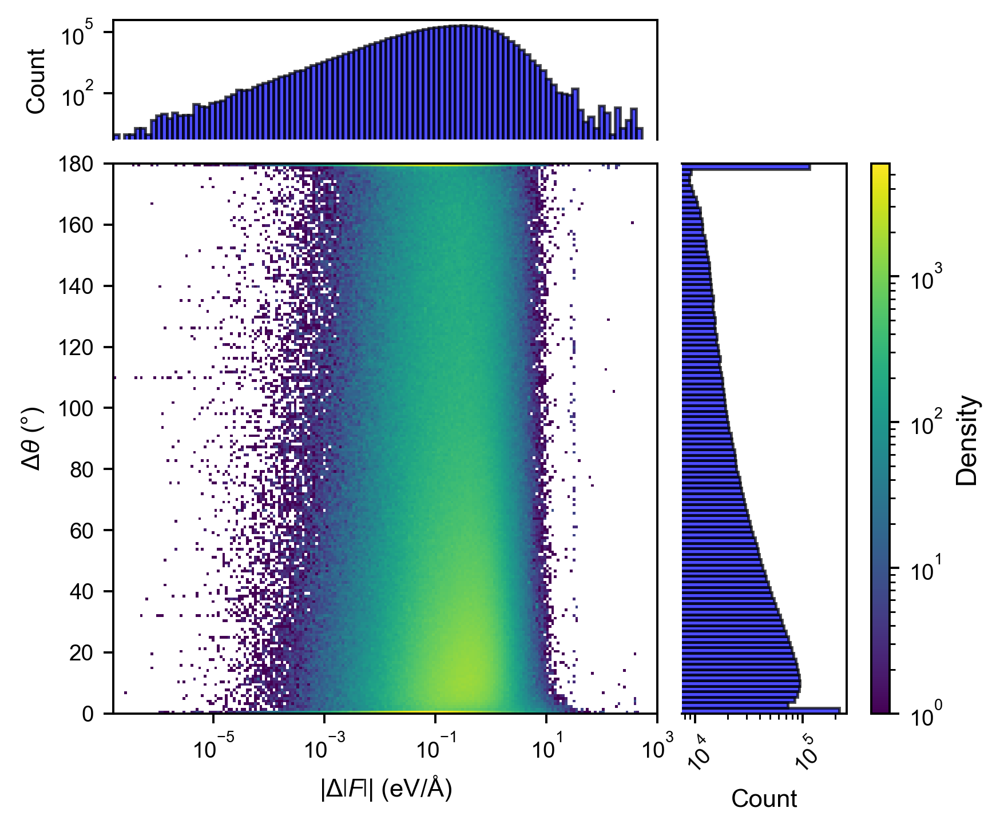

In [11]:
from fp_cdf_density_plots import PAPER_STYLE_DENSITY, panel_abs_dF_vs_dtheta_cond_on_Fdft
fig = plt.figure(figsize=(5, 4.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

panel_abs_dF_vs_dtheta_cond_on_Fdft(
    fig, gs[0, 0],
    all_results_filtered, FP_SHOW,
    fdft_threshold = FDFT_MIN,
    xlim           = (None, 1e3),
    title          = "",
    inner_hspace   = 0.2,
    cmap="viridis",
    **PAPER_STYLE_DENSITY,
)

plt.savefig(f"../outputs/matpes_pbe/dF_vs_dtheta_{FP_SHOW}.svg", bbox_inches="tight", dpi=350)
plt.show()

---
## Section 6 — $|\Delta|F||$ vs $|F_{\mathrm{DFT}}|$ Density


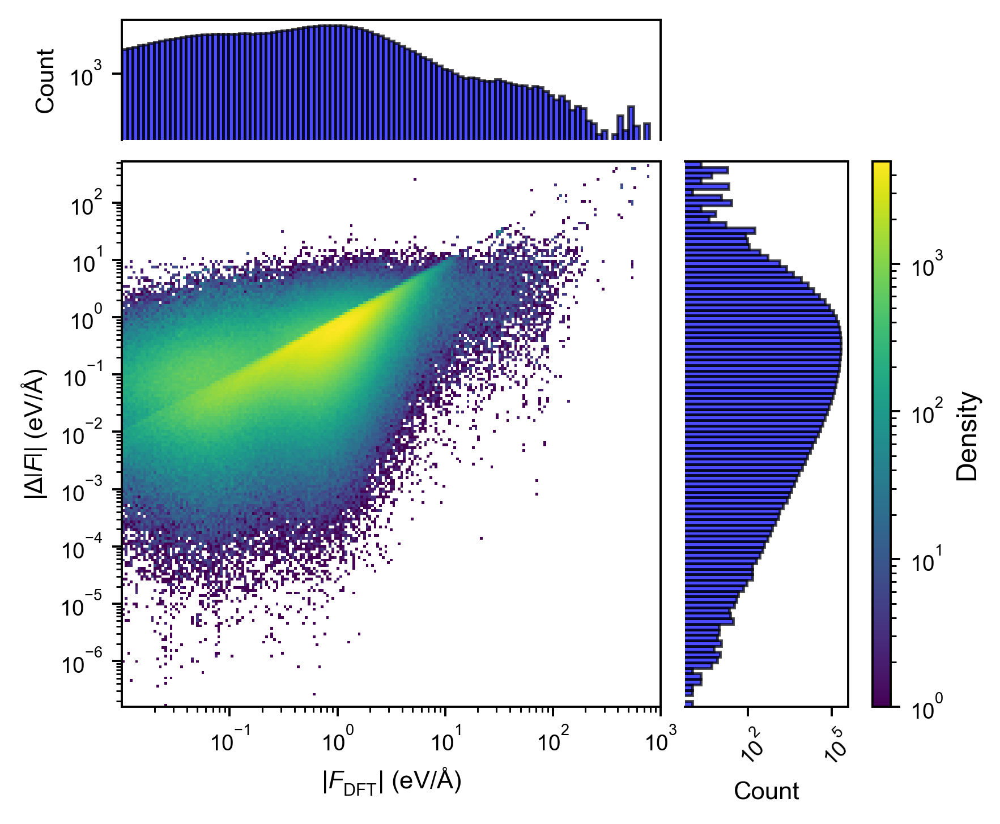

In [12]:
from fp_cdf_density_plots import PAPER_STYLE_DENSITY, panel_Fdft_vs_abs_dF
fig = plt.figure(figsize=(5, 4.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

panel_Fdft_vs_abs_dF(
    fig, gs[0, 0],
    all_results_filtered, FP_SHOW,
    force_threshold = FDFT_MIN,
    xlim            = (None, 1000),
    title = "",
    **PAPER_STYLE_DENSITY,
)

plt.savefig(f"../outputs/matpes_pbe/Fdft_vs_dF_{FP_SHOW}.svg", bbox_inches="tight", dpi=350)
plt.show()

---
## Section 7 — $\Delta\theta$ vs $|F_{\mathrm{DFT}}|$ Density


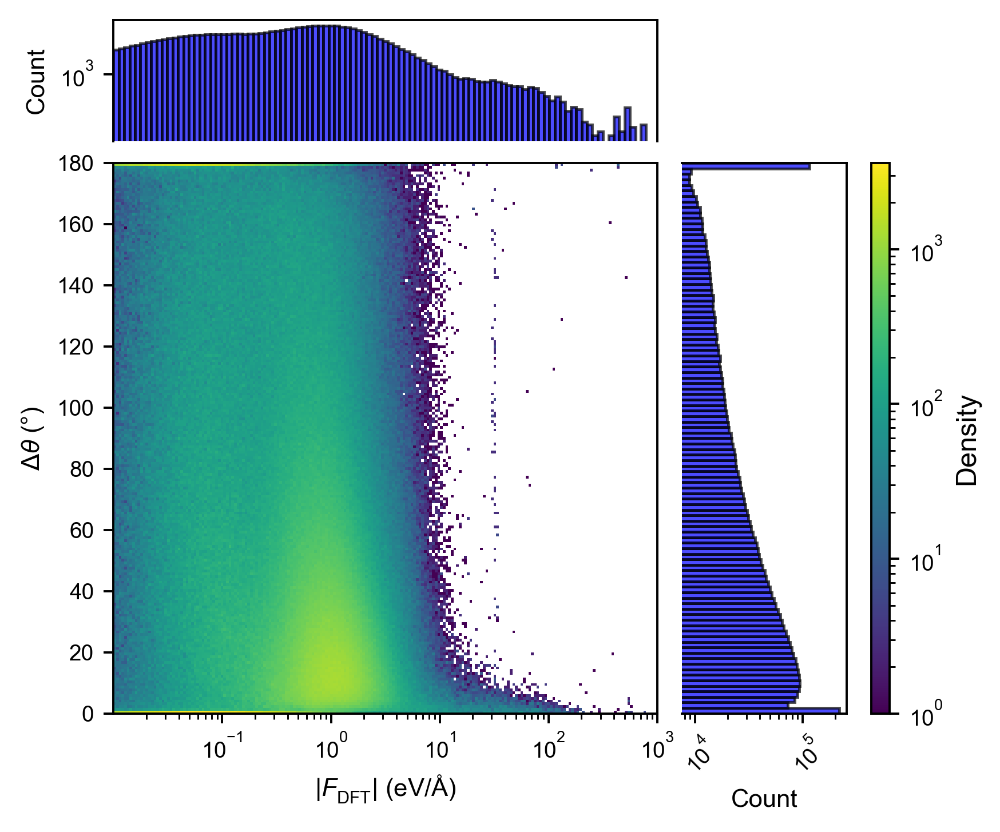

In [13]:
from fp_cdf_density_plots import PAPER_STYLE_DENSITY, panel_Fdft_vs_dtheta
fig = plt.figure(figsize=(5, 4.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

panel_Fdft_vs_dtheta(
    
    fig, gs[0, 0],
    all_results_filtered, FP_SHOW,
    force_threshold = FDFT_MIN,
    xlim            = (None, 1000),
    title="",
    **PAPER_STYLE_DENSITY,
)

plt.savefig(f"../outputs/matpes_pbe/Fdft_vs_dtheta_{FP_SHOW}.svg", bbox_inches="tight", dpi=350)
plt.show()

---
## Section 8 — CDF of $|\Delta|F||$


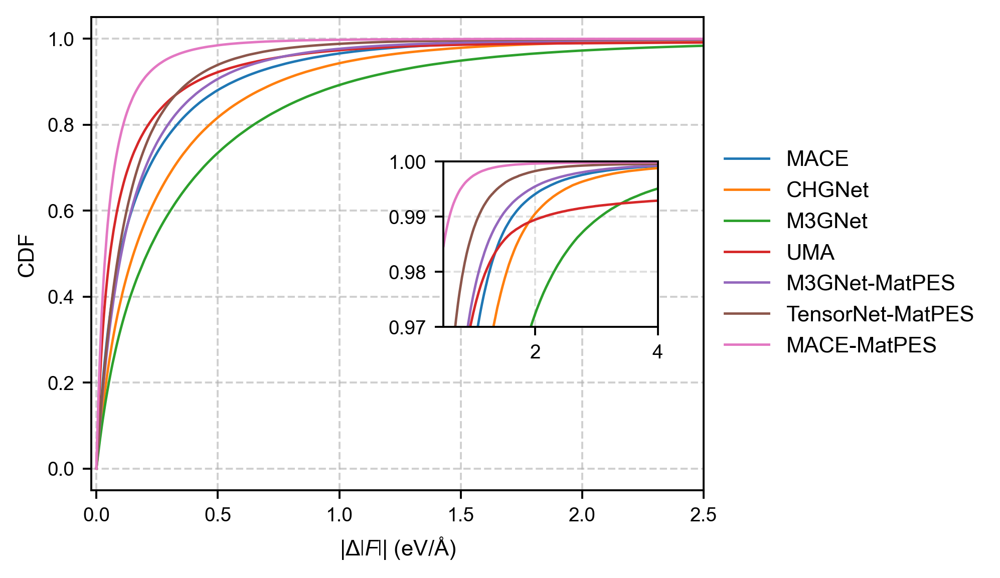

In [14]:
from fp_cdf_density_plots import PAPER_STYLE_CDF, plot_cdf_with_inset_on_ax
fig = plt.figure(figsize=(4.5, 3.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

plot_cdf_with_inset_on_ax(
    fig, gs[0, 0],
    cdf_results,
    kind         = "dF",
    # title        = (
    #     r"CDF of $|\Delta\left|F\right||$" 
    # ),
    xlabel       = r"$|\Delta\left|F\right||$ (eV/$\mathrm{\AA}$)",
    xlim_main    = (-0.02, 2.5),
    xlim_inset   = (0.5, 4.0),
    ylim_inset   = (0.97, 1.0),
    inset_bbox   = (0.25, 0.02, 1, 1),
    legend_bbox  = (1.02, 0.5),
    legend_loc   = "center left",
    legend_ncols = 1,
    show_legend  = True,
    **PAPER_STYLE_CDF,
)

plt.savefig("../outputs/matpes_pbe/cdf_dF.svg", bbox_inches="tight", dpi=350)
plt.show()

---
## Section 9 — CDF of $\Delta\theta$


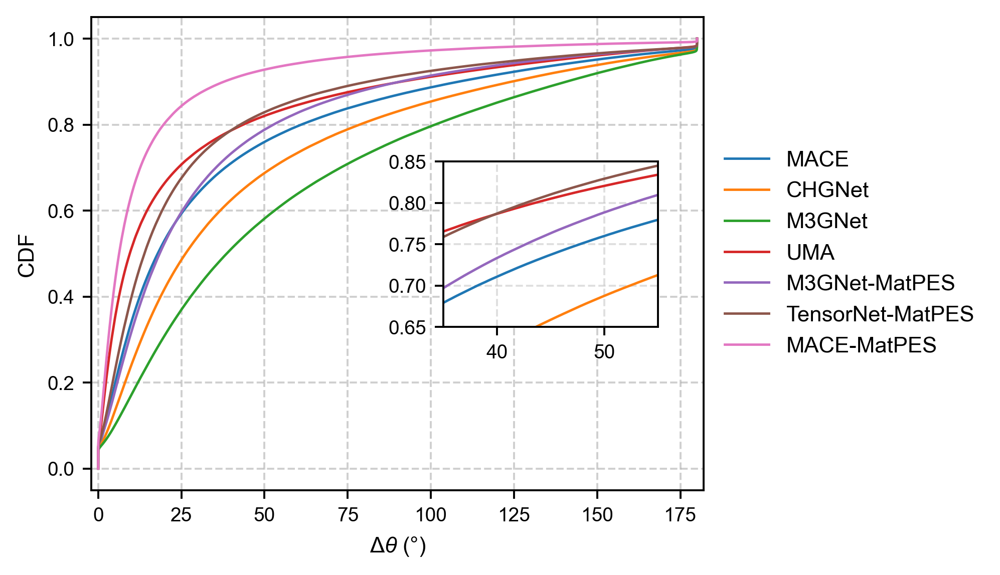

In [15]:
from fp_cdf_density_plots import PAPER_STYLE_CDF, plot_cdf_with_inset_on_ax
fig = plt.figure(figsize=(4.5, 3.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

plot_cdf_with_inset_on_ax(
    fig, gs[0, 0],
    cdf_results,
    kind         = "theta",
    # title        = (
    #     r"CDF of $\Delta\theta$" 
    # ),
    xlabel       = r"$\Delta\theta$ (°)",
    xlim_main    = (-2.0, 182),
    xlim_inset   = (35, 55),
    ylim_inset   = (0.65, 0.85),
    inset_bbox   = (0.25, 0.02, 1, 1),
    legend_bbox  = (1.02, 0.5),
    legend_loc   = "center left",
    legend_ncols = 1,
    show_legend  = True,
    **PAPER_STYLE_CDF,
)

plt.savefig("../outputs/matpes_pbe/cdf_dtheta.svg", bbox_inches="tight", dpi=350)
plt.show()

---
## Section 10 — Fraction Tables

`build_joint_dF_theta_accuracy_table` returns one DataFrame per angle thresholds (joint magnitude–angle accuracy):
- `tables[1]`  — fraction (%) of atoms with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 1°
- `tables[20]` — fraction (%) of atoms with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 20°

`build_highly_accurate_force_fraction_table` gives the $|\Delta|F||$-only fraction (no angle filter) — highly accurate force predictions.


- `DF_thresholds` — force-error thresholds to evaluate (eV/Å)
- `ANGLE_thresholds` — angular thresholds (degrees); `[1, 20]` gives the two standard cuts

In [16]:
# Column labels shared across all heatmaps
DF_thresholds = [0.01, 0.02, 0.05, 0.07, 0.1, 0.2, 0.5]   # eV/Å
ANGLE_thresholds = [1, 20]                                   # degrees
COL_LABELS = [
    r"$|\Delta\left|F\right||$"" < 0.01 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.02 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.05 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.07 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.1 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.2 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.5 eV/Å",
]

In [17]:
from force_error_metrics import build_highly_accurate_force_fraction_table, build_joint_dF_theta_accuracy_table
# Fraction tables for each angle cut (rows = models, cols = DF_CUTS)
tables = build_joint_dF_theta_accuracy_table(all_results, DF_thresholds, ANGLE_thresholds, fdf_min=FDFT_MIN)

# Restrict to included models
for ac in ANGLE_thresholds:
    tables[ac] = tables[ac].loc[models]

# Δ|F|-only fraction table (no angle filter)
df_frac = build_highly_accurate_force_fraction_table(all_results, DF_thresholds, fdf_min=FDFT_MIN).loc[models]
# Arrays for the split-triangle heatmap
# lower triangle ← fractions at Δθ < 1°
# upper triangle ← fractions at Δθ < 20°
vals_lower = tables[1].values    # shape (n_models, n_dF_cuts)
vals_upper = tables[20].values

print(f"Table shape: {vals_lower.shape}  ({len(models)} models × {len(DF_thresholds)} thresholds)")
tables[1]

Table shape: (7, 7)  (7 models × 7 thresholds)


,0.01,0.02,0.05,0.07,0.10,0.20,0.50
MACE,1.067193,1.962399,3.738956,4.415643,5.088508,6.014958,6.661298
CHGNet,0.662192,1.257331,2.487639,3.051063,3.656259,4.664085,5.457294
M3GNet,0.542902,1.019922,2.057235,2.554596,3.088423,4.025550,4.814057
UMA,2.791754,4.586469,7.186388,8.007352,8.739323,9.779678,10.483109
M3GNet-MatPES,0.919315,1.740832,3.483351,4.270621,5.082670,6.340864,7.092313
TensorNet-MatPES,0.975083,1.831888,3.660124,4.480040,5.336592,6.726774,7.570374
MACE-MatPES,3.876187,6.366999,9.708985,10.668057,11.437692,12.325479,12.730176


---
## Section 11 — Text Summary Table

Each cell shows `"p1 / p20"` where:
- `p1`  = fraction (%) at $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 1°
- `p20` = fraction (%) at $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 20°


In [18]:
df_summary = pd.DataFrame(index=models)

for thr in DF_thresholds:
    col_name = f"|Δ|F||<{thr} (Δθ<1°/20°) (%)"
    df_summary[col_name] = [
        f"{tables[1].loc[m, thr]:.2f} / {tables[20].loc[m, thr]:.2f}"
        for m in models
    ]

df_summary

,|Δ|F||<0.01 (Δθ<1°/20°) (%),|Δ|F||<0.02 (Δθ<1°/20°) (%),|Δ|F||<0.05 (Δθ<1°/20°) (%),|Δ|F||<0.07 (Δθ<1°/20°) (%),|Δ|F||<0.1 (Δθ<1°/20°) (%),|Δ|F||<0.2 (Δθ<1°/20°) (%),|Δ|F||<0.5 (Δθ<1°/20°) (%)
MACE,1.07 / 4.51,1.96 / 8.57,3.74 / 17.98,4.42 / 22.44,5.09 / 27.54,6.01 / 37.35,6.66 / 47.60
CHGNet,0.66 / 2.16,1.26 / 4.17,2.49 / 9.18,3.05 / 11.92,3.66 / 15.32,4.66 / 23.07,5.46 / 33.70
M3GNet,0.54 / 1.45,1.02 / 2.79,2.06 / 6.11,2.55 / 7.94,3.09 / 10.22,4.03 / 15.44,4.81 / 23.03
UMA,2.79 / 11.44,4.59 / 19.76,7.19 / 34.56,8.01 / 40.39,8.74 / 46.32,9.78 / 56.05,10.48 / 63.30
M3GNet-MatPES,0.92 / 3.75,1.74 / 7.26,3.48 / 16.01,4.27 / 20.67,5.08 / 26.24,6.34 / 37.46,7.09 / 48.32
TensorNet-MatPES,0.98 / 4.65,1.83 / 8.98,3.66 / 19.76,4.48 / 25.44,5.34 / 32.22,6.73 / 45.71,7.57 / 57.49
MACE-MatPES,3.88 / 15.35,6.37 / 26.95,9.71 / 47.50,10.67 / 55.26,11.44 / 62.75,12.33 / 73.48,12.73 / 79.28


---
## Section 12 — Joint Magnitude–Angle Accuracy Heatmap (Split Triangle)

Each cell is split diagonally:
- **Lower triangle** — fraction (%) with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 1°
- **Upper triangle** — fraction (%) with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 20°


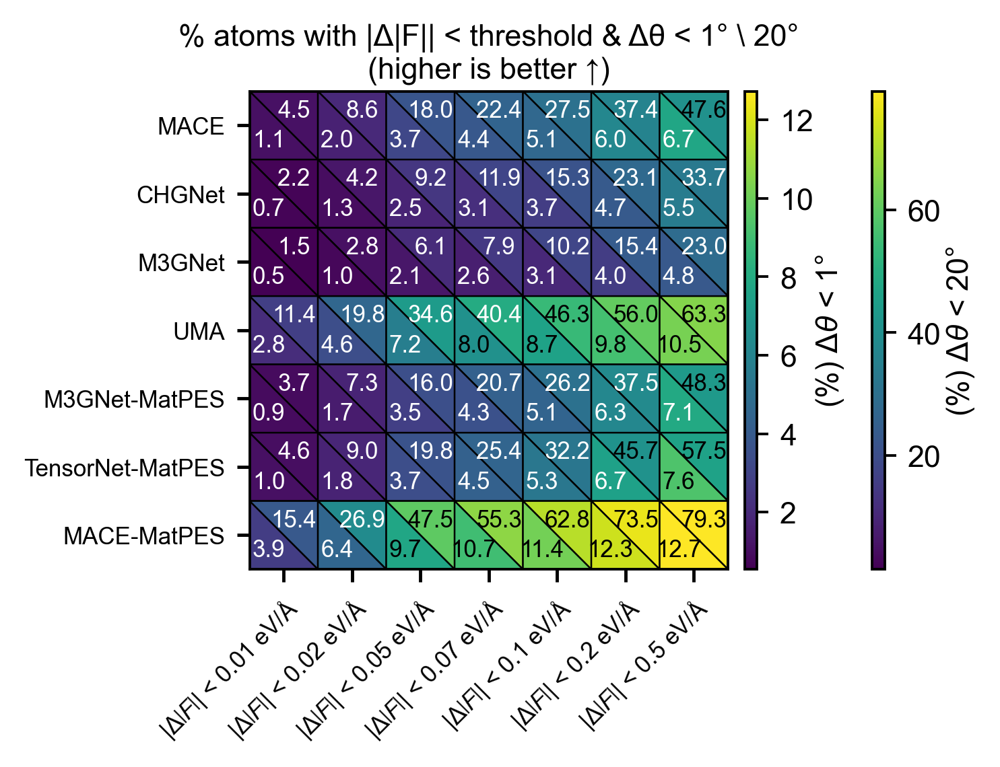

In [19]:
from force_error_metrics import split_triangle_heatmap

title = (
    "% atoms with |Δ|F|| < threshold & Δθ < 1° \\ 20°\n"
    "(higher is better ↑)"
)


fig, ax = split_triangle_heatmap(
    vals_lower, vals_upper,
    row_labels       = models,
    col_labels       = COL_LABELS,
    show_row_labels = True,
    title            = title,
    cmap_lower       = "viridis",
    cmap_upper       = "viridis",
    annotate         = True,
    fmt              = "{:.1f}",
    # sig_figs=2,
    textsize         = 7.2,
    addsize          = 0,
    # sig_figs         = 2,
    cbar_label_lower = r"(%) $\Delta\theta$ < 1°",
    cbar_label_upper = r"(%) $\Delta\theta$ < 20°",
    figsize          = (3.5, 5.5),
    gap              = 0.02,
    gap_between_cbars= 0.14,
    right=0.80, bottom=0.0225, top=1.0,
    savepath         = "../outputs/matpes_pbe/jsonfiles_for_summary_table/deltafdeltaangletable.svg",
)

---
## Section 13 — Highly Accurate Force Predictions

Fraction (%) of atoms with $|\Delta|F||$ < threshold.


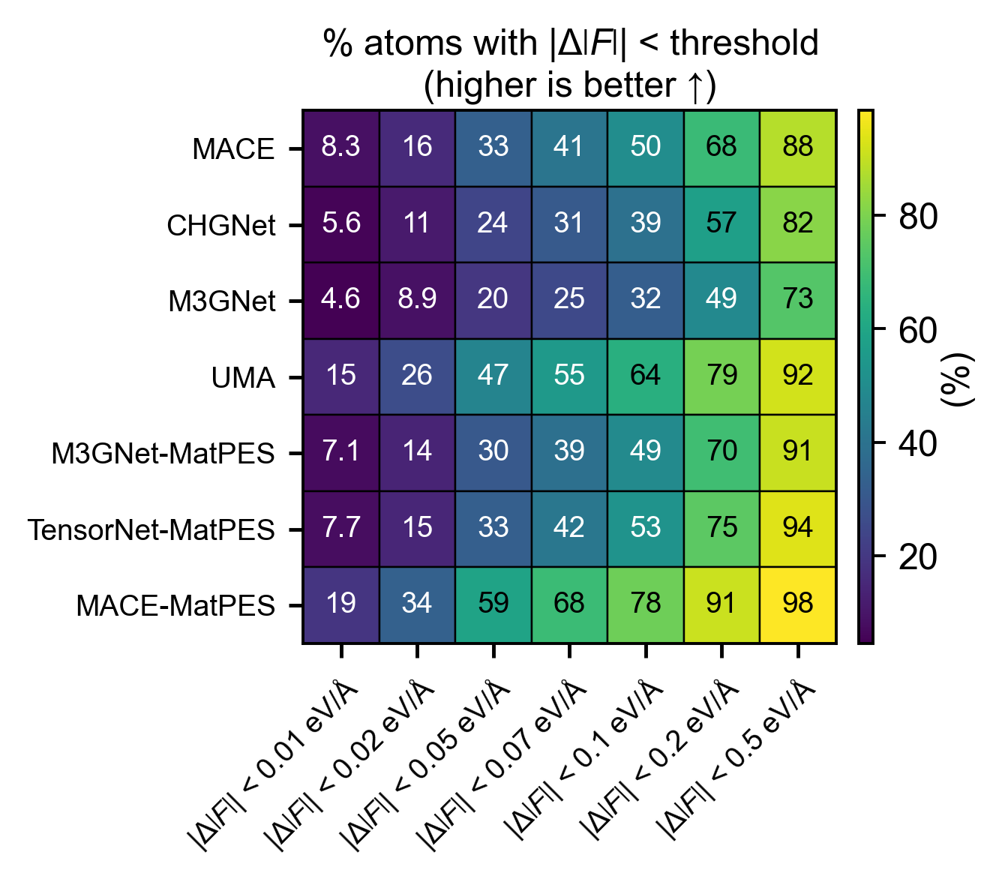

In [20]:
from force_error_metrics import single_heatmap
fig, ax = single_heatmap(
    data       = df_frac.values,
    row_labels = df_frac.index.tolist(),
    col_labels = COL_LABELS,
    title      = (
        "% atoms with "r"$|\Delta\left|F\right||$"" < threshold\n"
        "(higher is better ↑)"
    ),
    cmap       = "viridis",
    annotate   = True,
    show_row_labels = True,
    fmt        = "{:.1f}",
    textsize   = 8,
    addsize    = 0,
    cbar       = True,
    cbar_label = "(%)",
    sig_figs   = 2,
    figsize    = (3.5, 5.5),
    gap        = 0.025,
    right      = 0.80,
    bottom     = 0.02,
    top        = 1.0,
    savepath   = "../outputs/matpes_pbe/jsonfiles_for_summary_table/df_frac_heatmap.svg",
)

---
## Section 14 — Combined Panel

Left panel: highly accurate force predictions (Section 13).  
Right panel: joint magnitude–angle accuracy (Section 12).


Text(-25, -1, '(b)')

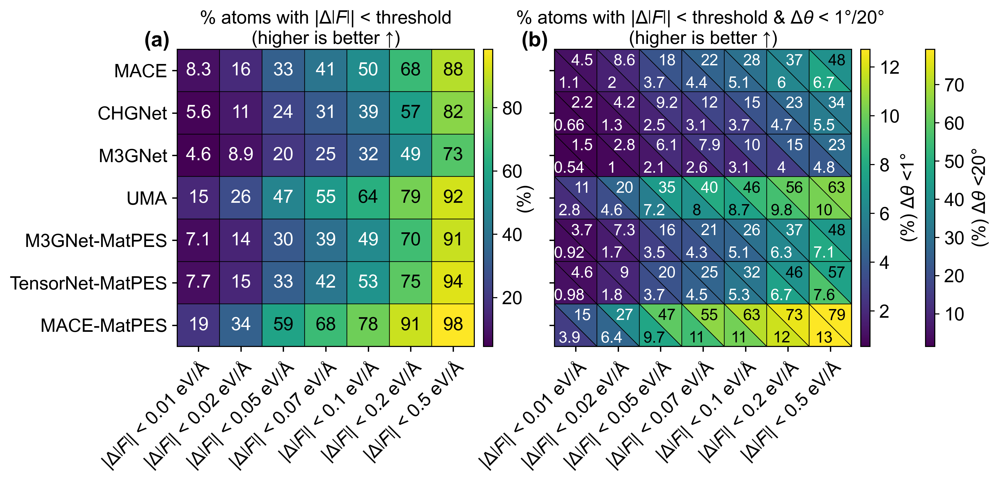

In [21]:
import importlib
import force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import merged_heatmaps

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"        # ← keep text editable in Inkscape
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"                                                                                                                                                               
fig, (ax_l, ax_r) = merged_heatmaps(
    # ── Left panel ─────────────────────────────────────────────────────                                                                                                   
    data_left       = df_frac.values,                                                                                                                                          
    col_labels_left = COL_LABELS,                                                                                                                                            
    title_left      = r"% atoms with $|\Delta\left|F\right||$ < threshold ""\n(higher is better ↑)",                                                                                                                
    cmap_left       = "viridis",                                                                                                                                               
    fmt_left        = "{:.1f}",   
    sig_figs_left=2,                                                                                                                                           
    textsize_left  = 14,    # numbers inside left panel cells     
    labelpad_left=-5,                                                                                                                                                                                                                                                                                              
    cbar_label_left = "(%)",                                                                                                                                                   
                                                                                                                                                                                
    # ── Right panel ────────────────────────────────────────────────────                                                                                                    
    data_lower        = vals_lower,                                                                                                                                            
    data_upper        = vals_upper,                                                                                                                                          
    col_labels_right  = COL_LABELS,                                                                                                                                            
    title_right       = r"% atoms with $|\Delta\left|F\right||$ < threshold & $\Delta\theta$ < 1°/20°  ""\n(higher is better ↑)",
    cmap_lower        = "viridis",                                                                                                                                             
    cmap_upper        = "viridis",                                                                                                                                             
    fmt_right         = "{:.1f}",                                                                                                                                              
    sig_figs_right    = 2,                                                                                                                                                     
    textsize_right = 12 , # numbers inside right panel cells                                                                                                                                                                                                                                                                                                   
    cbar_label_lower  = r"(%) $\Delta\theta$ <1°",                                                                                                                                         
    cbar_label_upper  = r"(%) $\Delta\theta$ <20°",   
    cbar_upper_labelpad=5,     
    text_lower_x=0.35,                                                                                                                                   
                                                                                                                                                                                
    # ── Shared ─────────────────────────────────────────────────────────                                                                                                    
    row_labels            = models,                                                                                                                                            
    show_row_labels_left  = True,                                                                                                                                              
    # suptitle              = r"Atoms with $|F_\mathrm{DFT}|$ > 0.01 eV/Å",                                                                                 
    fontsize       = 14,    # everything else: titles, tick labels, cbar labels, suptitle                                                                                                                                              
    suptitle_y            = 1.12,    
    suptitle_x = .7,   # shift right until it sits over the centre of both panels  
    text_lower_y=0.81,  # default 0.72; decrease to move text down                                                                                                                                                                                                                               
                                                                                                                                                                                
    # ── Layout knobs ───────────────────────────────────────────────────                                                                                                      
    figsize              = (6.5, 3.5),                                                                                                                                       
    bottom               = 0.025,                                                                                                                                              
    top                  = 0.92,                                                                                                                                             
    left_margin          = 0.12,       # ← adjust to move panels left/right                                                                                                    
    gap_between_panels   = 0.1,       # ← space between left cbar and right panel                                                                                             
    cbar_width           = 0.015,                                                                                                                                              
    gap_cbar_left        = 0.015,      # ← left panel: gap to its colorbar                                                                                                     
    gap_cbar_right       = 0.015,       # ← right panel: gap to first colorbar                                                                                                  
    gap_between_cbars    = 0.09,       # ← right panel: gap between the two cbars                                                                                            
                                                                                                                                                                                
    savepath = None,                                                                                                             
)
ax_l.annotate("(a)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-25, -1), textcoords="offset points",
              fontsize=16, fontweight="bold", va="bottom",
              annotation_clip=False)
ax_r.annotate("(b)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-25, -1), textcoords="offset points",
              fontsize=16, fontweight="bold", va="bottom",
              annotation_clip=False)
# fig          # ← last line, no fig.show()

---
## Section 15 — Large-Force-Error Atoms

Fraction (%) of atoms where **$|\Delta|F||$ > threshold.  


,0.5,1.0,2.0,3.0,4.0,5.0,7.0,10.0
MACE,11.9540,3.4383,0.5898,0.1935,0.0832,0.0465,0.0250,0.0179
CHGNet,18.3383,5.7073,0.9448,0.2903,0.1221,0.0686,0.0359,0.0228
M3GNet,26.5532,10.7887,2.7566,1.0557,0.4927,0.2608,0.1034,0.0347
UMA,7.7849,2.6864,1.0552,0.8083,0.7115,0.6542,0.5830,0.5197
M3GNet-MatPES,9.3628,2.3549,0.4522,0.1586,0.0728,0.0400,0.0203,0.0131
TensorNet-MatPES,6.0801,1.1964,0.1747,0.0653,0.0428,0.0329,0.0241,0.0177
MACE-MatPES,1.5349,0.2493,0.0391,0.0213,0.0165,0.0142,0.0114,0.0099


/var/folders/c7/561v21vd5gnffvjyfdtmglm00000gn/T/ipykernel_5336/3915828420.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


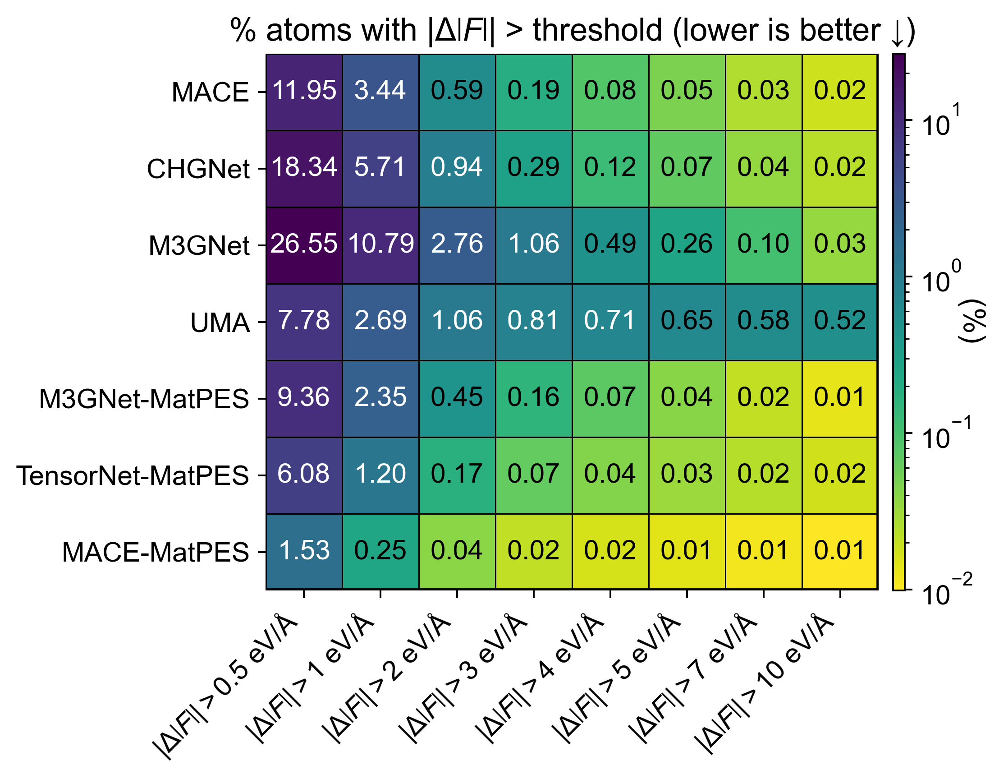

In [22]:
import matplotlib.ticker as ticker
from matplotlib.colors import LogNorm
from heatmap_table import (
    create_figure, setup_frame, setup_ticks_and_labels,
    draw_rectangular_column, add_colorbar,
)
from force_error_metrics import build_large_force_error_fraction_table
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"        # ← keep text editable in Inkscape
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"
# ── Config ─────────────────────────────────────────────────────────────────
DF_FRAC_THRESH_LARGE = [0.5, 1, 2, 3, 4, 5, 7, 10]   # eV/Å

text_size = 12.5
figsize   = (6.0, 4.5)

# ── Compute ─────────────────────────────────────────────────────────────────
df_frac_larger = build_large_force_error_fraction_table(
    all_results_filtered, DF_FRAC_THRESH_LARGE, fdf_min=FDFT_MIN
)

display(df_frac_larger)

# ── Plot ─────────────────────────────────────────────────────────────────────
col_labels_large = [rf"$|\Delta\left|F\right|| > {thr:g}$ eV/Å" for thr in DF_FRAC_THRESH_LARGE]
models_large     = df_frac_larger.index.tolist()
nrows_l, ncols_l = df_frac_larger.shape

vals = df_frac_larger.values.astype(float)
norm = LogNorm(
    vmin=np.nanmin(vals[vals > 0]) if np.any(vals > 0) else 1e-2,
    vmax=np.nanmax(vals),
)
cmap = plt.cm.viridis_r

fig, ax, (cax,) = create_figure(
    ncols_l, n_colorbars=1,
    figsize=figsize, dpi=350,
    wspace=0.35, colorbar_nudge=0.10,
)
ax.set_xlim(0, ncols_l)
ax.set_ylim(0, nrows_l)
ax.set_aspect("equal")

for j, col in enumerate(df_frac_larger.columns):
    draw_rectangular_column(
        ax, col_idx=j, nrows=nrows_l,
        vals=df_frac_larger[col].values,
        cmap=cmap, norm=norm,
        # sig_figs=2,            # ← replaces fmt="{:.2f}"
        fmt="{:.2f}",
        text_size=text_size,
    )

setup_frame(ax, ncols_l, nrows_l)
setup_ticks_and_labels(
    ax,
    ncols=ncols_l, nrows_data=nrows_l, nrows_total=nrows_l,
    row_labels=models_large, col_labels=col_labels_large,
    title=(
        r"% atoms with $|\Delta\left|F\right||$ > threshold (lower is better ↓)" 
    ),
    xlabel="", extra_row_label=None, text_size=text_size,
)

cb = add_colorbar(fig, ax, cax, cmap=cmap, norm=norm,
                  label="(%)", text_size=text_size)
cb.set_label("(%)", fontsize=text_size + 1, rotation=270, labelpad=5)
cb.ax.yaxis.set_major_locator(ticker.LogLocator(base=10, numticks=6))
cb.ax.yaxis.set_major_formatter(ticker.LogFormatterMathtext())
cb.ax.tick_params(which="minor", length=2)

plt.tight_layout()
fig.savefig("../outputs/matpes_pbe/fraction_table_large_errors.svg", bbox_inches="tight", dpi=350, pad_inches=0.05)
plt.show()

---
## Section 16 — $\Delta|F|$ MAE/RMSE over $|F_{\mathrm{DFT}}|$ Subsets

- Lower-left triangle  ← MAE
- Upper-right triangle ← RMSE
- Fraction header row  ← % of all atoms with $|F_{\mathrm{DFT}}|$ > threshold 


In [23]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import (
    build_dF_mae_rmse_fdft_subset,
    merge_mae_rmse_as_string,
    build_fdft_distribution_fraction_table,
)

# ── Config ────────────────────────────────────────────────────────────────────
FDFT_SUBSET_THRESHOLDS = [0, 0.01, 0.05, 0.1, 0.2, 0.5, 0.7, 1.0, 2.0]   # eV/Å

# ── Compute MAE / RMSE tables ─────────────────────────────────────────────────
dF_mae_fdft_subset, dF_rmse_fdft_subset = build_dF_mae_rmse_fdft_subset(
    all_results_filtered, FDFT_SUBSET_THRESHOLDS
)

print("MAE of |F| (eV/Å)  for atoms with |F_DFT| > threshold")
display(dF_mae_fdft_subset)
print("\nRMSE of |F| (eV/Å)  for atoms with |F_DFT| > threshold")
display(dF_rmse_fdft_subset)

# ── Merged string table ───────────────────────────────────────────────────────
df_fdft_subset_merged = merge_mae_rmse_as_string(dF_mae_fdft_subset, dF_rmse_fdft_subset)
print("\nMAE / RMSE (eV/Å)")
display(df_fdft_subset_merged)

# ── Fraction header row: avg % atoms with |F_DFT| > threshold ─────────────────
frac_fdft_subset = build_fdft_distribution_fraction_table(all_results_filtered, FDFT_SUBSET_THRESHOLDS)
frac_row_fdft_subset = frac_fdft_subset.mean(axis=0).map(lambda x: f"{x:.1f}")
frac_row_fdft_subset.index = FDFT_SUBSET_THRESHOLDS

col_labels_fdft_subset = (
    ["All atoms"]
    + [rf"$|F_{{\mathrm{{DFT}}}}| > {thr:g}$  eV/Å" for thr in FDFT_SUBSET_THRESHOLDS[1:]]
)


MAE of |F| (eV/Å)  for atoms with |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,0.2278,0.2334,0.2574,0.2824,0.3129,0.3737,0.4189,0.4944,0.8134
CHGNet,0.3059,0.3138,0.3446,0.3775,0.4195,0.5117,0.5811,0.6971,1.1510
M3GNet,0.4247,0.4352,0.4750,0.5158,0.5691,0.6987,0.8003,0.9757,1.6717
UMA,0.5413,0.5556,0.6137,0.6728,0.7387,0.8576,0.9502,1.1285,1.8350
M3GNet-MatPES,0.2037,0.2083,0.2246,0.2420,0.2647,0.3194,0.3609,0.4319,0.7260
TensorNet-MatPES,0.1693,0.1727,0.1834,0.1949,0.2103,0.2498,0.2805,0.3334,0.5700
MACE-MatPES,0.0815,0.0833,0.0904,0.0975,0.1061,0.1251,0.1391,0.1628,0.2721



RMSE of |F| (eV/Å)  for atoms with |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,1.9009,1.9287,2.0479,2.1681,2.3234,2.7183,3.0448,3.6486,6.5167
CHGNet,2.1553,2.1887,2.3239,2.4602,2.6364,3.0849,3.4557,4.1413,7.3887
M3GNet,1.4697,1.4919,1.5809,1.6693,1.7832,2.0752,2.3160,2.7579,4.8030
UMA,7.8230,7.9311,8.3572,8.7719,9.2222,10.0035,10.6495,11.8948,16.1232
M3GNet-MatPES,1.2222,1.2410,1.3169,1.3934,1.4924,1.7449,1.9536,2.3391,4.1627
TensorNet-MatPES,1.3686,1.3897,1.4748,1.5608,1.6719,1.9561,2.1916,2.6277,4.7019
MACE-MatPES,1.0884,1.1043,1.1725,1.2413,1.3302,1.5573,1.7455,2.0943,3.7567



MAE / RMSE (eV/Å)


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,0.228 / 1.901,0.233 / 1.929,0.257 / 2.048,0.282 / 2.168,0.313 / 2.323,0.374 / 2.718,0.419 / 3.045,0.494 / 3.649,0.813 / 6.517
CHGNet,0.306 / 2.155,0.314 / 2.189,0.345 / 2.324,0.378 / 2.460,0.419 / 2.636,0.512 / 3.085,0.581 / 3.456,0.697 / 4.141,1.151 / 7.389
M3GNet,0.425 / 1.470,0.435 / 1.492,0.475 / 1.581,0.516 / 1.669,0.569 / 1.783,0.699 / 2.075,0.800 / 2.316,0.976 / 2.758,1.672 / 4.803
UMA,0.541 / 7.823,0.556 / 7.931,0.614 / 8.357,0.673 / 8.772,0.739 / 9.222,0.858 / 10.004,0.950 / 10.649,1.129 / 11.895,1.835 / 16.123
M3GNet-MatPES,0.204 / 1.222,0.208 / 1.241,0.225 / 1.317,0.242 / 1.393,0.265 / 1.492,0.319 / 1.745,0.361 / 1.954,0.432 / 2.339,0.726 / 4.163
TensorNet-MatPES,0.169 / 1.369,0.173 / 1.390,0.183 / 1.475,0.195 / 1.561,0.210 / 1.672,0.250 / 1.956,0.281 / 2.192,0.333 / 2.628,0.570 / 4.702
MACE-MatPES,0.082 / 1.088,0.083 / 1.104,0.090 / 1.173,0.098 / 1.241,0.106 / 1.330,0.125 / 1.557,0.139 / 1.746,0.163 / 2.094,0.272 / 3.757


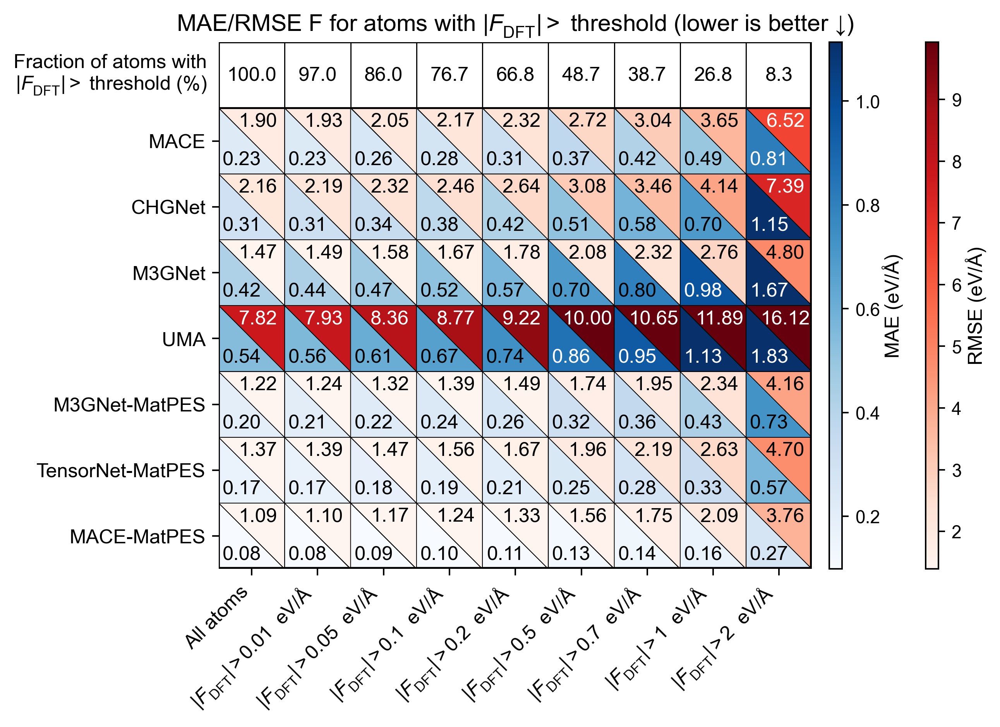

In [24]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import triangular_heatmap_with_fraction_row_word_style

# ── Plot — vertical colorbars on the right ────────────────────────────────────
fig, ax = triangular_heatmap_with_fraction_row_word_style(
    mae_df       = dF_mae_fdft_subset,
    rmse_df      = dF_rmse_fdft_subset,
    frac_row_str = frac_row_fdft_subset,
    col_labels   = col_labels_fdft_subset,
    title        = (
        r"$\Delta|F|$ MAE/RMSE " 
        r"for atoms with $|F_{\mathrm{DFT}}| >$ threshold (lower is better ↓)"
    ),
    cmap_mae  = "Blues",
    cmap_rmse = "Reds",
    figsize   = (6.3, 8),
    fmt_mae   = "{:.2f}",
    fmt_rmse  = "{:.2f}",
    # sig_figs  = 3,
    text_size = 10.5,
    rmse_text_x_nudge = -0.055,   # shift left  (negative = left)
    rmse_text_y_nudge =  0.02,   # shift up    (positive = up)
    # ── side colorbars ────────────────────────────────────────────────────
    cbar_labelpad_mae  = 1,    # MAE colorbar label padding
    cbar_labelpad_rmse = 2,   # increase this to push RMSE label further right
    cbar_side             = True,
    cbar_width_right      = 0.015,   # width of each vertical colorbar
    cbar_gap_right        = 0.02,    # gap: table right edge → first colorbar
    cbar_between_gap_right= 0.098,    # gap: first colorbar → second colorbar
    right                 = 0.82,    # subplots_adjust right (decrease to push table left)
    bottom_side           = 0.05,    # subplots_adjust bottom (small; nothing below)
    xlabel = "",   # hides "thresholds" label, keeps tick values
    savepath  = "../outputs/matpes_pbe/jsonfiles_for_summary_table/fdft_conditioned_mae_rmse_side.svg",
)


---
## Section 17 — Far-From-Equilibrium (FE) $r_F$ Fractions

Atoms are split by $|F_{\mathrm{DFT}}|$ into two regimes:
- far-from-equilibrium (FE): $|F_{\mathrm{DFT}}|$ > 1 eV/Å
- non-FE: $|F_{\mathrm{DFT}}|$ ≤ 1 eV/Å


The figure shows the FE regime only: fraction (%) of FE atoms with relative force-magnitude
error $r_F$ = $|\Delta|F||$ / $|F_{\mathrm{DFT}}|$ below each threshold.

The non-FE atoms panel and the absolute-threshold ($|\Delta|F||$ < x) panels for both
regimes are supporting analyses — see the SI section immediately below.


Panel A — |F_DFT| <= 1.0 eV/Å


,N atoms,Frac of all atoms (%),$|\Delta\left|F\right|| < 0.01$ eV/Å (%),$|\Delta\left|F\right|| < 0.02$ eV/Å (%),$|\Delta\left|F\right|| < 0.05$ eV/Å (%),$|\Delta\left|F\right|| < 0.07$ eV/Å (%),$|\Delta\left|F\right|| < 0.1$ eV/Å (%),$|\Delta\left|F\right|| < 0.2$ eV/Å (%),$|\Delta\left|F\right|| < 0.5$ eV/Å (%),r < 0.01 (%),r < 0.05 (%),r < 0.1 (%),r < 0.2 (%),r < 0.3 (%),r < 0.4 (%),r < 0.5 (%),r < 1 (%),r < 2 (%)
MACE,2574474.0,72.3378,10.6314,20.2351,41.4020,50.9435,61.1840,79.1338,95.2244,2.0933,10.2564,19.5735,34.4006,45.5217,54.1683,61.2536,87.9892,94.0596
CHGNet,2575344.0,72.3444,7.3424,14.2416,30.9794,39.6344,49.8279,70.8657,93.6671,1.2239,6.0828,12.1386,23.8420,34.8485,44.7573,53.5080,83.5528,90.5928
M3GNet,2574895.0,72.3409,6.0602,11.7959,25.7913,33.2640,42.3755,62.5754,88.8698,0.9479,4.6762,9.3279,18.7057,28.0091,37.1308,45.9261,78.2908,86.2379
UMA,2575344.0,72.3444,18.4123,31.6357,54.0591,62.4530,70.7312,84.1113,95.3315,4.6598,19.8500,32.2616,47.1485,56.1902,62.7098,68.0142,89.7293,94.5568
M3GNet-MatPES,2574895.0,72.3409,9.0116,17.4485,37.7301,47.9129,59.6268,81.1264,97.2932,1.9704,9.7672,19.0614,35.1711,47.8381,57.6229,65.1366,83.1430,90.1764
TensorNet-MatPES,2574894.0,72.3409,9.4112,18.1160,39.2021,49.8473,62.0879,84.0151,98.1367,2.3804,11.6966,22.2532,39.0561,51.2355,60.0334,66.5460,81.9688,89.1399
MACE-MatPES,2574474.0,72.3378,23.2105,40.3008,67.9744,77.3109,85.5522,95.6332,99.6119,5.8179,25.7437,42.9096,62.6815,73.4646,80.0837,84.5422,94.0386,97.2452


Panel B — |F_DFT| > 1.0 eV/Å


,N atoms,Frac of all atoms (%),$|\Delta\left|F\right|| < 0.01$ eV/Å (%),$|\Delta\left|F\right|| < 0.02$ eV/Å (%),$|\Delta\left|F\right|| < 0.05$ eV/Å (%),$|\Delta\left|F\right|| < 0.07$ eV/Å (%),$|\Delta\left|F\right|| < 0.1$ eV/Å (%),$|\Delta\left|F\right|| < 0.2$ eV/Å (%),$|\Delta\left|F\right|| < 0.5$ eV/Å (%),r < 0.01 (%),r < 0.05 (%),r < 0.1 (%),r < 0.2 (%),r < 0.3 (%),r < 0.4 (%),r < 0.5 (%),r < 1 (%),r < 2 (%)
MACE,984487.0,27.6622,2.3320,4.6239,11.4243,15.7572,21.8869,38.9992,69.2741,4.0003,18.9038,34.5654,57.1796,71.8156,81.2600,87.2225,99.2893,99.8904
CHGNet,984497.0,27.6556,1.0953,2.1939,5.4931,7.6477,10.8829,21.4806,50.2566,1.9131,9.4267,18.4022,35.3630,50.8166,64.4428,75.6494,99.4714,99.9317
M3GNet,984494.0,27.6591,0.6401,1.2591,3.1881,4.4629,6.3823,12.8096,33.1088,1.0746,5.3526,10.5386,20.9741,31.6534,42.9182,54.6679,98.3374,99.6302
UMA,984497.0,27.6556,6.5428,12.6961,28.0379,35.9753,45.3821,64.6589,84.0627,11.0680,42.0360,61.9976,78.9259,85.6324,89.1105,91.2545,97.9836,98.5885
M3GNet-MatPES,984494.0,27.6591,2.2628,4.5102,11.2837,15.6478,21.9119,40.0369,73.2288,3.9371,19.0585,35.2505,59.0393,74.6876,84.7730,91.2497,99.8266,99.9868
TensorNet-MatPES,984494.0,27.6591,3.0972,6.1672,15.0628,20.7390,28.7411,50.4955,82.8912,5.2231,24.8669,45.1776,71.8479,85.7814,92.8841,96.4133,99.9160,99.9946
MACE-MatPES,984487.0,27.6622,8.0571,15.7013,35.2437,45.3460,57.0354,78.7786,95.4663,13.9421,52.5369,75.3023,91.7501,96.6469,98.4012,99.1214,99.9930,99.9998


scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


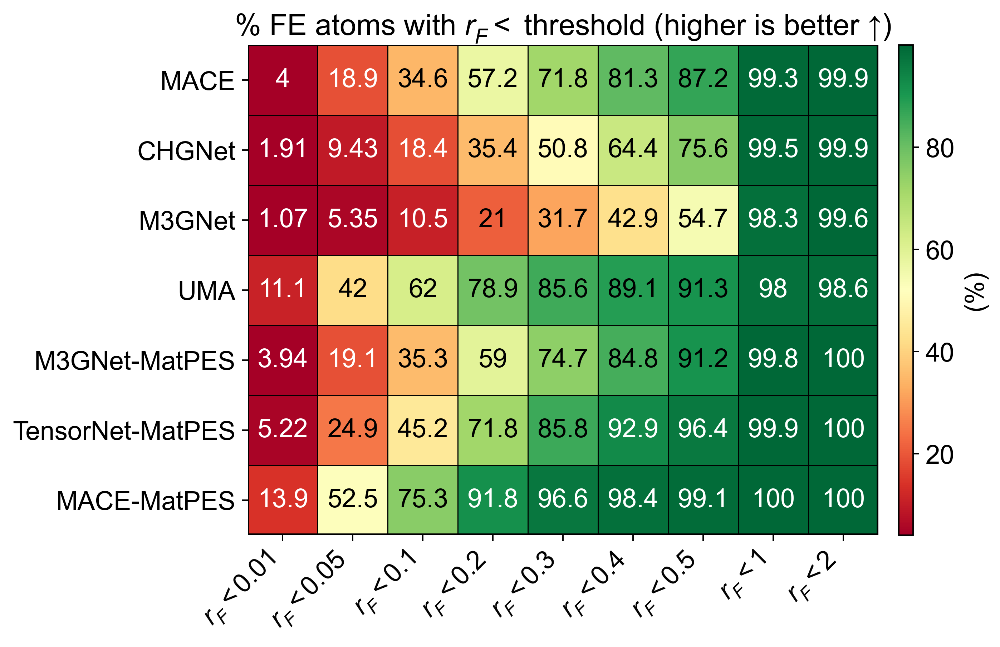

In [25]:
import importlib, heatmap_table, force_error_metrics
importlib.reload(heatmap_table)
importlib.reload(force_error_metrics)
from heatmap_table import plot_fraction_panel
from force_error_metrics import build_far_from_equilibrium_regime_panels

# ── Config ──────────────────────────────────────────────────────────────────
ABS_THRESH = [0.01, 0.02, 0.05,0.07, 0.1, 0.2, 0.5]
REL_THRESH = [0.01, 0.05, 0.10, 0.20, 0.3, 0.4, 0.50, 1, 2]
THRESHOLD  = 1.0    # eV/Å boundary between panels

fig_w        = 6.5
fig_h        = 5.98
text_size    = 15
cbar_gap     = 0.115
cbar_lbl_pad = 5

# ── Build DataFrames ─────────────────────────────────────────────────────────
df_panel_A, df_panel_B = build_far_from_equilibrium_regime_panels(
    all_results_filtered,
    abs_thresh=ABS_THRESH,
    rel_thresh=REL_THRESH,
    threshold=THRESHOLD,
    fdf_min=FDFT_MIN,
)

print(f"Panel A — |F_DFT| <= {THRESHOLD} eV/Å")
display(df_panel_A)
print(f"Panel B — |F_DFT| > {THRESHOLD} eV/Å")
display(df_panel_B)

# Column subsets to pass to plot_fraction_panel
abs_cols = (["N atoms", "Frac of all atoms (%)"]
            + [rf"$|\Delta\left|F\right|| < {thr}$ eV/Å (%)" for thr in ABS_THRESH])
rel_cols = (["N atoms", "Frac of all atoms (%)"]
            + [f"r < {thr} (%)" for thr in REL_THRESH])

# Actual column names in df_panel_A / df_panel_B
rel_cols_raw = [f"r < {thr:g} (%)" for thr in REL_THRESH]

# Pretty labels for plotting
rel_cols_pretty = [rf"$r_F < {thr:g}$ (%)" for thr in REL_THRESH]

rel_rename = dict(zip(rel_cols_raw, rel_cols_pretty))

df_panel_A_rel_plot = (
    df_panel_A[["N atoms", "Frac of all atoms (%)"] + rel_cols_raw]
    .rename(columns=rel_rename)
)

df_panel_B_rel_plot = (
    df_panel_B[["N atoms", "Frac of all atoms (%)"] + rel_cols_raw]
    .rename(columns=rel_rename)
)

frac_avg_A = df_panel_A["Frac of all atoms (%)"].mean()

#  FE atoms subset, relative-error fractions ────────────────────────────
# (The other 3 regime panels — non-FE absolute, non-FE relative, FE absolute —
#  are supporting analyses; see the SI section immediately below.)

plot_fraction_panel(
    df_panel_B_rel_plot,
    # fmt="{:.2f}",
    panel_title="% FE atoms with $r_F <$ threshold (higher is better ↑)",
    mae_cmap=plt.cm.Purples, rmse_cmap=plt.cm.Oranges,
    fig_w=fig_w, fig_h=fig_h,
    text_size=text_size,
    sig_figs=3,  
    save_path="../outputs/matpes_pbe/far_from_equilibrium_summary_rel.svg",
    cbar_gap=cbar_gap, cbar_label_pad=cbar_lbl_pad,
    show_regime_row=False,
)


---
# SI — Supporting Analyses


---
## Section 18 — SI: Force-Vector Error — Highly Accurate Force Predictions

Force-vector-error ($e_\mathrm{vec}$) counterpart of Section 13 (Highly Accurate Force Predictions). Fraction (%) of atoms with $e_\mathrm{vec}$ < threshold — no angle filter.


,0.01,0.02,0.05,0.07,0.10,0.20,0.50
MACE,1.55,4.08,14.62,21.45,30.25,50.17,78.16
CHGNet,0.93,2.35,8.62,13.50,20.52,38.57,68.72
M3GNet,0.77,1.93,6.80,10.57,16.08,30.78,57.69
UMA,4.11,10.42,27.30,35.76,45.71,65.76,86.57
M3GNet-MatPES,1.23,3.16,11.44,17.66,26.52,48.57,78.75
TensorNet-MatPES,1.30,3.33,12.22,19.00,28.89,54.55,85.96
MACE-MatPES,5.46,13.51,35.58,46.57,58.76,80.26,96.10


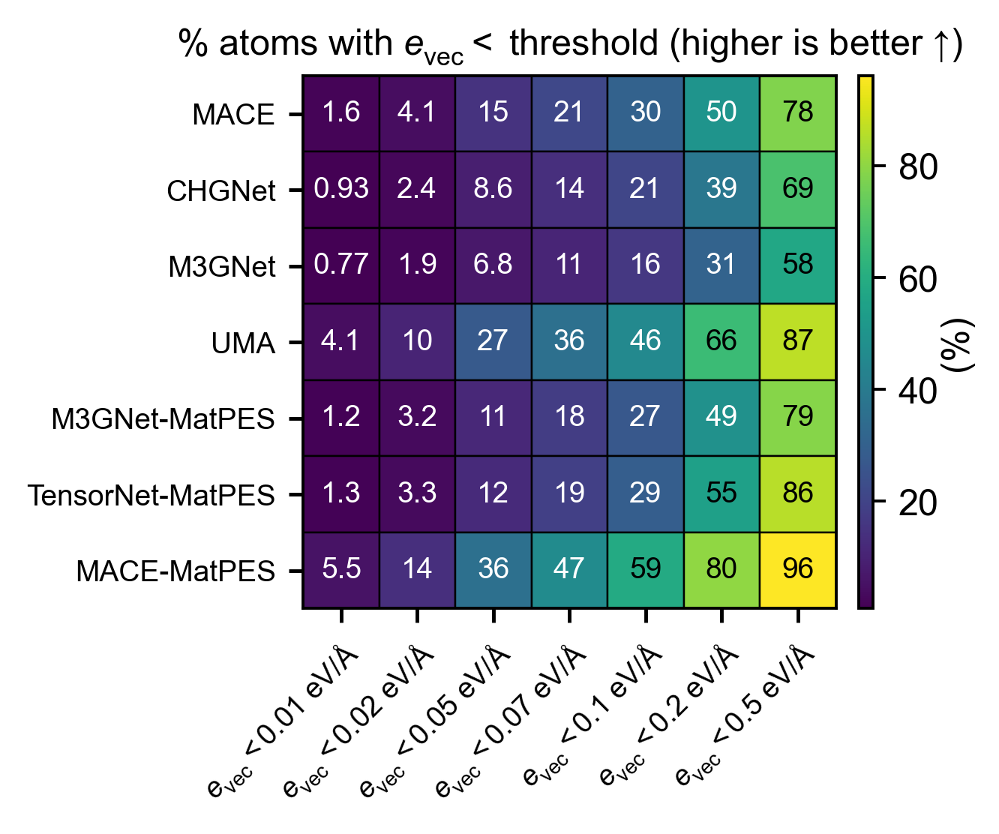

In [26]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import build_evec_high_accuracy_fraction_table, single_heatmap

# ── Config ────────────────────────────────────────────────────────────────────
EVEC_HIGH_ACCURACY_THRESHOLDS = [0.01, 0.02, 0.05, 0.07, 0.1, 0.2, 0.5]   # eV/Å — same grid as Section 13

df_evec_frac = build_evec_high_accuracy_fraction_table(
    all_results_filtered, EVEC_HIGH_ACCURACY_THRESHOLDS, fdf_min=FDFT_MIN
)
display(df_evec_frac)

col_labels_evec = [rf"$e_\mathrm{{vec}} < {thr:g}$ eV/Å" for thr in EVEC_HIGH_ACCURACY_THRESHOLDS]

# ── Fonts (match paper — Arial everywhere, including mathtext) ────────────
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"        # ← keep text editable in Inkscape
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"

fig, ax = single_heatmap(
    data       = df_evec_frac.values,
    row_labels = df_evec_frac.index.tolist(),
    col_labels = col_labels_evec,
    title      = (
        r"% atoms with $e_\mathrm{vec} <$ threshold"
        " (higher is better ↑)"
    ),
    cmap       = "viridis",
    annotate   = True,
    show_row_labels = True,
    fmt        = "{:.1f}",
    textsize   = 8,
    addsize    = 0,
    cbar       = True,
    title_pad  = 6,
    cbar_label = "(%)",
    sig_figs   = 2,
    figsize    = (3.5, 5.5),
    gap        = 0.025,
    right      = 0.80,
    bottom     = 0.02,
    top        = 1.0,
    savepath   = "../outputs/matpes_pbe/jsonfiles_for_summary_table/evec_frac_heatmap.svg",
)


---
## Section 19 — SI: Force-Vector Error — Large-Force-Vector-Error Atoms

Force-vector-error counterpart of Section 15 (Large-Force-Error Atoms). Fraction (%) of atoms where $e_\mathrm{vec}$ > threshold.


,0.5,1.0,2.0,3.0,4.0,5.0,7.0,10.0
MACE,21.8424,6.9959,1.3976,0.5277,0.2294,0.1130,0.0381,0.0188
CHGNet,31.2768,10.9384,2.0260,0.6388,0.2452,0.1187,0.0453,0.0249
M3GNet,42.3135,19.6286,5.5649,2.2876,1.1084,0.5768,0.2017,0.0575
UMA,13.4303,4.7753,1.4052,0.9360,0.7807,0.6966,0.6087,0.5352
M3GNet-MatPES,21.2509,6.2764,1.2237,0.4165,0.1723,0.0827,0.0289,0.0140
TensorNet-MatPES,14.0439,3.0818,0.4409,0.1140,0.0535,0.0371,0.0263,0.0187
MACE-MatPES,3.8973,0.6663,0.0670,0.0264,0.0183,0.0152,0.0123,0.0100


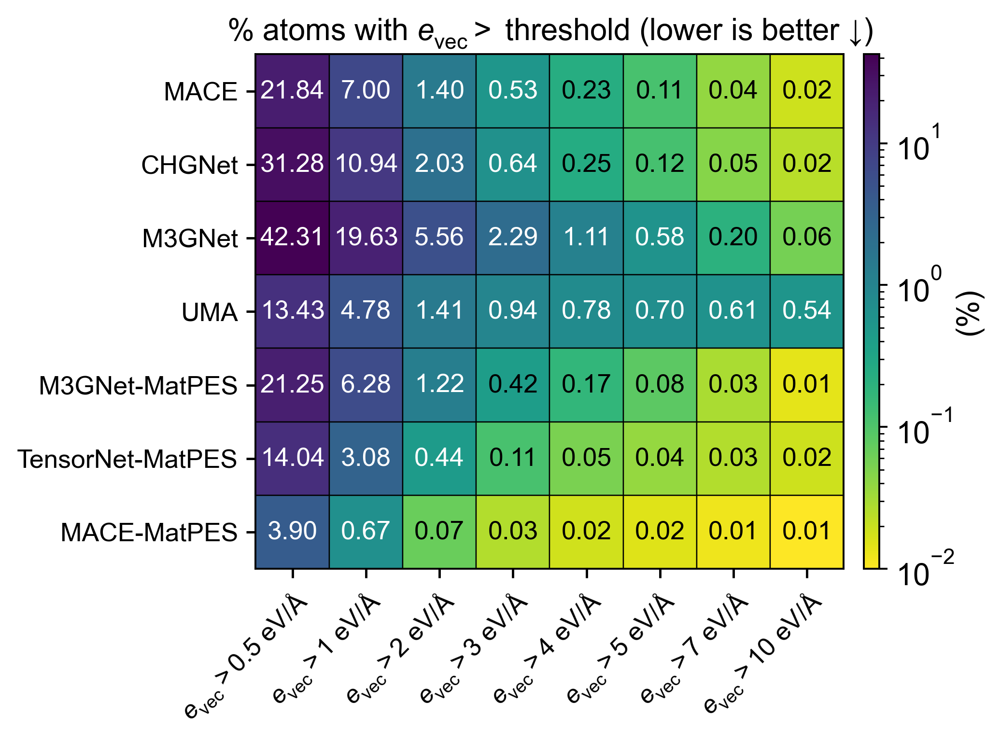

In [27]:
from matplotlib.colors import LogNorm
from force_error_metrics import build_large_evec_fraction_table, single_heatmap

# ── Config ────────────────────────────────────────────────────────────────────
EVEC_LARGE_ERROR_THRESHOLDS = [0.5, 1, 2, 3, 4, 5, 7, 10]   # eV/Å — same grid as Section 15

text_size_evec_large = 11
figsize_evec_large   = (6.0, 4.5)

df_large_evec = build_large_evec_fraction_table(
    all_results_filtered, EVEC_LARGE_ERROR_THRESHOLDS, fdf_min=FDFT_MIN
)
display(df_large_evec)

col_labels_large_evec = [rf"$e_\mathrm{{vec}} > {thr:g}$ eV/Å" for thr in EVEC_LARGE_ERROR_THRESHOLDS]

vals_evec_large = df_large_evec.values.astype(float)
norm_evec_large = LogNorm(
    vmin=np.nanmin(vals_evec_large[vals_evec_large > 0]) if np.any(vals_evec_large > 0) else 1e-2,
    vmax=np.nanmax(vals_evec_large),
)

fig, ax = single_heatmap(
    data            = vals_evec_large,
    row_labels      = df_large_evec.index.tolist(),
    col_labels      = col_labels_large_evec,
    title           = (
        r"% atoms with $e_\mathrm{vec} >$ threshold" " (lower is better ↓)"
    ),
    title_pad       = 6,
    cmap            = "viridis_r",
    norm            = norm_evec_large,
    annotate        = True,
    fmt             = "{:.2f}",
    textsize        = text_size_evec_large,
    addsize         = 0,
    cbar            = True,
    cbar_label      = "(%)",
    show_row_labels = True,
    figsize         = figsize_evec_large,
    gap             = 0.02,
    cbar_width      = 0.015,
    left            = 0.22,
    right           = 0.80,
    bottom          = 0.15,
    top             = 0.92,
    savepath        = "../outputs/matpes_pbe/jsonfiles_for_summary_table/large_evec_frac_heatmap.svg",
)


---
## Section 20 — SI: Average Force-Vector Error across DFT Force-Magnitude Subsets

Force-vector-error counterpart of Section 16 ($\Delta|F|$ MAE/RMSE over $|F_{\mathrm{DFT}}|$ Subsets). For atoms with $|F_{\mathrm{DFT}}|$ **above** each threshold: $e_\mathrm{vec}$ MAE and RMSE is shown.

- Lower-left triangle  ← MAE
- Upper-right triangle ← RMSE
- Fraction header row  ← % of all atoms with $|F_{\mathrm{DFT}}|$ > threshold (avg across models; same row as Section 16)


In [28]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import build_evec_mae_rmse_fdft_subset, merge_mae_rmse_as_string

# ── Compute MAE / RMSE tables ─────────────────────────────────────────────────
# Reuses FDFT_SUBSET_THRESHOLDS, frac_row_fdft_subset, col_labels_fdft_subset
# from Section 16 — same |F_DFT| threshold grid, for direct comparison against
# the force-magnitude-error version.
evec_mae_fdft_subset, evec_rmse_fdft_subset = build_evec_mae_rmse_fdft_subset(
    all_results_filtered, FDFT_SUBSET_THRESHOLDS
)

print("MAE of e_vec (eV/Å)  for atoms with |F_DFT| > threshold")
display(evec_mae_fdft_subset)
print("\nRMSE of e_vec (eV/Å)  for atoms with |F_DFT| > threshold")
display(evec_rmse_fdft_subset)

df_evec_fdft_subset_merged = merge_mae_rmse_as_string(evec_mae_fdft_subset, evec_rmse_fdft_subset)
print("\nMAE / RMSE of e_vec (eV/Å)")
display(df_evec_fdft_subset_merged)


MAE of e_vec (eV/Å)  for atoms with |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,0.3591,0.3685,0.4071,0.4457,0.4918,0.5836,0.6488,0.7560,1.2040
CHGNet,0.4621,0.4748,0.5231,0.5717,0.6317,0.7571,0.8454,0.9894,1.5620
M3GNet,0.6518,0.6693,0.7358,0.8015,0.8840,1.0722,1.2098,1.4404,2.3590
UMA,0.6347,0.6518,0.7202,0.7887,0.8648,1.0031,1.1076,1.3034,2.0677
M3GNet-MatPES,0.3494,0.3584,0.3910,0.4233,0.4640,0.5566,0.6214,0.7271,1.1402
TensorNet-MatPES,0.2762,0.2829,0.3049,0.3260,0.3523,0.4141,0.4584,0.5319,0.8403
MACE-MatPES,0.1385,0.1419,0.1548,0.1673,0.1823,0.2139,0.2358,0.2718,0.4284



RMSE of e_vec (eV/Å)  for atoms with |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,2.1703,2.2021,2.3381,2.4753,2.6522,3.1005,3.4700,4.1522,7.3874
CHGNet,2.7830,2.8261,3.0008,3.1768,3.4041,3.9813,4.4575,5.3374,9.5104
M3GNet,2.2869,2.3219,2.4634,2.6048,2.7869,3.2482,3.6260,4.3188,7.5498
UMA,7.8898,7.9991,8.4299,8.8494,9.3064,10.1054,10.7642,12.0300,16.3392
M3GNet-MatPES,1.4327,1.4548,1.5439,1.6334,1.7489,2.0412,2.2807,2.7206,4.7883
TensorNet-MatPES,1.4116,1.4333,1.5210,1.6092,1.7230,2.0126,2.2514,2.6926,4.7854
MACE-MatPES,1.3658,1.3858,1.4713,1.5576,1.6691,1.9534,2.1886,2.6245,4.7015



MAE / RMSE of e_vec (eV/Å)


,0.00,0.01,0.05,0.10,0.20,0.50,0.70,1.00,2.00
MACE,0.359 / 2.170,0.368 / 2.202,0.407 / 2.338,0.446 / 2.475,0.492 / 2.652,0.584 / 3.100,0.649 / 3.470,0.756 / 4.152,1.204 / 7.387
CHGNet,0.462 / 2.783,0.475 / 2.826,0.523 / 3.001,0.572 / 3.177,0.632 / 3.404,0.757 / 3.981,0.845 / 4.457,0.989 / 5.337,1.562 / 9.510
M3GNet,0.652 / 2.287,0.669 / 2.322,0.736 / 2.463,0.801 / 2.605,0.884 / 2.787,1.072 / 3.248,1.210 / 3.626,1.440 / 4.319,2.359 / 7.550
UMA,0.635 / 7.890,0.652 / 7.999,0.720 / 8.430,0.789 / 8.849,0.865 / 9.306,1.003 / 10.105,1.108 / 10.764,1.303 / 12.030,2.068 / 16.339
M3GNet-MatPES,0.349 / 1.433,0.358 / 1.455,0.391 / 1.544,0.423 / 1.633,0.464 / 1.749,0.557 / 2.041,0.621 / 2.281,0.727 / 2.721,1.140 / 4.788
TensorNet-MatPES,0.276 / 1.412,0.283 / 1.433,0.305 / 1.521,0.326 / 1.609,0.352 / 1.723,0.414 / 2.013,0.458 / 2.251,0.532 / 2.693,0.840 / 4.785
MACE-MatPES,0.139 / 1.366,0.142 / 1.386,0.155 / 1.471,0.167 / 1.558,0.182 / 1.669,0.214 / 1.953,0.236 / 2.189,0.272 / 2.624,0.428 / 4.702


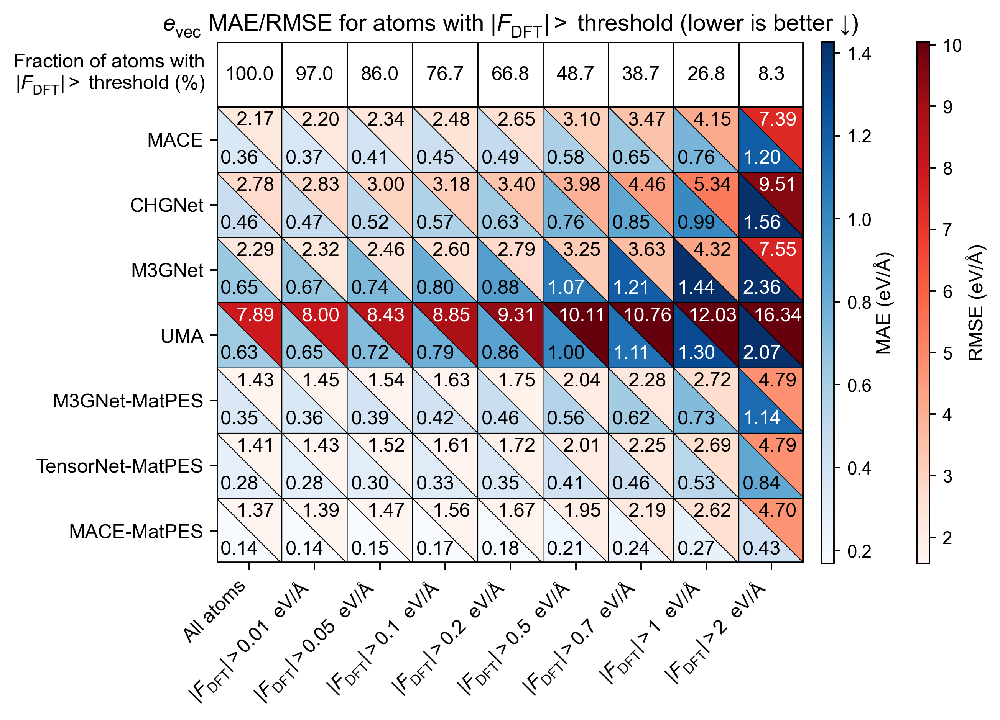

In [29]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import triangular_heatmap_with_fraction_row_word_style

# ── Plot — vertical colorbars on the right ────────────────────────────────────
fig, ax = triangular_heatmap_with_fraction_row_word_style(
    mae_df       = evec_mae_fdft_subset,
    rmse_df      = evec_rmse_fdft_subset,
    frac_row_str = frac_row_fdft_subset,
    col_labels   = col_labels_fdft_subset,
    title        = (
        r"$e_\mathrm{vec}$ MAE/RMSE "
        r"for atoms with $|F_{\mathrm{DFT}}| >$ threshold (lower is better ↓)"
    ),
    cmap_mae  = "Blues",
    cmap_rmse = "Reds",
    figsize   = (6.3, 8),
    fmt_mae   = "{:.2f}",
    fmt_rmse  = "{:.2f}",
    text_size = 10.5,
    rmse_text_x_nudge = -0.055,   # shift left  (negative = left)
    rmse_text_y_nudge =  0.02,   # shift up    (positive = up)
    # ── side colorbars ────────────────────────────────────────────────────
    cbar_labelpad_mae  = 1,    # MAE colorbar label padding
    cbar_labelpad_rmse = 2,   # increase this to push RMSE label further right
    cbar_side             = True,
    cbar_width_right      = 0.015,   # width of each vertical colorbar
    cbar_gap_right        = 0.02,    # gap: table right edge → first colorbar
    cbar_between_gap_right= 0.098,    # gap: first colorbar → second colorbar
    right                 = 0.82,    # subplots_adjust right (decrease to push table left)
    bottom_side           = 0.05,    # subplots_adjust bottom (small; nothing below)
    xlabel = "",   # hides "thresholds" label, keeps tick values
    savepath  = "../outputs/matpes_pbe/jsonfiles_for_summary_table/evec_mae_rmse_fdft_subset_side.svg",
)


---
## Section 21 — SI: Force-Vector Error ($e_\mathrm{vec}$) CDF

Force-vector-error counterpart of Section 8 (CDF of $|\Delta|F||$), using the already reconstructed and validated `e_vec` values. Reuses the existing CDF plotting infrastructure unchanged (`compute_cdf`, `plot_cdf_with_inset_on_ax`) — no supporting-function changes were needed.


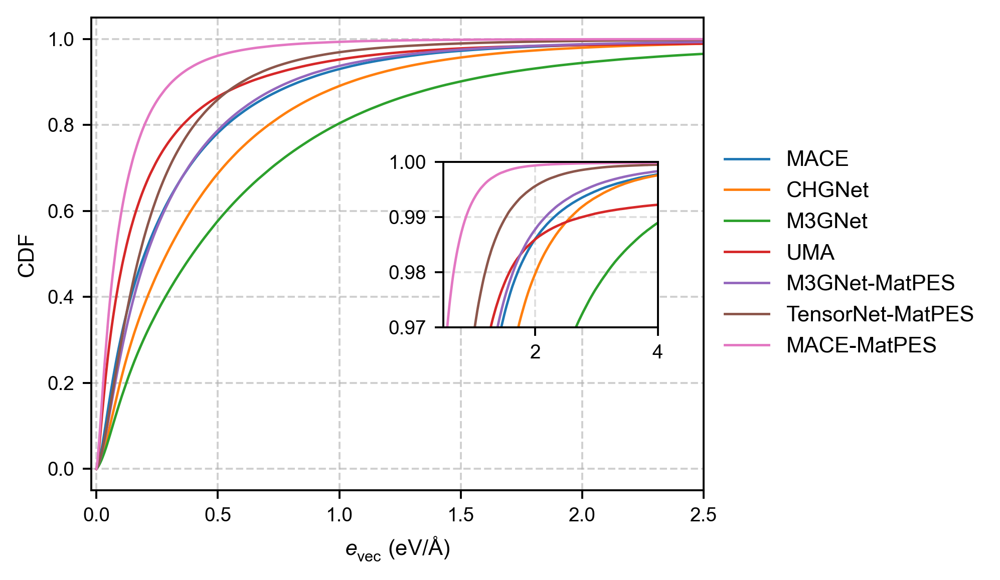

In [30]:
from fp_cdf_density_plots import PAPER_STYLE_CDF, plot_cdf_with_inset_on_ax, compute_cdf

# Build e_vec CDFs — reuse the existing CDF plot infrastructure (the "dF" slot),
# using the already reconstructed and validated force_vector_error (e_vec) values.
cdf_results_evec = {}
for model, data in all_results_filtered.items():
    e = np.asarray(data.get("e_vec", []), float)
    f = np.asarray(data.get("F_dft", []), float)
    n = min(len(e), len(f))
    e, f = e[:n], f[:n]
    mask = np.isfinite(e) & np.isfinite(f) & (np.abs(f) > FDFT_MIN)
    cdf_results_evec[model] = {"dF": compute_cdf(e[mask])}

fig = plt.figure(figsize=(4.5, 3.5), dpi=350)
gs  = fig.add_gridspec(1, 1)

plot_cdf_with_inset_on_ax(
    fig, gs[0, 0],
    cdf_results_evec,
    kind         = "dF",
    xlabel       = r"$e_{\mathrm{vec}}$ (eV/$\mathrm{\AA}$)",
    xlim_main    = (-0.02, 2.5),
    xlim_inset   = (0.5, 4.0),
    ylim_inset   = (0.97, 1.0),
    inset_bbox   = (0.25, 0.02, 1, 1),
    legend_bbox  = (1.02, 0.5),
    legend_loc   = "center left",
    legend_ncols = 1,
    show_legend  = True,
    **PAPER_STYLE_CDF,
)

plt.savefig("../outputs/matpes_pbe/cdf_evec.svg", bbox_inches="tight", dpi=350)
plt.show()


---
> The sections above show the force-vector-error counterparts of the selected force-magnitude-error analyses. Other threshold-, subset-, distribution-, and DFT force-magnitude-conditioned analyses can be applied to `force_vector_error` in the same manner by using the corresponding e_vec analysis functions (`build_evec_high_accuracy_fraction_table`, `build_large_evec_fraction_table`, `build_evec_mae_rmse_fdft_subset`) and inputs.


---
## Section 22 — SI: Far-From-Equilibrium Regime Panels (Absolute & non-FE)

Direct SI companions to Section 17: the same regime split
(non-FE: $|F_{\mathrm{DFT}}|$ ≤ 1 eV/Å, FE: $|F_{\mathrm{DFT}}|$ > 1 eV/Å), reusing
`df_panel_A`, `df_panel_B`, `df_panel_A_rel_plot`, and `abs_cols` computed in Section 17.

1. non-FE — absolute thresholds ($|\Delta|F||$ < x)
2. non-FE — relative thresholds ($r_F$ < x)
3. FE — absolute thresholds ($|\Delta|F||$ < x)


scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


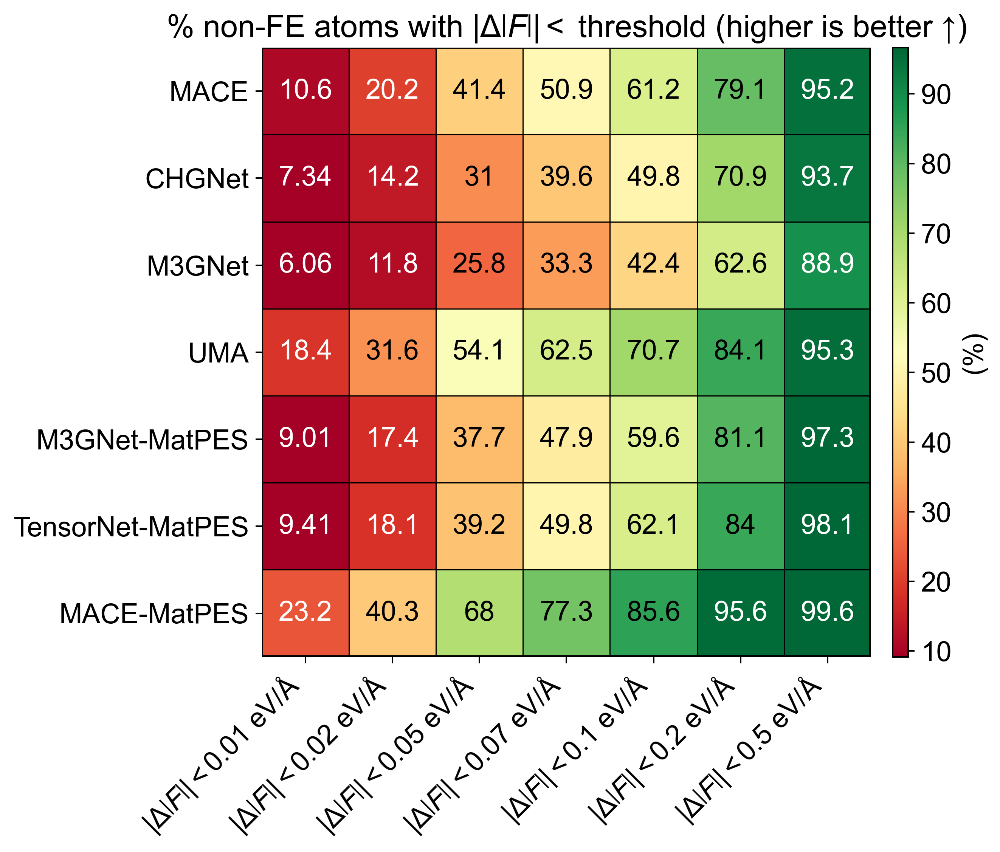

scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


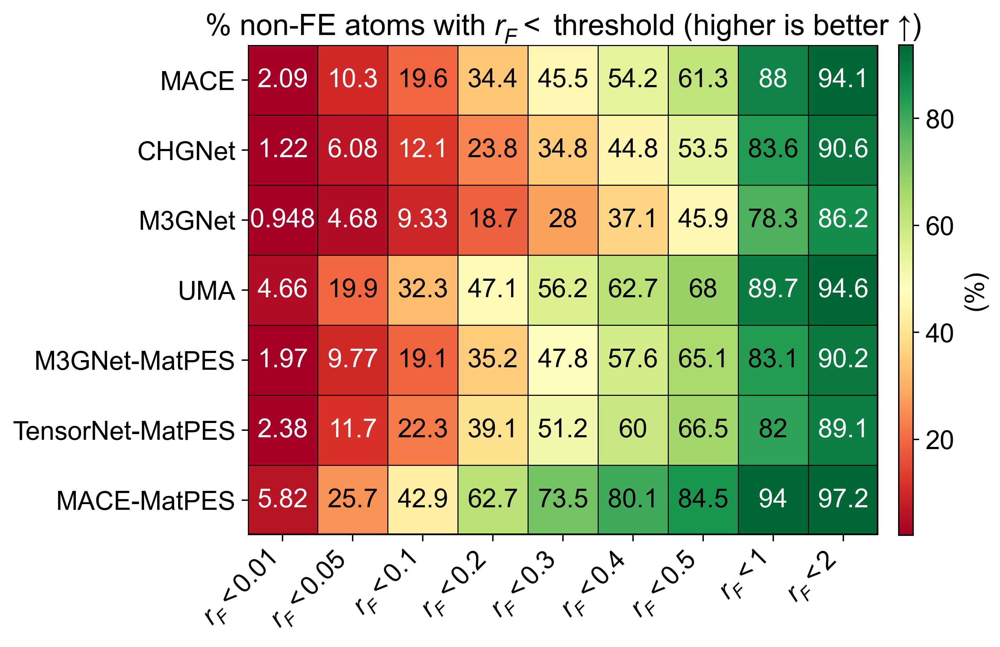

scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


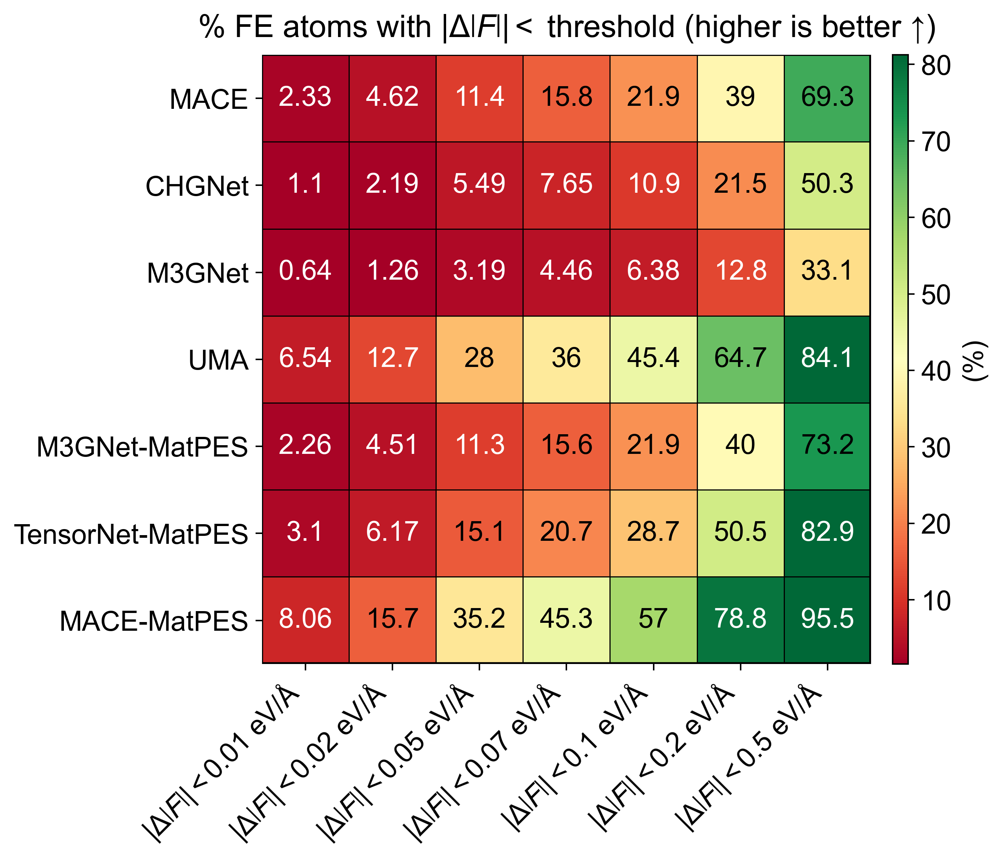

In [31]:
# ── 3 heatmaps (each their own figure) ───────────────────────────────────────
# Reuses df_panel_A, df_panel_B, df_panel_A_rel_plot, abs_cols, fig_w, fig_h,
# text_size, cbar_gap, cbar_lbl_pad from Section 17.

plot_fraction_panel(
    df_panel_A[abs_cols],
    # fmt="{:.2f}",
    panel_title=r"% non-FE atoms with $|\Delta\left|F\right|| <$ threshold (higher is better ↑)",
    fig_w=fig_w, fig_h=fig_h,
    text_size=text_size,
    sig_figs=3,  
    cbar_gap=cbar_gap, cbar_label_pad=cbar_lbl_pad,
    show_regime_row=False,
)

plot_fraction_panel(
    df_panel_A_rel_plot,
    # fmt="{:.2f}",
    panel_title=r"% non-FE atoms with $r_F <$ threshold (higher is better ↑)",
    fig_w=fig_w, fig_h=fig_h,
    text_size=text_size,
    sig_figs=3,  
    cbar_gap=cbar_gap, cbar_label_pad=cbar_lbl_pad,
    show_regime_row=False,
)

plot_fraction_panel(
    df_panel_B[abs_cols],
    # fmt="{:.2f}",
    title_pad=10,   # ← new: adjust gap between title and heatmap
    panel_title=r"% FE atoms with $|\Delta\left|F\right|| <$ threshold (higher is better ↑)",
    mae_cmap=plt.cm.Purples, rmse_cmap=plt.cm.Oranges,
    fig_w=fig_w, fig_h=fig_h,
    text_size=text_size,
    sig_figs=3,  
    cbar_gap=cbar_gap, cbar_label_pad=cbar_lbl_pad,
    show_regime_row=False,
)


---
## Section 23 — SI: FE-Only Joint Force Magnitude-Angle Accuracy

FE-only counterpart of Section 12 (Joint Magnitude–Angle Accuracy Heatmap): the same joint-accuracy calculation and split-triangle plotting, restricted to the strict far-from-equilibrium population $|F_{\mathrm{DFT}}| > 1$ eV/Å. Same thresholds, model order, and formatting as Section 12.

- **Lower triangle** — fraction (%) of FE atoms with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 1°
- **Upper triangle** — fraction (%) of FE atoms with $|\Delta|F||$ < threshold **and** $\Delta\theta$ < 20°


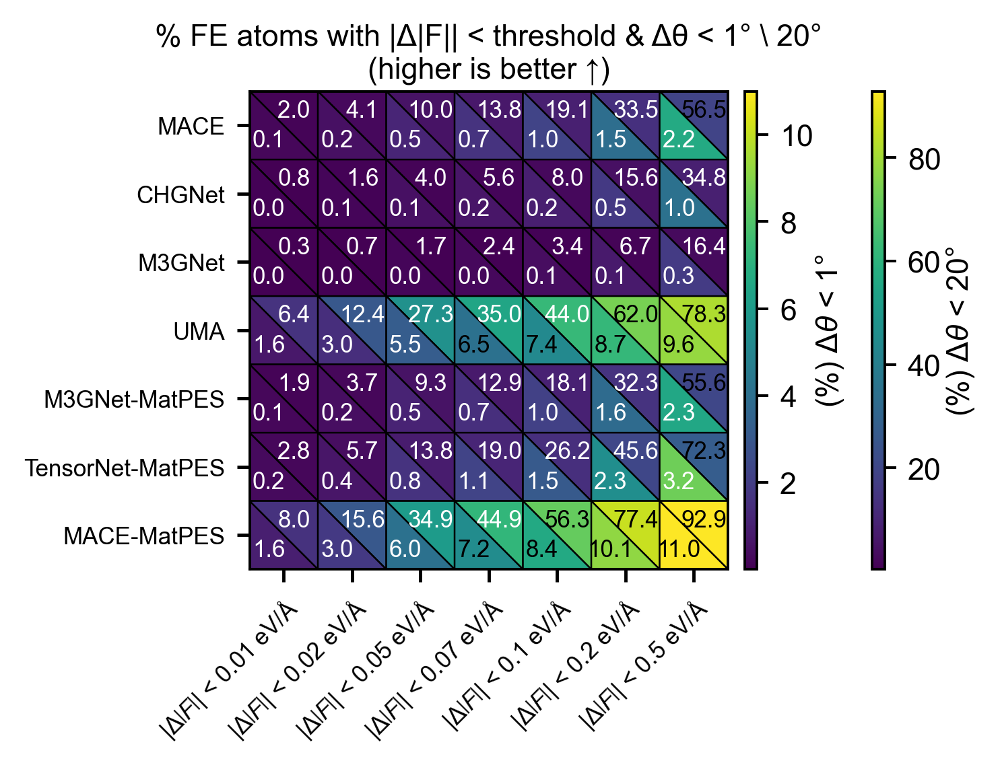

In [32]:
from force_error_metrics import build_joint_dF_theta_accuracy_table, split_triangle_heatmap

FE_THRESHOLD_JOINT = 1.0   # eV/Å — strict FE boundary: |F_DFT| > threshold

# Same DF_thresholds / ANGLE_thresholds / COL_LABELS / model order as Section 12,
# restricted to the strict FE population.
tables_fe = build_joint_dF_theta_accuracy_table(
    all_results, DF_thresholds, ANGLE_thresholds, fdf_min=FE_THRESHOLD_JOINT
)
for ac in ANGLE_thresholds:
    tables_fe[ac] = tables_fe[ac].loc[models]

vals_lower_fe = tables_fe[1].values
vals_upper_fe = tables_fe[20].values

title_fe = (
    "% FE atoms with |Δ|F|| < threshold & Δθ < 1°/20°\n"
    "(higher is better ↑)"
)

fig, ax = split_triangle_heatmap(
    vals_lower_fe, vals_upper_fe,
    row_labels       = models,
    col_labels       = COL_LABELS,
    show_row_labels = True,
    title            = title_fe,
    cmap_lower       = "viridis",
    cmap_upper       = "viridis",
    annotate         = True,
    fmt              = "{:.1f}",
    textsize         = 7.2,
    addsize          = 0,
    cbar_label_lower = r"(%) $\Delta\theta$ < 1°",
    cbar_label_upper = r"(%) $\Delta\theta$ < 20°",
    figsize          = (3.5, 5.5),
    gap              = 0.02,
    gap_between_cbars= 0.14,
    right=0.80, bottom=0.0225, top=1.0,
    savepath         = "../outputs/matpes_pbe/jsonfiles_for_summary_table/deltafdeltaangletable_fe.svg",
)


---
## Section 24 — SI: $\Delta\theta$ Fraction Table

Fraction (%) of atoms with Force-angle error **below** each threshold.  
Displayed as an imshow-based heatmap.


,1,5,10,20,30,60,90,120,178,180
MACE,7.01,19.52,34.11,53.15,64.05,79.67,86.94,91.65,97.49,98.88
CHGNet,5.89,13.30,24.12,41.87,54.00,73.48,83.08,89.26,97.00,99.95
M3GNet,5.40,10.02,17.16,30.97,42.22,63.95,76.47,85.15,96.72,99.94
UMA,10.84,34.78,51.22,66.44,73.95,84.59,89.85,93.37,98.07,99.99
M3GNet-MatPES,7.33,17.83,31.81,52.54,65.22,82.78,89.88,93.82,97.97,99.97
TensorNet-MatPES,7.85,22.58,39.87,61.21,72.29,85.86,91.30,94.45,98.00,99.96
MACE-MatPES,12.83,43.17,63.68,80.35,87.08,94.27,96.76,98.01,99.21,99.61


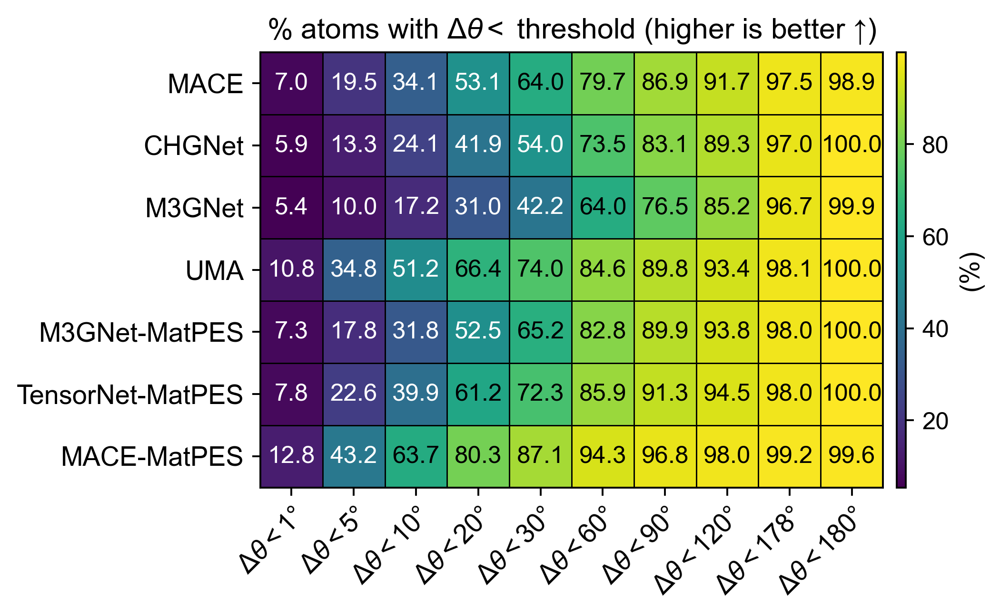

In [33]:
from force_error_metrics import build_angle_accuracy_fraction_table, heatmap_fraction_delta_theta

# ── Config ────────────────────────────────────────────────────────────────────
THETA_THRESHOLDS = [1, 5, 10, 20, 30, 60, 90, 120, 178, 180]   # degrees

col_labels=[rf"$\Delta\theta < {c}°$" for c in THETA_THRESHOLDS]
# ── Compute ───────────────────────────────────────────────────────────────────
theta_fractions = build_angle_accuracy_fraction_table(
    all_results_filtered, THETA_THRESHOLDS, fdf_min=FDFT_MIN
)
display(theta_fractions)

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, ax = heatmap_fraction_delta_theta(
    df_frac  = theta_fractions,
    title    = (
        r"% atoms with $\Delta\theta <$ threshold (higher is better ↑)" 
    ),
    col_labels = col_labels,
    title_pad= 6,
    cbar_width = 0.01,   # ← thicker/thinner colorbar                                                                                                                                                      
    cbar_pad   = 0.015,    # ← gap between table and colorbar    
    cmap     = "viridis",
    fmt      = "{:.1f}",
    textsize = 10.5,
    figsize  = (5.5, 5.5),
    savepath = "../outputs/matpes_pbe/jsonfiles_for_summary_table/theta_frac_heatmap.svg",
)

---
## Section 25 — SI: $\Delta\theta$ MAE/RMSE over atoms below different force-Angle thresholds.

- Lower-left triangle  ← MAE (degrees)
- Upper-right triangle ← RMSE (degrees)
- Fraction header row  ← % of atoms passing the angular threshold


mean Δθ (deg)  conditioned on Δθ < threshold


,1,5,10,20,30,60,90,120,178,180
MACE,0.1634,2.0289,4.3223,7.9708,10.7984,17.0259,21.7674,26.0032,33.1817,35.2471
CHGNet,0.1216,1.8063,4.3562,8.7465,12.3252,20.4050,26.5557,31.9269,41.0270,45.1166
M3GNet,0.1042,1.5048,4.0118,8.8518,13.1030,23.3927,31.6714,39.0773,51.8872,56.0151
UMA,0.2987,2.0482,3.7107,6.1313,8.0014,12.3642,15.9569,19.2844,25.3916,28.3586
M3GNet-MatPES,0.1494,1.8931,4.3334,8.3856,11.5386,18.0688,22.4315,25.8460,30.9023,33.8845
TensorNet-MatPES,0.1690,2.0714,4.3762,7.8765,10.4246,15.4341,18.8865,21.7211,26.2148,29.2360
MACE-MatPES,0.2805,2.1000,3.7422,5.8928,7.3223,9.9475,11.5665,12.7417,14.3506,15.0010



RMS Δθ (deg)  conditioned on Δθ < threshold


,1,5,10,20,30,60,90,120,178,180
MACE,0.3273,2.6301,5.3108,9.8202,13.5745,22.7536,30.5777,38.0624,51.5023,55.4120
CHGNet,0.2728,2.5019,5.4354,10.5960,15.0238,25.9029,35.0526,43.5852,58.9026,65.7287
M3GNet,0.2441,2.2759,5.2420,10.8386,15.8844,28.8351,40.0350,50.5619,69.5618,75.6717
UMA,0.4503,2.5512,4.6740,8.0880,10.9903,18.5472,25.4288,32.1656,45.0442,51.1016
M3GNet-MatPES,0.3015,2.5480,5.3777,10.2413,14.2760,23.5763,30.6924,36.8490,46.9623,52.9996
TensorNet-MatPES,0.3332,2.6611,5.3443,9.6904,13.1453,20.9100,27.1402,32.7770,42.6065,49.1509
MACE-MatPES,0.4377,2.5968,4.6818,7.7672,10.1124,15.2545,19.1166,22.3295,27.4232,29.5996



MAE / RMSE (deg)


,1,5,10,20,30,60,90,120,178,180
MACE,0.163 / 0.327,2.029 / 2.630,4.322 / 5.311,7.971 / 9.820,10.798 / 13.575,17.026 / 22.754,21.767 / 30.578,26.003 / 38.062,33.182 / 51.502,35.247 / 55.412
CHGNet,0.122 / 0.273,1.806 / 2.502,4.356 / 5.435,8.746 / 10.596,12.325 / 15.024,20.405 / 25.903,26.556 / 35.053,31.927 / 43.585,41.027 / 58.903,45.117 / 65.729
M3GNet,0.104 / 0.244,1.505 / 2.276,4.012 / 5.242,8.852 / 10.839,13.103 / 15.884,23.393 / 28.835,31.671 / 40.035,39.077 / 50.562,51.887 / 69.562,56.015 / 75.672
UMA,0.299 / 0.450,2.048 / 2.551,3.711 / 4.674,6.131 / 8.088,8.001 / 10.990,12.364 / 18.547,15.957 / 25.429,19.284 / 32.166,25.392 / 45.044,28.359 / 51.102
M3GNet-MatPES,0.149 / 0.301,1.893 / 2.548,4.333 / 5.378,8.386 / 10.241,11.539 / 14.276,18.069 / 23.576,22.431 / 30.692,25.846 / 36.849,30.902 / 46.962,33.885 / 53.000
TensorNet-MatPES,0.169 / 0.333,2.071 / 2.661,4.376 / 5.344,7.877 / 9.690,10.425 / 13.145,15.434 / 20.910,18.887 / 27.140,21.721 / 32.777,26.215 / 42.606,29.236 / 49.151
MACE-MatPES,0.281 / 0.438,2.100 / 2.597,3.742 / 4.682,5.893 / 7.767,7.322 / 10.112,9.947 / 15.255,11.566 / 19.117,12.742 / 22.329,14.351 / 27.423,15.001 / 29.600


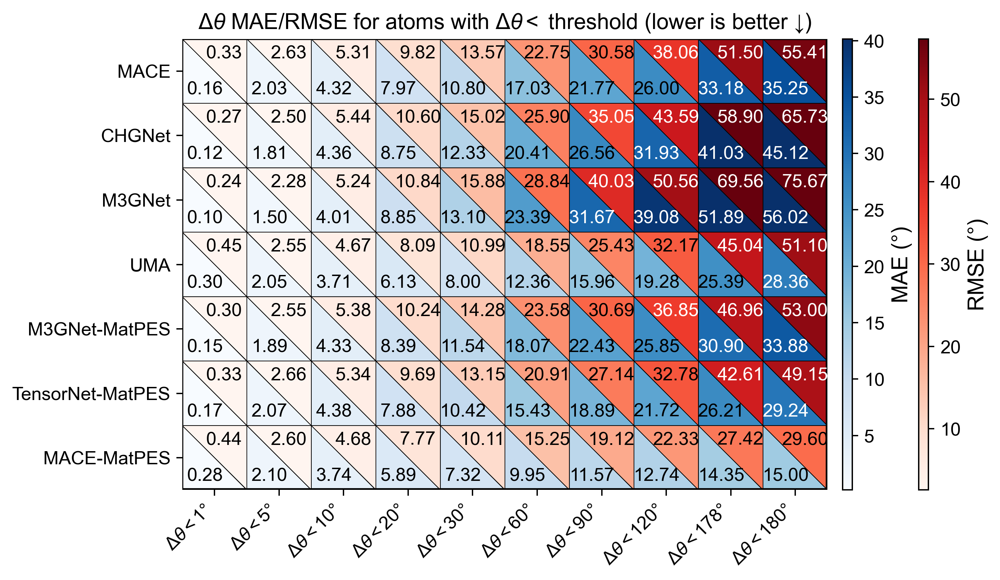

In [34]:
import pandas as pd
from force_error_metrics import build_theta_mae_rmse_angle_subset, merge_mae_rmse_as_string
from heatmap_table import triangular_heatmap_with_fraction_row
import importlib, heatmap_table
importlib.reload(heatmap_table)
from heatmap_table import triangular_heatmap_with_fraction_row
# ── Config ────────────────────────────────────────────────────────────────────
THETA_THRESHOLDS_SUBSET = [1, 5, 10, 20, 30, 60, 90, 120, 178, 180]   # degrees

# ── Compute MAE / RMSE tables ─────────────────────────────────────────────────
theta_mae_angle_subset, theta_rmse_angle_subset = build_theta_mae_rmse_angle_subset(
    all_results_filtered, THETA_THRESHOLDS_SUBSET, fdf_min=FDFT_MIN
)

print("mean Δθ (deg)  conditioned on Δθ < threshold")
display(theta_mae_angle_subset)
print("\nRMS Δθ (deg)  conditioned on Δθ < threshold")
display(theta_rmse_angle_subset)

# ── Merged string table ───────────────────────────────────────────────────────
df_theta_merged = merge_mae_rmse_as_string(theta_mae_angle_subset, theta_rmse_angle_subset)
print("\nMAE / RMSE (deg)")
display(df_theta_merged)

# ── Fraction header row: avg % atoms with Δθ < threshold ────────────────────
frac_row_theta_subset = theta_fractions.mean(axis=0).map(lambda x: f"{x:.1f}%")
frac_row_theta_subset.index = THETA_THRESHOLDS_SUBSET

# ── Plot ──────────────────────────────────────────────────────────────────────
col_labels_theta_subset = [rf"$\Delta\theta < {thr}°$" for thr in THETA_THRESHOLDS_SUBSET]

triangular_heatmap_with_fraction_row(
    mae_df       = theta_mae_angle_subset,
    rmse_df      = theta_rmse_angle_subset,
    frac_row_str = frac_row_theta_subset,
    col_labels   = col_labels_theta_subset,
    show_fraction_row = False,  
    title        = (
        r"$\Delta\theta$ MAE/RMSE "
        r"for atoms with $\Delta\theta <$ threshold (lower is better ↓)"
    ),
    colorbar_width_ratio = 0.15,   # ← thicker/thinner colorbars                                                                                                                                            
    colorbar_nudge       = 0.05,   # ← gap between table and colorbars (larger = closer)
    wspace               = 0.3,   # ← gap between the two colorbars (larger = more space) 
    cmap_mae  = "Blues",
    cmap_rmse = "Reds",
    figsize   = (8.5, 8),
    fmt_mae   = "{:.2f}",
    fmt_rmse  = "{:.2f}",
    text_size = 11,
    mae_cbar_label  = "MAE (°)",
    rmse_cbar_label = "RMSE (°)",
    xlabel = "", 
)

---
## Section 26 — SI: $\Delta|F|$ MAE/RMSE over atoms below different force-magnitude thresholds.

- Lower-left triangle ← MAE of $\Delta|F|$ (eV/Å)
- Upper-right triangle ← RMSE of $\Delta|F|$ (eV/Å)
- No fraction header row



MAE of |F| (eV/Å)  for atoms with |Δ|F|| < threshold


,0.01,0.05,0.10,0.20,0.50,1.00,2.00,5.00,10.00
MACE,0.0049,0.0223,0.0395,0.0667,0.1239,0.1740,0.2066,0.2203,0.2221
CHGNet,0.0050,0.0231,0.0425,0.0751,0.1495,0.2227,0.2758,0.2971,0.2999
M3GNet,0.0050,0.0232,0.0431,0.0776,0.1616,0.2577,0.3487,0.4105,0.4243
UMA,0.0048,0.0196,0.0335,0.0542,0.0921,0.1234,0.1429,0.1543,0.1636
M3GNet-MatPES,0.0050,0.0231,0.0422,0.0721,0.1277,0.1672,0.1893,0.1999,0.2016
TensorNet-MatPES,0.0050,0.0231,0.0423,0.0719,0.1200,0.1471,0.1589,0.1624,0.1634
MACE-MatPES,0.0048,0.0195,0.0320,0.0478,0.0667,0.0743,0.0768,0.0775,0.0778



RMSE of |F| (eV/Å)  for atoms with |Δ|F|| < threshold


,0.01,0.05,0.10,0.20,0.50,1.00,2.00,5.00,10.00
MACE,0.0057,0.0264,0.0483,0.0856,0.1741,0.2674,0.3475,0.4038,0.4184
CHGNet,0.0058,0.0272,0.0510,0.0934,0.1991,0.3191,0.4299,0.5006,0.5203
M3GNet,0.0058,0.0272,0.0517,0.0958,0.2112,0.3581,0.5256,0.6936,0.7613
UMA,0.0056,0.0241,0.0430,0.0743,0.1416,0.2120,0.2711,0.3331,0.4256
M3GNet-MatPES,0.0058,0.0272,0.0507,0.0903,0.1746,0.2502,0.3101,0.3595,0.3752
TensorNet-MatPES,0.0057,0.0272,0.0509,0.0899,0.1645,0.2206,0.2571,0.2770,0.2902
MACE-MatPES,0.0056,0.0239,0.0414,0.0666,0.1060,0.1300,0.1429,0.1499,0.1568


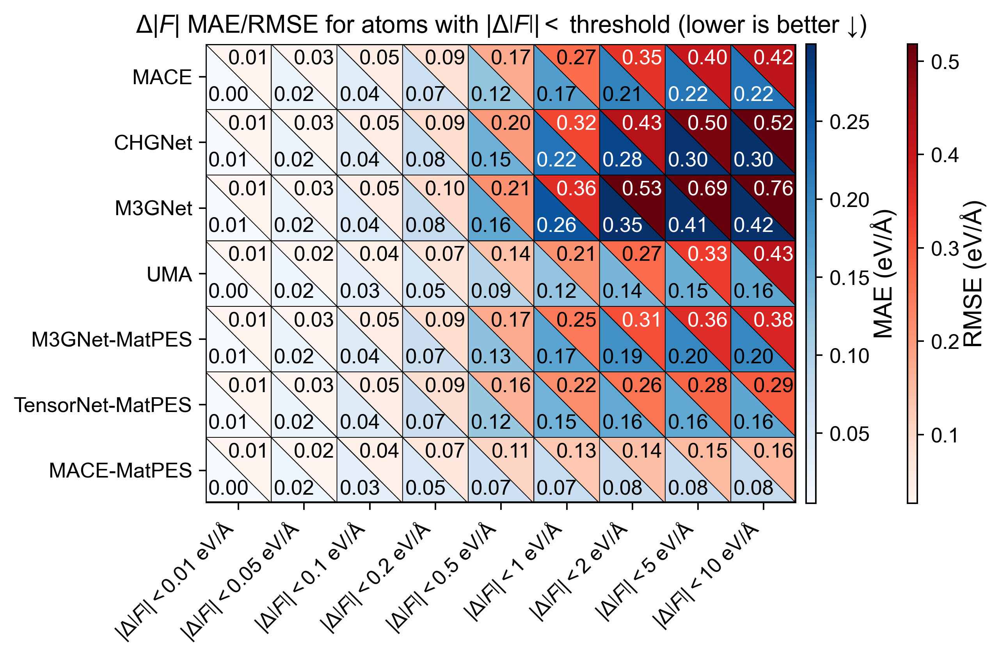

In [65]:
from force_error_metrics import build_dF_mae_rmse_smalldF_subset
from heatmap_table import triangular_heatmap_with_fraction_row

# ── Config ────────────────────────────────────────────────────────────────────
DF_LT_THRESHOLDS = [0.01, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10]   # eV/Å — upper Δ|F| cut

# ── Compute MAE / RMSE tables ─────────────────────────────────────────────────
dF_mae_smalldF_subset, dF_rmse_smalldF_subset = build_dF_mae_rmse_smalldF_subset(
    all_results_filtered, DF_LT_THRESHOLDS, fdft_min=FDFT_MIN
)

print("MAE of |F| (eV/Å)  for atoms with |Δ|F|| < threshold")
display(dF_mae_smalldF_subset)
print("\nRMSE of |F| (eV/Å)  for atoms with |Δ|F|| < threshold")
display(dF_rmse_smalldF_subset)

# ── Plot (no fraction header row) ─────────────────────────────────────────────
col_labels_smalldF_subset = [rf"$|\Delta\left|F\right|| < {thr:g}$ eV/Å" for thr in DF_LT_THRESHOLDS]

triangular_heatmap_with_fraction_row(
    mae_df            = dF_mae_smalldF_subset,
    rmse_df           = dF_rmse_smalldF_subset,
    frac_row_str      = None,
    col_labels        = col_labels_smalldF_subset,
    show_fraction_row = False,
    title             = (
        r"$\Delta|F|$ MAE/RMSE "
        r"for atoms with $|\Delta\left|F\right|| <$ threshold (lower is better ↓)"
    ),
    colorbar_width_ratio = 0.15,
    colorbar_nudge       = 0.08,
    wspace               = 0.45,
    cmap_mae  = "Blues",
    cmap_rmse = "Reds",
    figsize   = (7.5, 5),
    fmt_mae   = "{:.2f}",
    fmt_rmse  = "{:.2f}",
    mae_cbar_label  = "MAE (eV/Å)",
    rmse_cbar_label = "RMSE (eV/Å)",
    mae_cbar_labelpad=0,   # gap (points) between MAE colorbar and its label
    rmse_cbar_labelpad=0,  # gap (points) between RMSE colorbar and its label
    text_size = 11,
    xlabel="",
)

---
## Section 27 — SI: $\Delta\theta$ MAE/RMSE over atoms above different $|F_{\mathrm{DFT}}|$ thresholds.

- Lower-left triangle ← mean $\Delta\theta$ (degrees)
- Upper-right triangle ← RMS $\Delta\theta$ (degrees)



mean Δθ (deg)  conditioned on |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,1.00,2.00
MACE,37.8853,36.8638,33.0556,30.4309,27.5009,22.2934,17.6552,13.9568
CHGNet,46.1932,45.1893,41.2759,38.2550,35.0981,29.6527,24.0256,18.0853
M3GNet,56.7364,56.0857,53.1563,50.7524,48.2011,44.1349,40.4228,36.9066
UMA,29.6662,28.3698,25.2348,23.0589,20.4119,15.8342,11.7913,8.2831
M3GNet-MatPES,35.1867,33.9325,29.0926,25.5883,22.9142,20.5883,18.2498,15.8915
TensorNet-MatPES,30.6538,29.2898,24.0930,20.3378,17.2468,14.3557,11.9048,9.6389
MACE-MatPES,17.0010,15.6510,12.1257,10.2055,8.7929,7.2894,5.9527,4.7898



RMS Δθ (deg)  conditioned on |F_DFT| > threshold


,0.00,0.01,0.05,0.10,0.20,0.50,1.00,2.00
MACE,60.0134,58.2929,52.8493,49.1800,44.8472,36.5935,28.7768,23.0094
CHGNet,67.4050,65.8438,60.4783,56.3817,51.9062,44.0463,36.0935,27.9541
M3GNet,76.8328,75.7719,71.9171,68.8433,65.4412,60.1004,55.9369,53.2370
UMA,53.2204,51.1230,46.6251,43.6539,39.7447,32.3996,25.0456,19.0736
M3GNet-MatPES,55.2911,53.0912,45.1020,39.0105,33.9888,29.8629,26.5463,24.3990
TensorNet-MatPES,51.7220,49.2596,40.3497,33.4473,27.1534,21.5441,17.5484,14.7473
MACE-MatPES,34.9862,31.6278,23.5999,19.1805,15.7300,12.3037,9.8242,8.7599


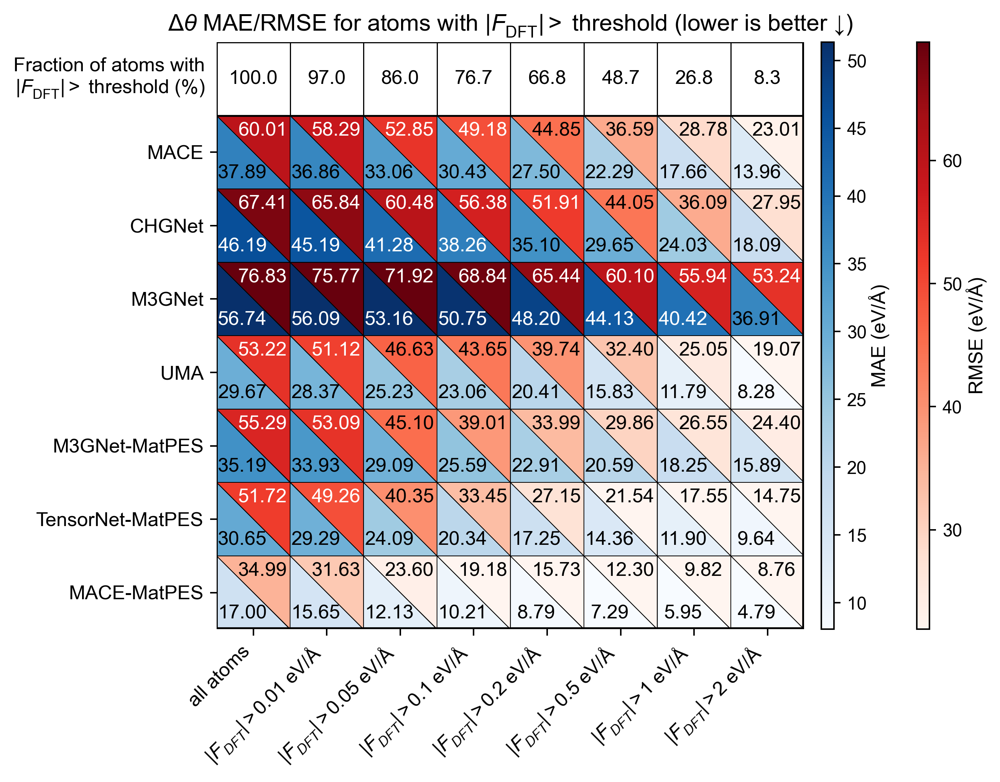

In [36]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import triangular_heatmap_with_fraction_row_word_style

from force_error_metrics import build_theta_mae_rmse_fdft_subset
from heatmap_table import triangular_heatmap_with_fraction_row

# ── Config ────────────────────────────────────────────────────────────────────
FDFT_THETA_THRESHOLDS = [0, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0]   # eV/Å

# ── Compute MAE / RMSE tables ─────────────────────────────────────────────────
theta_mae_fdft_subset, theta_rmse_fdft_subset = build_theta_mae_rmse_fdft_subset(
    all_results_filtered, FDFT_THETA_THRESHOLDS
)

print("mean Δθ (deg)  conditioned on |F_DFT| > threshold")
display(theta_mae_fdft_subset)
print("\nRMS Δθ (deg)  conditioned on |F_DFT| > threshold")
display(theta_rmse_fdft_subset)

# ── Plot ──────────────────────────────────────────────────────────────────────
col_labels_fdft_theta_subset = (
    ["all atoms"]
    + [rf"$|F_{{DFT}}| > {thr:g}$ eV/Å" for thr in FDFT_THETA_THRESHOLDS[1:]]
)

# ── Plot — vertical colorbars on the right ────────────────────────────────────
fig, ax = triangular_heatmap_with_fraction_row_word_style(
    mae_df       = theta_mae_fdft_subset,
    rmse_df      = theta_rmse_fdft_subset,
    frac_row_str = frac_row_fdft_subset,
    col_labels   = col_labels_fdft_theta_subset,
    title        = (
         r"$\Delta\theta$ MAE/RMSE "
        r"for atoms with $|F_{\mathrm{DFT}}| >$ threshold (lower is better ↓)"
    ),
    cmap_mae  = "Blues",
    cmap_rmse = "Reds",
    figsize   = (6.3, 8),
    fmt_mae   = "{:.2f}",
    fmt_rmse  = "{:.2f}",
    # sig_figs  = 3,
    text_size = 10.5,
    rmse_text_x_nudge = -0.025,   # shift left  (negative = left)
    rmse_text_y_nudge =  0.02,   # shift up    (positive = up)
    # ── side colorbars ────────────────────────────────────────────────────
    cbar_labelpad_mae  = 1,    # MAE colorbar label padding
    cbar_labelpad_rmse = 2,   # increase this to push RMSE label further right
    cbar_side             = True,
    cbar_width_right      = 0.015,   # width of each vertical colorbar
    cbar_gap_right        = 0.02,    # gap: table right edge → first colorbar
    cbar_between_gap_right= 0.098,    # gap: first colorbar → second colorbar
    right                 = 0.82,    # subplots_adjust right (decrease to push table left)
    bottom_side           = 0.05,    # subplots_adjust bottom (small; nothing below)
    xlabel = "",   # hides "thresholds" label, keeps tick values
    savepath  = "../outputs/matpes_pbe/jsonfiles_for_summary_table/fdft_conditioned_mae_rmse_side.svg",
)


---
## Section 28 — SI: fraction of atoms with $\Delta\theta$ below different thresholds in different subsets.

Atoms split by $|F_{\mathrm{DFT}}|$ into two subsets:
- **Panel A** — non-FE: $|F_{\mathrm{DFT}}|$ ≤ 1 eV/Å
- **Panel B** — FE: $|F_{\mathrm{DFT}}|$ > 1 eV/Å


Panel A — |F_DFT| <= 1.0 eV/Å


,N atoms,Frac of all atoms (%),Δθ < 1° (%),Δθ < 5° (%),Δθ < 10° (%),Δθ < 20° (%),Δθ < 30° (%),Δθ < 60° (%),Δθ < 90° (%),Δθ < 120° (%),Δθ < 178° (%),Δθ < 180° (%)
MACE,2574474.0,72.3378,8.5235,17.5603,28.8029,45.2788,56.0311,73.6773,82.8055,88.9139,96.5835,98.4766
CHGNet,2575344.0,72.3444,7.4018,12.6130,20.5062,34.7227,45.7678,66.4526,78.0511,85.8819,95.9117,99.9267
M3GNet,2574895.0,72.3409,7.0381,10.8538,16.5630,27.8450,37.6497,58.6105,72.0771,81.9190,95.5460,99.9230
UMA,2575344.0,72.3444,11.0364,28.8123,43.1628,58.6426,67.1720,80.0986,86.7861,91.3247,97.3861,99.9906
M3GNet-MatPES,2574895.0,72.3409,9.0154,16.9588,28.1323,46.1952,58.4381,77.7042,86.4987,91.6331,97.1975,99.9549
TensorNet-MatPES,2574894.0,72.3409,9.3513,19.6186,33.0188,52.4039,64.2404,80.8589,88.1024,92.3859,97.2430,99.9509
MACE-MatPES,2574474.0,72.3378,13.4174,36.6414,55.8003,74.2103,82.6152,92.1740,95.5569,97.2715,98.9201,99.4580


Panel B — |F_DFT| > 1.0 eV/Å


,N atoms,Frac of all atoms (%),Δθ < 1° (%),Δθ < 5° (%),Δθ < 10° (%),Δθ < 20° (%),Δθ < 30° (%),Δθ < 60° (%),Δθ < 90° (%),Δθ < 120° (%),Δθ < 178° (%),Δθ < 180° (%)
MACE,984487.0,27.6622,3.0660,24.6348,47.9821,73.7213,85.0361,95.3245,97.7593,98.8086,99.8601,99.9463
CHGNet,984497.0,27.6556,1.9188,15.0808,33.5763,60.5685,75.5388,91.8759,96.2336,98.0909,99.8541,99.9966
M3GNet,984494.0,27.6591,1.0978,7.8450,18.7291,39.1325,54.1833,77.8971,87.9760,93.6168,99.7873,99.9955
UMA,984497.0,27.6556,10.3122,50.3982,72.3108,86.8313,91.6827,96.3413,97.8586,98.7117,99.8660,99.9980
M3GNet-MatPES,984494.0,27.6591,2.9209,20.1244,41.4138,69.1487,82.9546,96.0482,98.7311,99.5317,99.9749,99.9994
TensorNet-MatPES,984494.0,27.6591,3.9237,30.3195,57.8056,84.2584,93.3454,98.9498,99.6577,99.8454,99.9765,99.9993
MACE-MatPES,984487.0,27.6622,11.2995,60.2562,84.2997,96.3956,98.7511,99.7566,99.8913,99.9383,99.9842,99.9932


scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


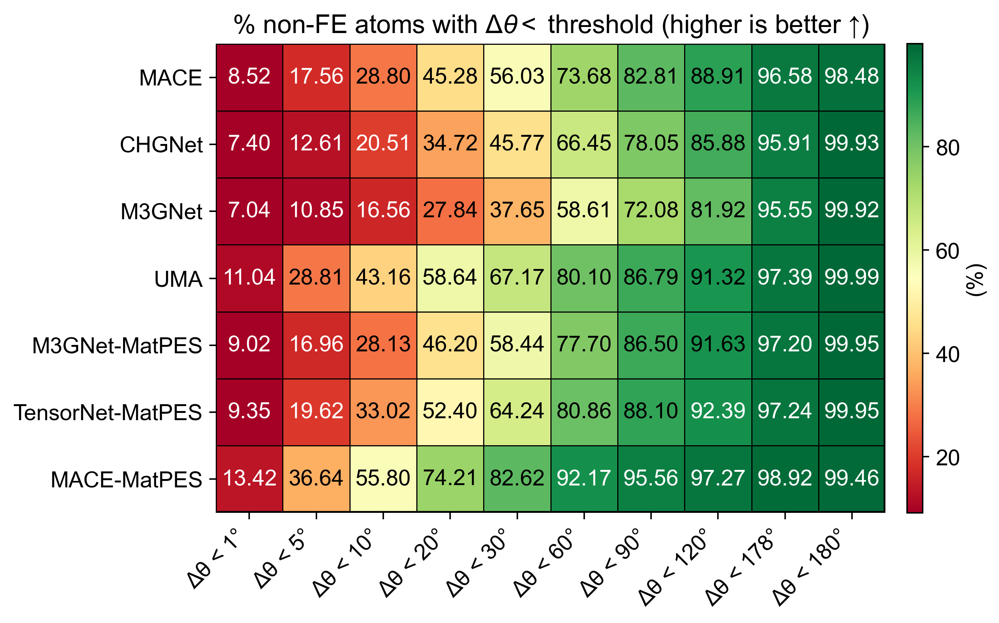

scripts/heatmap_table.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


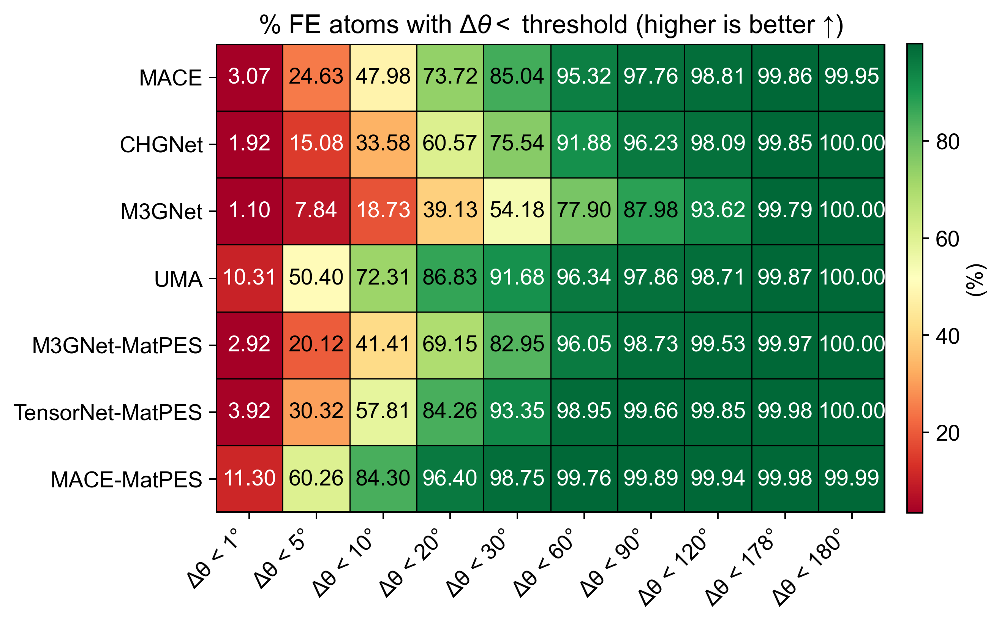

In [37]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import build_theta_far_from_equilibrium_regime_panels
from heatmap_table import plot_fraction_panel

# ── Config ────────────────────────────────────────────────────────────────────
THETA_REGIME_THRESH = [1, 5, 10, 20, 30, 60, 90, 120, 178, 180]   # degrees
THETA_THRESHOLD     = 1.0   # eV/Å boundary between panels

fig_w_th     = 6.5
fig_h_th     = 5.98
text_size_th = 13
cbar_gap_th  = 0.115
cbar_lbl_th  = 2.5

# ── Build DataFrames ─────────────────────────────────────────────────────────
df_panel_A_theta, df_panel_B_theta = build_theta_far_from_equilibrium_regime_panels(
    all_results_filtered,
    theta_thresh = THETA_REGIME_THRESH,
    threshold    = THETA_THRESHOLD,
    fdf_min      = FDFT_MIN,
)

print(f"Panel A — |F_DFT| <= {THETA_THRESHOLD} eV/Å")
display(df_panel_A_theta)
print(f"Panel B — |F_DFT| > {THETA_THRESHOLD} eV/Å")
display(df_panel_B_theta)

# Column subsets for plot_fraction_panel
theta_cols = (
    ["N atoms", "Frac of all atoms (%)"]
    + [f"Δθ < {thr}° (%)" for thr in THETA_REGIME_THRESH]
)

frac_avg_A_theta = df_panel_A_theta["Frac of all atoms (%)"].mean()

# ── Panel A ───────────────────────────────────────────────────────────────────
plot_fraction_panel(
    df_panel_A_theta[theta_cols],
    fmt        = "{:.2f}",
    panel_title= (
        r"% non-FE atoms with $\Delta\theta <$ threshold (higher is better ↑)"
    ),
    fig_w=fig_w_th, fig_h=fig_h_th,
    text_size=text_size_th-1,
    cbar_gap=cbar_gap_th, cbar_label_pad=cbar_lbl_th,
    show_regime_row=False,
)

# ── Panel B ───────────────────────────────────────────────────────────────────
plot_fraction_panel(
    df_panel_B_theta[theta_cols],
    fmt        = "{:.2f}",
    panel_title= (
        r"% FE atoms with $\Delta\theta <$ threshold (higher is better ↑)"
    ),
    mae_cmap=plt.cm.Purples, rmse_cmap=plt.cm.Oranges,
    fig_w=fig_w_th, fig_h=fig_h_th,
    text_size=text_size_th-1,
    save_path="../outputs/matpes_pbe/theta_regime_far_from_eq.svg",
    cbar_gap=cbar_gap_th, cbar_label_pad=cbar_lbl_th,
    show_regime_row=False,
)

---
## Section 29 — SI: Error Histograms (All Evaluated Atoms)


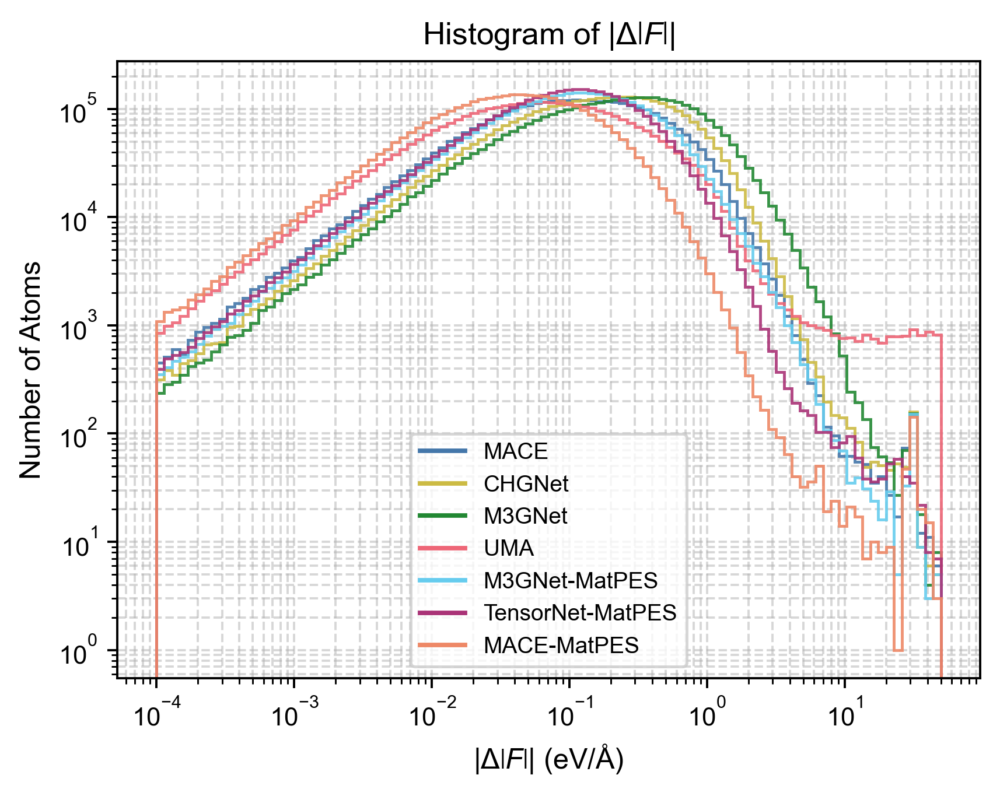

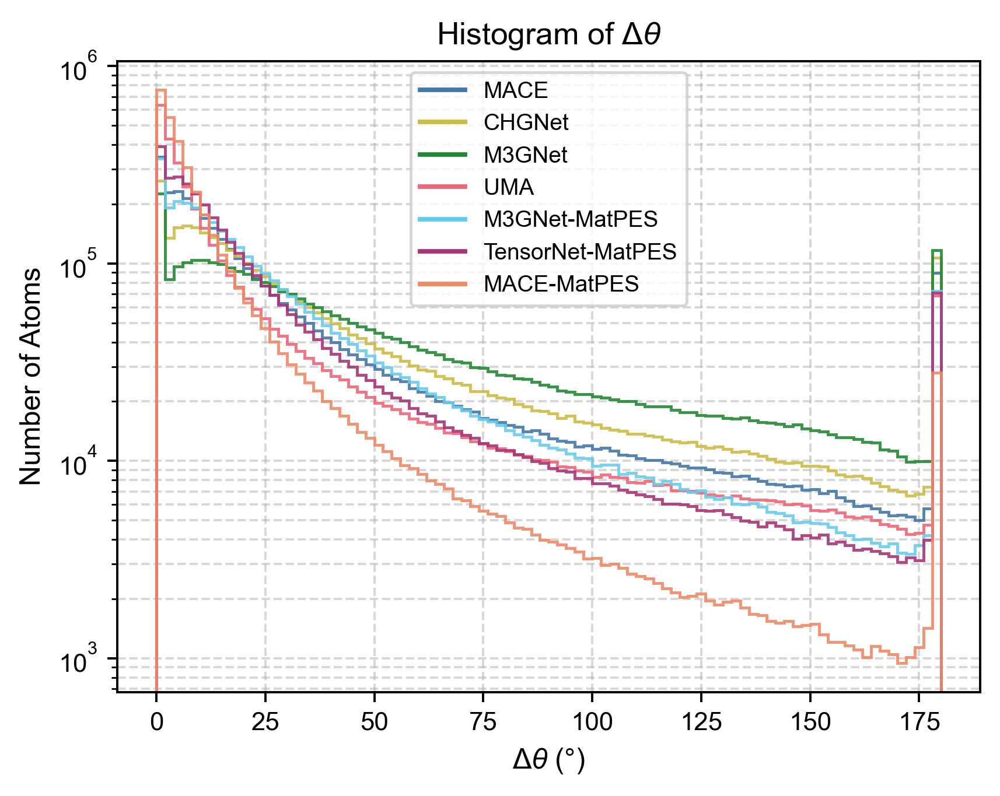

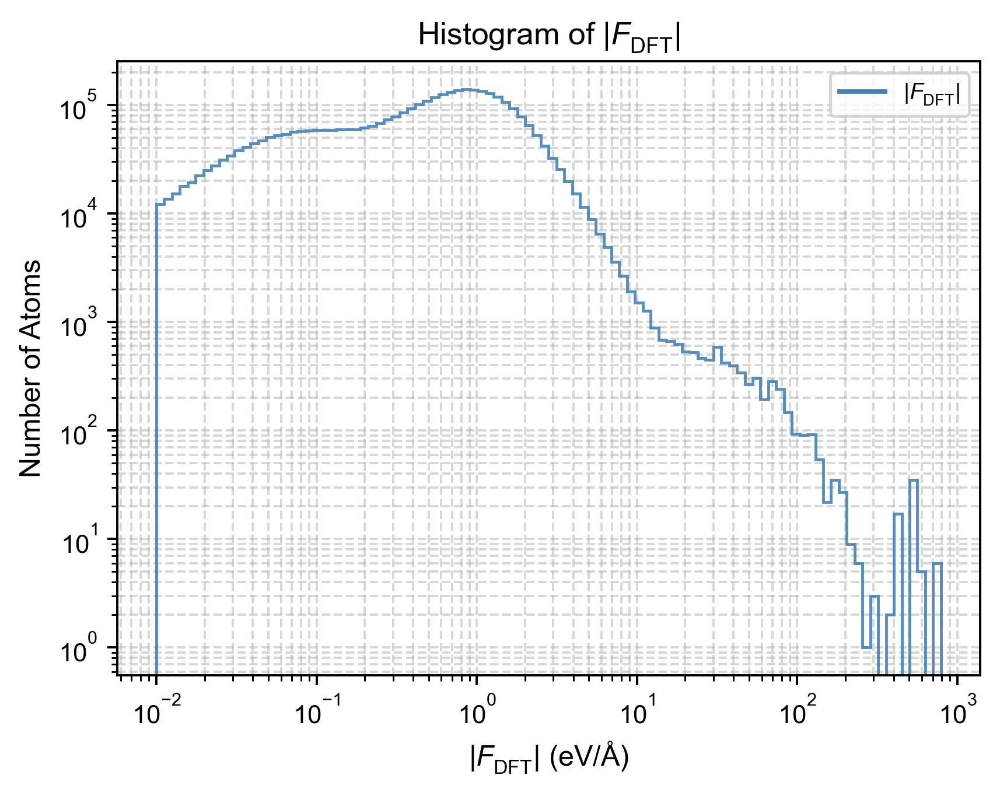

In [38]:
from force_error_metrics import plot_error_histograms

# All evaluated atoms (|F_DFT| > FDFT_MIN), line style
plot_error_histograms(
    all_results_filtered,
    fdf_min        = FDFT_MIN,
    fdft_max       = None,     # no upper limit — all atoms
    bins_dF        = 100,
    bins_theta     = 90,
    bins_fdft      = 100,
    drawstyle      = "step",          # "line" or "step"
    legend_style   = "line",     # ← new: line icons in legend, histograms stay step-drawn
    figsize        = (5, 4),
    textsize       = 10,
    model_colors      = MODEL_COLORS,
    model_linestyles  = MODEL_LINESTYLES,
    model_linewidths  = MODEL_LINEWIDTHS,
    savepath_dF    = "../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_abs_dF.svg",
    savepath_theta = "../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_dtheta.svg",
    savepath_fdft  = "../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_fdft.svg",
)

---
## Section 30 — SI: Error Histograms (non-FE atoms)

Same as Section 29, restricted to $|F_{\mathrm{DFT}}| \le$ `FDFT_HIST_MAX` (i.e. $0.01$ eV/Å $< |F_{\mathrm{DFT}}| \le 1$ eV/Å, where the calculation applies $|F_{\mathrm{DFT}}| >$ `FDFT_MIN`).


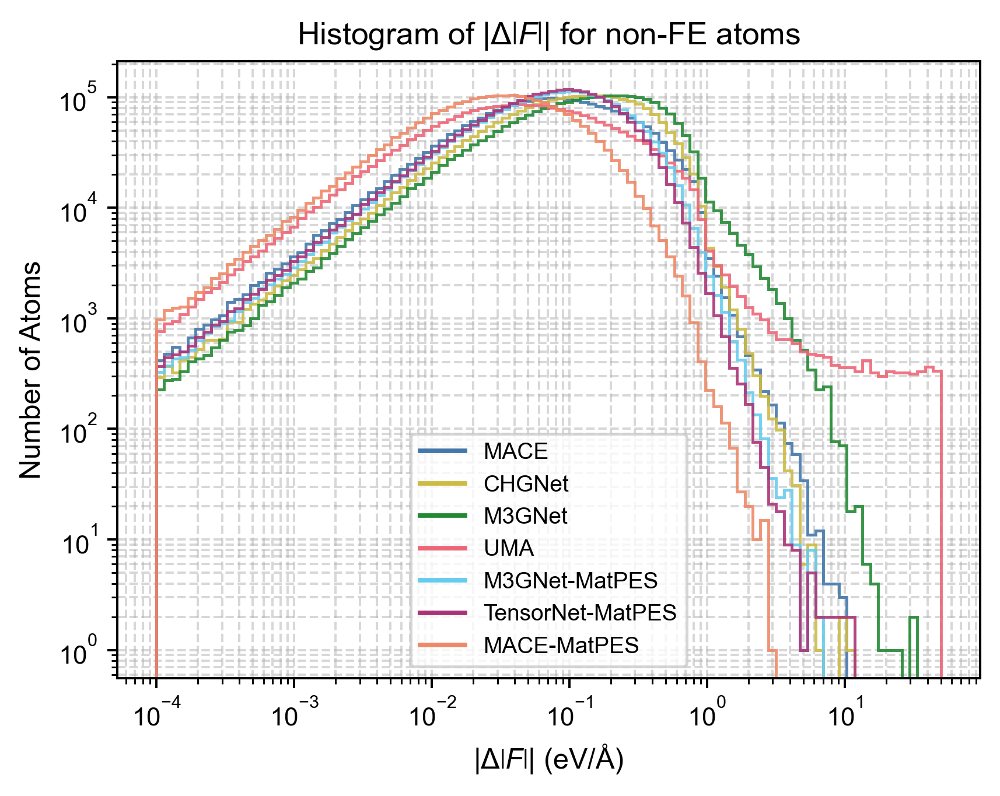

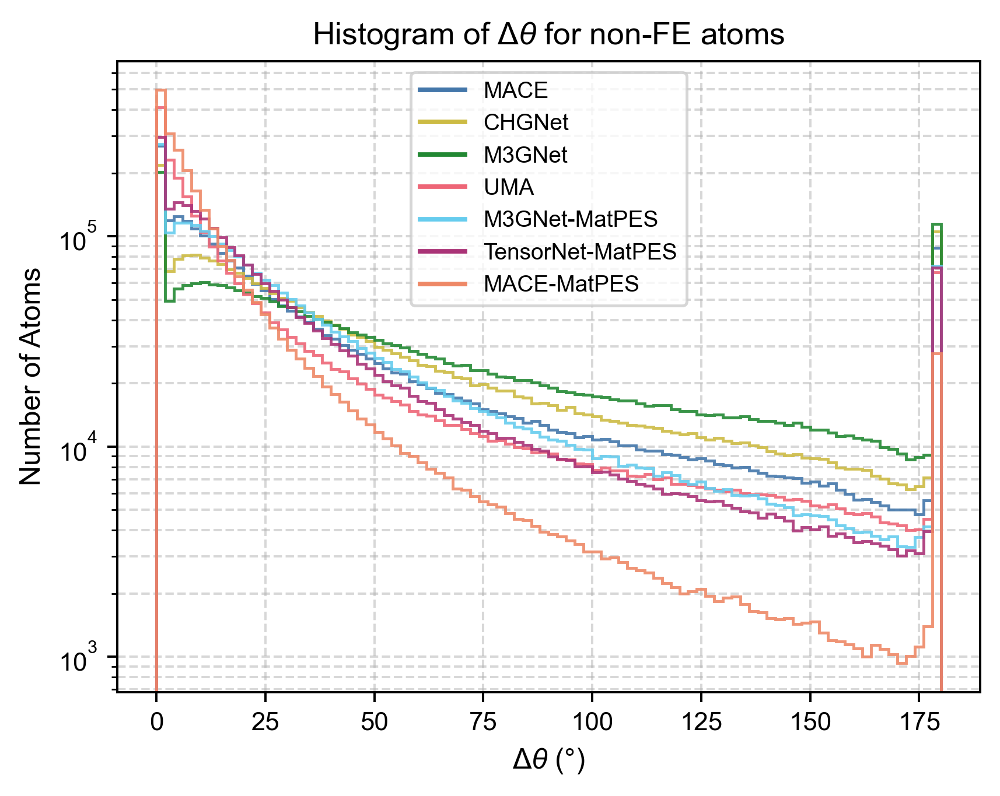

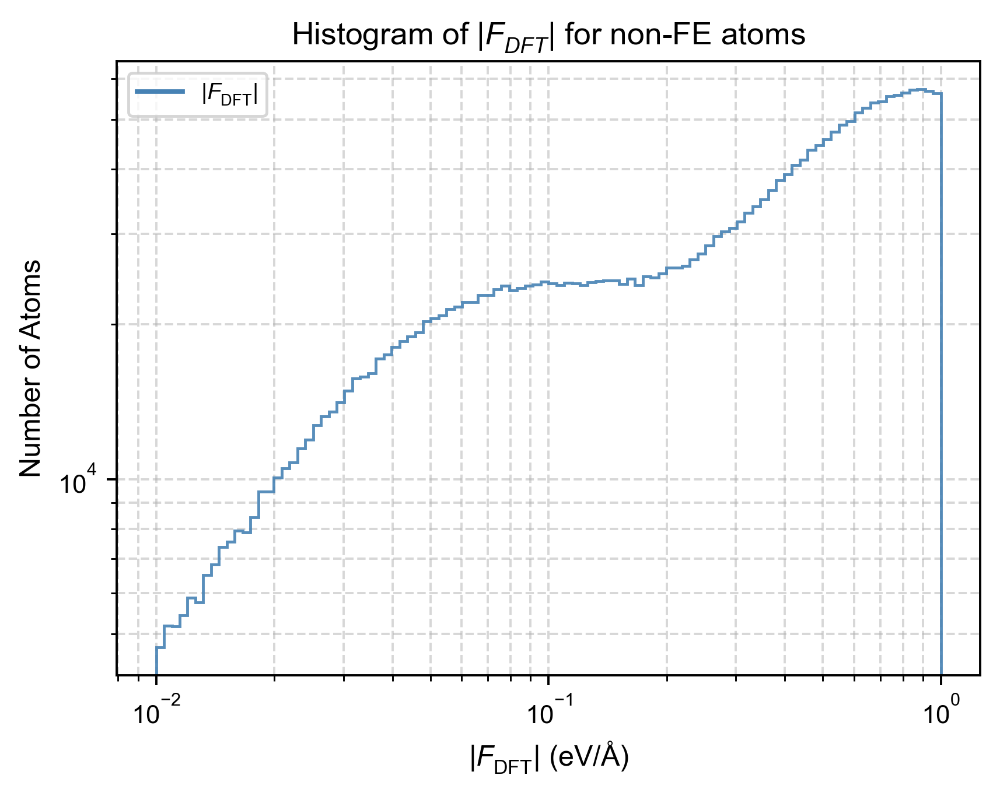

In [ ]:
# Reload force_error_metrics first, same as before:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import plot_error_histograms

# non-FE atoms only:
FDFT_HIST_MAX = 1.0   # eV/Å — upper |F_DFT| cutoff (non-FE: |F_DFT| <= FDFT_HIST_MAX)


_FDFT_HIST_MAX_INCL = FDFT_HIST_MAX + 1e-9

plot_error_histograms(
    all_results_filtered,
    fdf_min        = FDFT_MIN,
    fdft_max       = _FDFT_HIST_MAX_INCL,   # non-FE atoms only (inclusive of FDFT_HIST_MAX)
    bins_dF        = 100,
    bins_theta     = 90,
    bins_fdft      = 100,
    title_dF    = r"Histogram of $|\Delta\left|F\right||$ for non-FE atoms",
    title_theta = r"Histogram of $\Delta\theta$ for non-FE atoms",
    title_fdft  = r"Histogram of $|F_{DFT}|$ for non-FE atoms",
    drawstyle      = "step",          # "line" or "step"
    legend_style   = "line",     # ← new: line icons in legend, histograms stay step-drawn
    figsize        = (5, 4),
    textsize       = 10,
    model_colors      = MODEL_COLORS,
    model_linestyles  = MODEL_LINESTYLES,
    model_linewidths  = MODEL_LINEWIDTHS,
    savepath_dF    = f"../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_abs_dF_fdft_lt{FDFT_HIST_MAX}.svg",
    savepath_theta = f"../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_dtheta_fdft_lt{FDFT_HIST_MAX}.svg",
    savepath_fdft  = f"../outputs/matpes_pbe/jsonfiles_for_summary_table/hist_fdft_fdft_lt{FDFT_HIST_MAX}.svg",
)

---
## Section 31 — SI: Large-Error-Atom $|F_{\mathrm{DFT}}|$ Distribution (Single Threshold)

For atoms with $|\Delta\left|F\right||$ > `DF_THRESH`:
- First column: what is the percentage of atoms with $|\Delta\left|F\right||$ above the specified threshold.
- Remaining columns: fraction of atoms with $|F_{\mathrm{DFT}}|$ below each threshold


,% of all atoms\n(|Δ|F||>10),|F_DFT| < 1 (%),|F_DFT| < 2 (%),|F_DFT| < 3 (%),|F_DFT| < 5 (%),|F_DFT| < 7 (%),|F_DFT| < 10 (%),|F_DFT| < 100 (%)
MACE,0.0179,0.16,0.16,0.47,0.47,0.63,1.10,77.99
CHGNet,0.0228,0.12,0.62,0.86,1.11,1.23,1.48,75.71
M3GNet,0.0347,5.43,9.56,13.37,16.13,18.15,19.94,82.90
UMA,0.5197,41.80,70.35,84.02,92.26,94.91,96.36,99.51
M3GNet-MatPES,0.0131,0.00,0.00,0.00,0.00,0.21,0.21,58.33
TensorNet-MatPES,0.0177,0.63,0.63,1.90,2.38,2.38,2.54,64.18
MACE-MatPES,0.0099,0.00,0.00,0.00,0.00,0.00,0.00,72.24


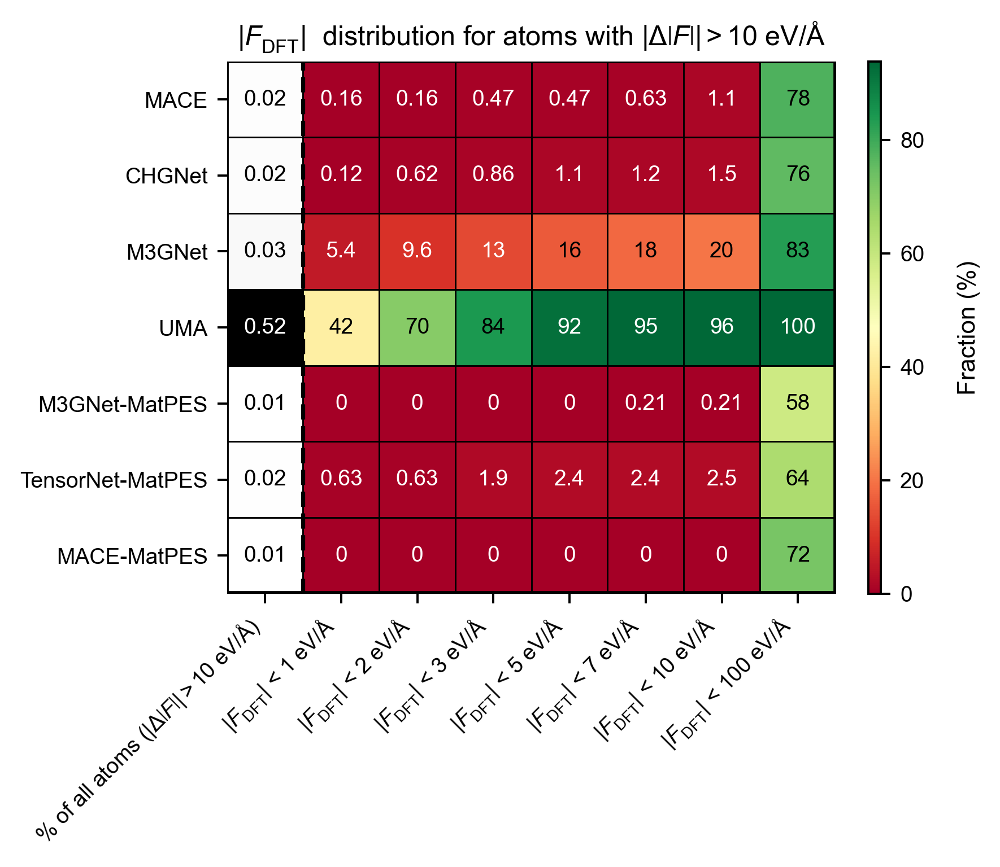

In [40]:
from matplotlib.colors import Normalize
import importlib, force_error_metrics, fp_cdf_density_plots
importlib.reload(force_error_metrics)
importlib.reload(fp_cdf_density_plots)
from heatmap_table import (
    create_figure, setup_frame, setup_ticks_and_labels,
    draw_rectangular_column,
)
from force_error_metrics import build_large_error_fdft_distribution_table

# ── Config ───────────────────────────────────────────────────────────────────
DF_THRESH   = 10.0
FDFT_THRESH = [1, 2, 3, 5, 7, 10, 100]   # eV/Å
text_size   = 8
figsize14   = (6.5, 3.5)
cbar_w      = 0.01
cbar_gap14  = 0.085

# ── Compute ──────────────────────────────────────────────────────────────────
df_large_error_fdft = build_large_error_fdft_distribution_table(
    all_results_filtered, df_thresh=DF_THRESH,
    fdft_thresh=FDFT_THRESH, fdf_min=FDFT_MIN,
)
display(df_large_error_fdft)

# ── Plot ─────────────────────────────────────────────────────────────────────
first_col  = df_large_error_fdft.columns[0]
pct_cols14 = [c for c in df_large_error_fdft.columns if "|F_DFT|" in c]
models14   = df_large_error_fdft.index.tolist()
nrows14    = len(models14)
ncols14    = len(pct_cols14) + 1

col_labels14 = [f"% of all atoms ($|\\Delta\\left|F\\right|| > {DF_THRESH:g}$ eV/Å)"] + [c.replace("|F_DFT|", r"$|F_\mathrm{DFT}|$").replace(" (%)", " eV/Å") for c in pct_cols14]

vals_pct14 = df_large_error_fdft[pct_cols14].values.astype(float)
norm_pct14 = Normalize(vmin=np.nanpercentile(vals_pct14, 5), vmax=np.nanpercentile(vals_pct14, 95))
cmap_pct14 = plt.cm.RdYlGn

vals_n14   = df_large_error_fdft[first_col].values.astype(float)
norm_n14   = Normalize(vmin=np.nanmin(vals_n14), vmax=np.nanmax(vals_n14))
cmap_n14   = plt.cm.Greys

fig, ax, _ = create_figure(ncols14, n_colorbars=0, figsize=figsize14, dpi=350)
ax.set_xlim(0, ncols14)
ax.set_ylim(0, nrows14)
ax.set_aspect("equal")

draw_rectangular_column(ax, col_idx=0, nrows=nrows14,
    vals=vals_n14, cmap=cmap_n14, norm=norm_n14,
    fmt="{:.2f}",
    # sig_figs=2,  
    text_size=text_size)

for j, col in enumerate(pct_cols14):
    draw_rectangular_column(ax, col_idx=j + 1, nrows=nrows14,
        vals=df_large_error_fdft[col].values, cmap=cmap_pct14, norm=norm_pct14,
        # fmt="{:.2f}",
        sig_figs=2,  
        text_size=text_size)

ax.plot([1, 1], [0, nrows14], color="black", lw=1.5, ls="--")
setup_frame(ax, ncols14, nrows14)
setup_ticks_and_labels(ax,
    ncols=ncols14, nrows_data=nrows14, nrows_total=nrows14,
    row_labels=models14, col_labels=col_labels14,
    title=r"$|F_\mathrm{DFT}|$"rf"  distribution for atoms with $|\Delta\left|F\right|| > "f"{DF_THRESH:g}$ eV/Å",
    xlabel="", extra_row_label=None, text_size=text_size)

fig.canvas.draw()
ax_pos = ax.get_position()
x0 = ax_pos.x0 + ax_pos.width + 0.025

cax = fig.add_axes([
    x0,
    ax_pos.y0,
    cbar_w,
    ax_pos.height
])

sm = plt.cm.ScalarMappable(
    norm=norm_pct14,
    cmap=cmap_pct14
)

cb = fig.colorbar(sm, cax=cax)
cb.ax.tick_params(labelsize=text_size)
cb.set_label(
    "Fraction (%)",
    fontsize=text_size + 1,
    rotation=90,
    labelpad=12
)

fig.savefig("../outputs/matpes_pbe/large_dF_fdft_table.svg", bbox_inches="tight", dpi=350, pad_inches=0.05)
plt.show()

---
## Section 32 — SI: Large-Error-Atom $|F_{\mathrm{DFT}}|$ Distribution (Multiple Thresholds)

Same analysis as Section 31, repeated for each threshold in `DF_THRESHOLDS`.
Produces one heatmap per threshold value.


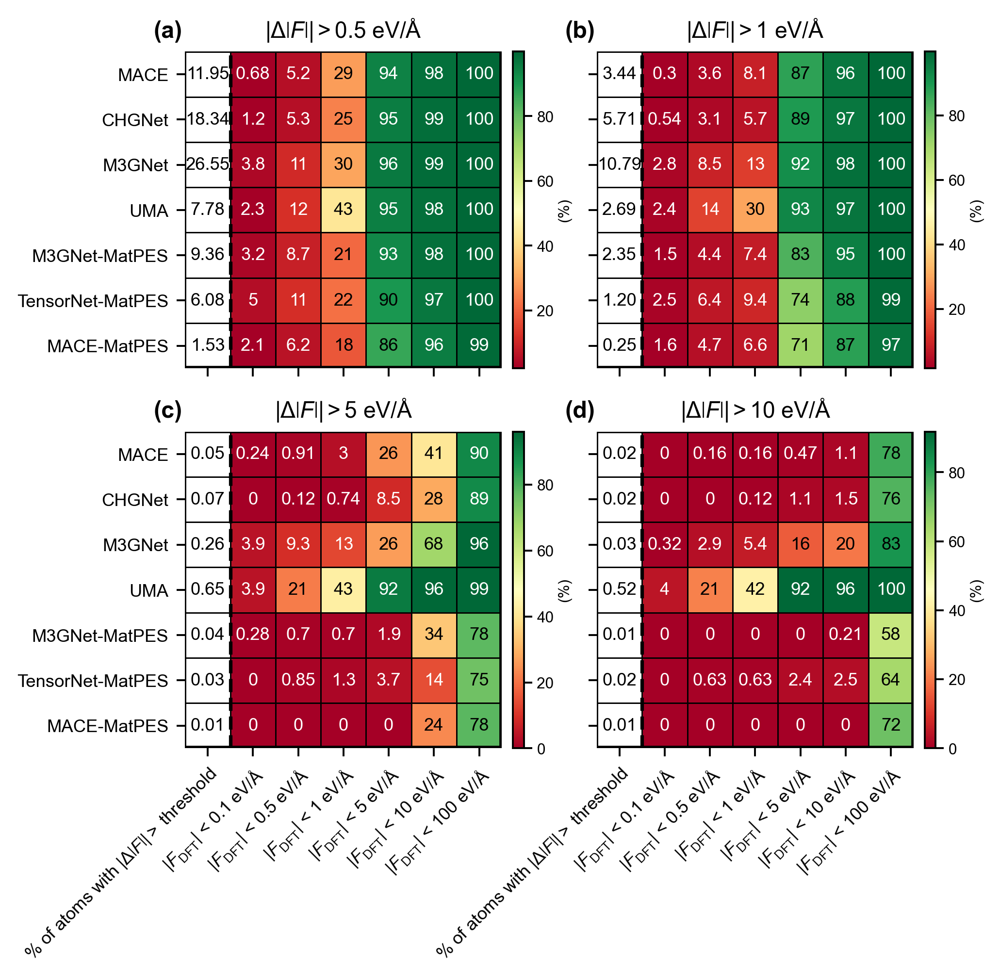

In [41]:
from force_error_metrics import build_large_error_fdft_distribution_table
from heatmap_table import draw_rectangular_column, setup_frame, setup_ticks_and_labels
import matplotlib.gridspec as gridspec

DF_THRESHOLDS = [0.5, 1.0, 5.0, 10.0]    # eV/Å
FDFT_THRESH15 = [0.1, 0.5, 1, 5, 10, 100]
text_size15   = 7.5

SHOW_COUNT_CBAR = False   # ← set False to make the count column plain (no cmap) and remove its colorbar

TITLE_TEMPLATE15 = r"$|\Delta\left|F\right|| > {thr:g}$ eV/Å"   # ← edit this to change panel titles
# ── Fonts (match paper — Arial everywhere, including mathtext) ────────────
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"        # ← keep text editable in Inkscape
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"
# ── Build all four dataframes ──────────────────────────────────────────────
dfs = []
for df_thresh in DF_THRESHOLDS:
    dfs.append(build_large_error_fdft_distribution_table(
        all_results_filtered, df_thresh=df_thresh,
        fdft_thresh=FDFT_THRESH15, fdf_min=FDFT_MIN,
    ))

# ── Derive common structural parameters from the first df ──────────────────
df0       = dfs[0]
pct_cols0 = [c for c in df0.columns if "|F_DFT|" in c]
models15  = df0.index.tolist()
nrows15   = len(models15)
ncols15   = len(pct_cols0) + 1          # 1 count-col + 6 pct-cols

# ── Figure and 2x2 GridSpec ───────────────────────────────────────────────
fig = plt.figure(figsize=(6.5, 8.5), dpi=350)
gs  = gridspec.GridSpec(
    2, 2, figure=fig,
    left=0.13, right=0.79,
    bottom=0.06, top=0.95,
    hspace=-0.58,
    wspace=0.3,   # ← space between a/b and between c/d (shared by both rows)
)

panel_axes = []
for idx, (df_thresh, df15) in enumerate(zip(DF_THRESHOLDS, dfs)):
    prow, pcol = divmod(idx, 2)
    ax = fig.add_subplot(gs[prow, pcol])
    panel_axes.append(ax)

    first_col15  = df15.columns[0]
    pct_cols15   = [c for c in df15.columns if "|F_DFT|" in c]
    col_labels15 = (
        [f"% of atoms with $|\\Delta\\left|F\\right|| >$ threshold"]
        + [c.replace("|F_DFT|", r"$|F_\mathrm{DFT}|$").replace(" (%)", " eV/Å") for c in pct_cols15]
    )

    vals_pct = df15[pct_cols15].values.astype(float)
    norm_pct = Normalize(vmin=np.nanpercentile(vals_pct, 5), vmax=np.nanpercentile(vals_pct, 95))
    cmap_pct = plt.cm.RdYlGn

    vals_n = df15[first_col15].values.astype(float)
    norm_n = Normalize(vmin=np.nanmin(vals_n), vmax=np.nanmax(vals_n))
    cmap_n = plt.cm.Greys

    ax.set_xlim(0, ncols15)
    ax.set_ylim(0, nrows15)
    ax.set_aspect("equal")

    draw_rectangular_column(ax, col_idx=0, nrows=nrows15,
        vals=vals_n,
        cmap=(cmap_n if SHOW_COUNT_CBAR else None),
        norm=(norm_n if SHOW_COUNT_CBAR else None),
        fmt="{:.2f}", text_size=text_size15)

    for j, col in enumerate(pct_cols15):
        draw_rectangular_column(ax, col_idx=j + 1, nrows=nrows15,
            vals=df15[col].values, cmap=cmap_pct, norm=norm_pct,
            sig_figs=2, text_size=text_size15)

    ax.plot([1, 1], [0, nrows15], color="black", lw=1.5, ls="--")
    setup_frame(ax, ncols15, nrows15)

    # Row labels only on left-column panels; col labels only on bottom-row panels
    row_lbls = models15       if pcol == 0 else [""] * nrows15
    col_lbls = col_labels15   if prow == 1 else [""] * ncols15

    setup_ticks_and_labels(ax,
        ncols=ncols15, nrows_data=nrows15, nrows_total=nrows15,
        row_labels=row_lbls, col_labels=col_lbls,
        title=TITLE_TEMPLATE15.format(thr=df_thresh),
        xlabel="", extra_row_label=None, text_size=text_size15)

    # anchor rotation so each label's right end sits on its tick mark
    plt.setp(ax.get_xticklabels(), rotation_mode="anchor")

    # ── Panel label ──────────────────────────────────────────────────
    panel_label = ["(a)", "(b)", "(c)", "(d)"][idx]
    ax.text(-0.1, 1.1, panel_label, transform=ax.transAxes,
            fontsize=10, fontweight="bold", va="top", ha="left")

    # ← keep tick marks ("-") but hide the text labels on shared axes
    if pcol == 1:
        ax.tick_params(axis="y", left=True, labelleft=False)
    if prow == 0:
        ax.tick_params(axis="x", bottom=True, labelbottom=False)

# ── Render once to lock axes positions ───────────────────────────────────
fig.canvas.draw()

# ── Add colorbar(s) per panel ─────────────────────────────────────────────
cbar_w         = 0.01   # colorbar width  (figure fraction)
cbar_gap       = 0.07   # gap between the two colorbars per panel (if both shown)
ax_gap         = 0.010  # gap from axes right edge to first colorbar
cbar_tick_pad  = 2      # gap between colorbar and its tick numbers
cbar_label_pad = 1.5      # gap between colorbar and its rotated label text

for idx, (df_thresh, df15) in enumerate(zip(DF_THRESHOLDS, dfs)):
    ax  = panel_axes[idx]
    pos = ax.get_position()

    first_col15 = df15.columns[0]
    pct_cols15  = [c for c in df15.columns if "|F_DFT|" in c]

    vals_pct = df15[pct_cols15].values.astype(float)
    norm_pct = Normalize(vmin=np.nanpercentile(vals_pct, 5), vmax=np.nanpercentile(vals_pct, 95))
    cmap_pct = plt.cm.RdYlGn

    vals_n = df15[first_col15].values.astype(float)
    norm_n = Normalize(vmin=np.nanmin(vals_n), vmax=np.nanmax(vals_n))
    cmap_n = plt.cm.Greys

    cbar_specs = []
    if SHOW_COUNT_CBAR:
        cbar_specs.append((cmap_n, norm_n, f"% of all atoms ($|\\Delta\\left|F\\right|| > {df_thresh:g}$)"))
    cbar_specs.append((cmap_pct, norm_pct, "(%)"))

    x0 = pos.x1 + ax_gap
    for k, (cmap_k, norm_k, label_k) in enumerate(cbar_specs):
        cax = fig.add_axes([
            x0 + k * (cbar_w + cbar_gap),
            pos.y0, cbar_w, pos.height,
        ])
        sm = plt.cm.ScalarMappable(norm=norm_k, cmap=cmap_k)
        cb = fig.colorbar(sm, cax=cax)
        cb.ax.tick_params(labelsize=text_size15 - 1, pad=cbar_tick_pad)
        cb.set_label(label_k, fontsize=text_size15 - 1, rotation=90, labelpad=cbar_label_pad)

plt.show()

---
## Section 33 — SI: non-FE atoms — Merged Heatmap

Same merged heatmap as in Section 14, but restricted to non-FE atoms (the thresholds can change based on your preference).



In [42]:
FDFT_MIN_NEAREQ = 0.01     # eV/Å — same lower bound as Section 1
FDFT_MAX_NEAREQ = 1     # eV/Å — new upper bound: non-FE atoms only

DF_CUTS_NEAREQ    = [0.01, 0.02, 0.05, 0.07, 0.1, 0.2, 0.5]   # eV/Å
ANGLE_CUTS_NEAREQ = [1, 20]                                    # degrees

COL_LABELS_NEAREQ = [
    r"$|\Delta\left|F\right||$"" < 0.01 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.02 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.05 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.07 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.1 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.2 eV/Å",
    r"$|\Delta\left|F\right||$"" < 0.5 eV/Å",
]

MODEL_NAMES_NEAREQ = {
    "Mace-MP0_medium":      "MACE",
    "chgnet":               "CHGNet",
    "m3gnet_pes":           "M3GNet",
    "UMA_s1_p1":            "UMA",
    "m3gnet_matpes_pbe":    "M3GNet-MatPES",
    "TensorNET_matpes_PBE": "TensorNet-MatPES",
    "mace_matpes_pbe":      "MACE-MatPES",
}

# Local renamed copy — does NOT touch the `all_results` used by Section 1+
models_neareq      = list(all_results)
all_results_neareq = {MODEL_NAMES_NEAREQ.get(k, k): v for k, v in all_results.items()}
models_neareq      = [MODEL_NAMES_NEAREQ.get(m, m) for m in models_neareq]
print("Models (setup for Sections 33–35):", models_neareq)


Models (setup for Sections 33–35): ['MACE', 'CHGNet', 'M3GNet', 'UMA', 'M3GNet-MatPES', 'TensorNet-MatPES', 'MACE-MatPES']


In [43]:
from force_error_metrics import build_joint_dF_theta_accuracy_table, build_highly_accurate_force_fraction_table

# Both functions apply fdf_max as a strict "<" cutoff; add a tiny epsilon so atoms
# with |F_DFT| exactly == FDFT_MAX_NEAREQ are still counted as non-FE (<=).
_FDFT_MAX_NEAREQ_INCL = FDFT_MAX_NEAREQ + 1e-9

tables_neareq = build_joint_dF_theta_accuracy_table(
    all_results_neareq, DF_CUTS_NEAREQ, ANGLE_CUTS_NEAREQ,
    fdf_min=FDFT_MIN_NEAREQ, fdf_max=_FDFT_MAX_NEAREQ_INCL,
)
for ac in ANGLE_CUTS_NEAREQ:
    tables_neareq[ac] = tables_neareq[ac].loc[models_neareq]

df_frac_neareq = build_highly_accurate_force_fraction_table(
    all_results_neareq, DF_CUTS_NEAREQ, fdf_min=FDFT_MIN_NEAREQ, fdf_max=_FDFT_MAX_NEAREQ_INCL,
).loc[models_neareq]

vals_lower_neareq = tables_neareq[1].values
vals_upper_neareq = tables_neareq[20].values

print(f"Table shape: {vals_lower_neareq.shape}  ({len(models_neareq)} models × {len(DF_CUTS_NEAREQ)} thresholds)")
tables_neareq[1]


Table shape: (7, 7)  (7 models × 7 thresholds)


,0.01,0.02,0.05,0.07,0.10,0.20,0.50
MACE,1.431088,2.625663,4.959110,5.825811,6.663109,7.733735,8.364932
CHGNet,0.905588,1.718217,3.390848,4.153232,4.963531,6.272871,7.174226
M3GNet,0.748535,1.405999,2.833009,3.516726,4.247668,5.523138,6.549898
UMA,3.244188,5.203965,7.817092,8.589998,9.262297,10.184232,10.807954
M3GNet-MatPES,1.230458,2.325415,4.610673,5.619996,6.643300,8.155672,8.912169
TensorNet-MatPES,1.275936,2.392021,4.736855,5.759422,6.801678,8.409317,9.235720
MACE-MatPES,4.757244,7.660905,11.125535,11.975961,12.594223,13.192404,13.393454


Text(-25, -1, '(b)')

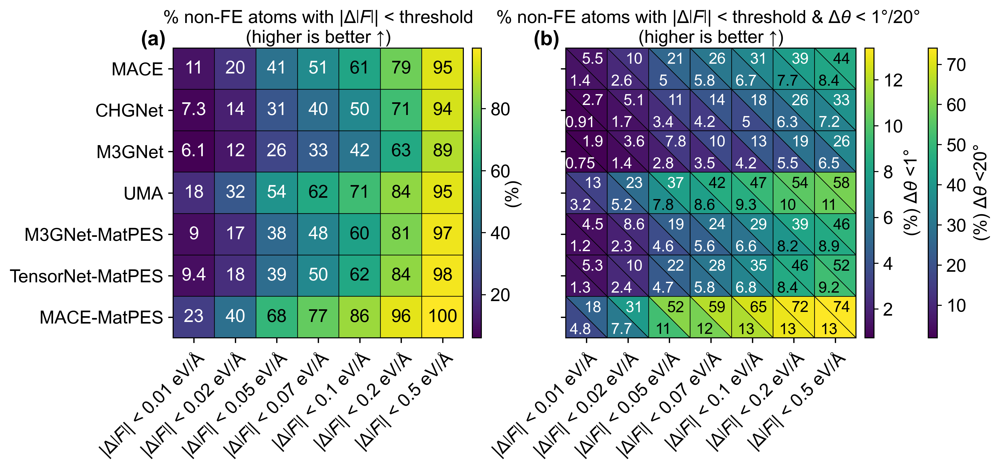

In [44]:
import importlib
import force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import merged_heatmaps

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"

fig, (ax_l, ax_r) = merged_heatmaps(
    # ── Left panel ─────────────────────────────────────────────────────
    data_left       = df_frac_neareq.values,
    col_labels_left = COL_LABELS_NEAREQ,
    title_left      = r"% non-FE atoms with $|\Delta\left|F\right||$ < threshold ""\n(higher is better ↑)",
    cmap_left       = "viridis",
    fmt_left        = "{:.1f}",
    sig_figs_left   = 2,
    textsize_left   = 14,
    labelpad_left   = -5,
    cbar_label_left = "(%)",

    # ── Right panel ────────────────────────────────────────────────────
    data_lower        = vals_lower_neareq,
    data_upper        = vals_upper_neareq,
    col_labels_right  = COL_LABELS_NEAREQ,
    title_right       = r"% non-FE atoms with $|\Delta\left|F\right||$ < threshold & $\Delta\theta$ < 1°/20°  ""\n(higher is better ↑)",
    cmap_lower        = "viridis",
    cmap_upper        = "viridis",
    fmt_right         = "{:.1f}",
    sig_figs_right    = 2,
    textsize_right    = 12,
    cbar_label_lower  = r"(%) $\Delta\theta$ <1°",
    cbar_label_upper  = r"(%) $\Delta\theta$ <20°",
    cbar_upper_labelpad = 5,
    text_lower_x      = 0.35,

    # ── Shared ─────────────────────────────────────────────────────────
    row_labels            = models_neareq,
    show_row_labels_left  = True,
    # suptitle              = rf"Atoms with {FDFT_MIN_NEAREQ} < $|F_\mathrm{{DFT}}|$ < {FDFT_MAX_NEAREQ} eV/Å",
    fontsize              = 14,
    suptitle_y            = 1.12,
    suptitle_x            = .7,
    text_lower_y          = 0.81,

    # ── Layout knobs ───────────────────────────────────────────────────
    figsize              = (6.5, 3.5),
    bottom               = 0.025,
    top                  = 0.92,
    left_margin          = 0.12,
    gap_between_panels   = 0.14,
    cbar_width           = 0.015,
    gap_cbar_left        = 0.015,
    gap_cbar_right       = 0.015,
    gap_between_cbars    = 0.09,

    savepath = None,
)
ax_l.annotate("(a)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-25, -1), textcoords="offset points",
              fontsize=16, fontweight="bold", va="bottom",
              annotation_clip=False)
ax_r.annotate("(b)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-25, -1), textcoords="offset points",
              fontsize=16, fontweight="bold", va="bottom",
              annotation_clip=False)



---


## Section 34 — SI: Highly Accurate Force Predictions across DFT Force-Magnitude Subsets

For each DFT force-magnitude threshold, the analysis is restricted to atoms satisfying

$$
\texttt{FDFT\_MIN\_NEAREQ} < |F_{\mathrm{DFT}}| < \text{threshold}.
$$

The upper threshold is swept over `FDFT_THRESHOLDS_NEAREQ_SWEEP`. The final column has no upper cutoff and corresponds to all evaluated atoms.

- **Data cells** — fraction (%) of atoms within each DFT force-magnitude subset with highly accurate force-magnitude predictions, $|\Delta|F|| < 0.01$ eV/Å.

- **Header row** — fraction (%) of evaluated atoms with $|F_{\mathrm{DFT}}| >$ `FDFT_MIN_NEAREQ` that are included in each DFT force-magnitude subset.


In [45]:
# ── Section 34 config ───────────────────────────────────────────────────────
# Reuses FDFT_MIN_NEAREQ (= 0.01 eV/Å) and all_results_neareq / models_neareq from the setup created for Sections 33–35.
DF_CUTS_NEAREQ_SWEEP = [0.01]   # single Δ|F| cut evaluated inside each window

FDFT_THRESHOLDS_NEAREQ_SWEEP = [0.05, 0.1, 0.2, 0.5, 0.7, 1.0, 2.0, 10000]   # eV/Å
# 10000 → no upper cap ("all atoms" with |F_DFT| > FDFT_MIN_NEAREQ only)


In [46]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import (
    build_highly_accurate_force_fraction_table_fdft_windows,
    build_fdft_distribution_fraction_table_windows,
)

# ── Data cells: % atoms with |Δ|F|| < DF_CUTS_NEAREQ_SWEEP[0], WITHIN each window ──────
df_frac_neareq_sweep = build_highly_accurate_force_fraction_table_fdft_windows(
    all_results_neareq, DF_CUTS_NEAREQ_SWEEP[0], FDFT_THRESHOLDS_NEAREQ_SWEEP, fdf_min=FDFT_MIN_NEAREQ
).loc[models_neareq]

print(f"% atoms with |Δ|F|| < {DF_CUTS_NEAREQ_SWEEP[0]} eV/Å, within each |F_DFT| window")
display(df_frac_neareq_sweep)

# ── Header row: % of all atoms that fall inside each window ─────────────────
pop_frac_neareq_sweep = build_fdft_distribution_fraction_table_windows(
    all_results_neareq, FDFT_THRESHOLDS_NEAREQ_SWEEP, fdf_min=FDFT_MIN_NEAREQ
).loc[models_neareq]

frac_row_neareq_sweep = pop_frac_neareq_sweep.mean(axis=0).map(lambda x: f"{x:.1f}")
frac_row_neareq_sweep.index = FDFT_THRESHOLDS_NEAREQ_SWEEP

col_labels_neareq_sweep = [
    "All atoms" if thr == 10000 else rf"$|F_{{\mathrm{{DFT}}}}| < {thr:g}$ eV/Å"
    for thr in FDFT_THRESHOLDS_NEAREQ_SWEEP
]


% atoms with |Δ|F|| < 0.01 eV/Å, within each |F_DFT| window


,0.05,0.10,0.20,0.50,0.70,1.00,2.00,10000.00
MACE,23.53,20.69,17.32,13.33,11.95,10.63,8.98,8.34
CHGNet,16.78,15.35,12.93,9.58,8.42,7.34,6.07,5.61
M3GNet,14.88,13.02,10.94,8.04,7.01,6.06,4.96,4.56
UMA,35.57,30.64,26.25,21.71,20.09,18.41,16.14,15.13
M3GNet-MatPES,16.65,15.26,13.52,11.12,10.06,9.01,7.68,7.14
TensorNet-MatPES,15.34,14.00,12.77,11.11,10.30,9.41,8.20,7.66
MACE-MatPES,40.83,36.80,32.90,27.64,25.43,23.21,20.28,19.02


In [47]:
frac_row_neareq_sweep

0.05         11.3
0.10         20.9
0.20         31.2
0.50         49.8
0.70         60.1
1.00         72.3
2.00         91.5
10000.00    100.0
dtype: object

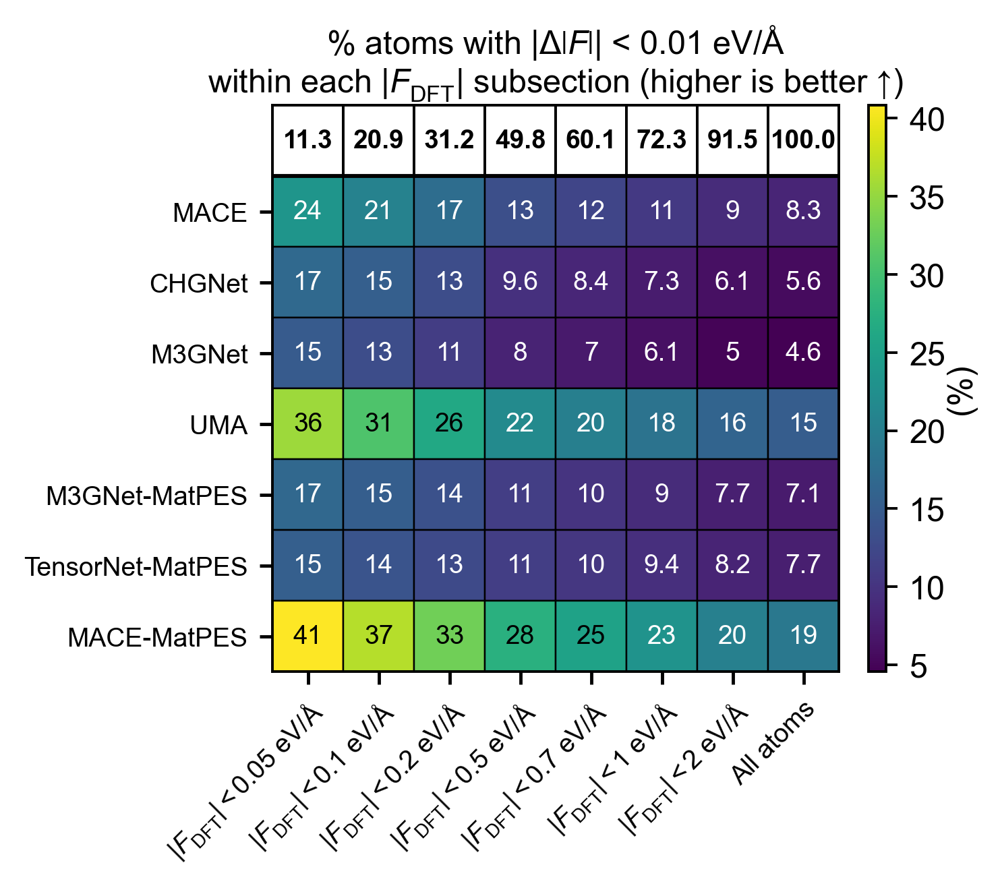

In [48]:
import importlib
import force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import single_heatmap_with_frac_row

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"

fig, ax = single_heatmap_with_frac_row(
    data          = df_frac_neareq_sweep.values,
    row_labels    = models_neareq,
    col_labels    = col_labels_neareq_sweep,
    frac_row_str  = frac_row_neareq_sweep.values,
    title         = (
        rf"% atoms with $|\Delta\left|F\right||$ < {DF_CUTS_NEAREQ_SWEEP[0]:g} eV/Å"
        "\nwithin each $|F_{{\mathrm{{DFT}}}}|$ subsection (higher is better ↑)"
    ),
    cmap          = "viridis",
    fmt           = "{:.1f}",
    sig_figs      = 2,
    textsize      = 8,
    show_row_labels = True,
    cbar_label    = "(%)",
    figsize       = (5.0, 4.0),
    left          = 0.28,
    right         = 0.82,
    bottom        = 0.28,
    top           = 0.88,
    savepath      = "../outputs/matpes_pbe/jsonfiles_for_summary_table/df_frac_fdft_max_windows.svg",
)


---
## Section 35 — SI: Joint Force Magnitude-Angle Accuracy across DFT Force-Magnitude Subsets

Joint counterpart of Section 34: instead of the magnitude-only condition ($|\Delta|F||$ < `DF_CUTS_NEAREQ_SWEEP[0]`), each cell here requires BOTH that condition AND $\Delta\theta$ < `ANGLE_CUTS_NEAREQ`, for the same swept $|F_{\mathrm{DFT}}|$ windows (the final window has no upper cutoff and corresponds to all evaluated atoms — this is not restricted to non-FE atoms).

Two-panel figure: left panel repeats the Section 34 heatmap (`df_frac_neareq_sweep`); right panel is the joint-condition analogue — for the same sweeping $|F_{\mathrm{DFT}}|$ windows, each triangle-split cell shows the % of atoms (within that window) satisfying BOTH $|\Delta|F||$ < `DF_CUTS_NEAREQ_SWEEP[0]` AND $\Delta\theta$ < `ANGLE_CUTS_NEAREQ` (lower = 1°, upper = 20°). Both panels share the same population-fraction header row (`frac_row_neareq_sweep`).


In [49]:
import importlib, force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import build_joint_dF_theta_accuracy_table_fdft_windows

# ── Joint condition: |Δ|F|| < DF_CUTS_NEAREQ_SWEEP[0] AND Δθ < angle_cut, WITHIN each window ──
tables_neareq_sweep = build_joint_dF_theta_accuracy_table_fdft_windows(
    all_results_neareq, DF_CUTS_NEAREQ_SWEEP[0], ANGLE_CUTS_NEAREQ, FDFT_THRESHOLDS_NEAREQ_SWEEP,
    fdf_min=FDFT_MIN_NEAREQ,
)
for ac in ANGLE_CUTS_NEAREQ:
    tables_neareq_sweep[ac] = tables_neareq_sweep[ac].loc[models_neareq]

vals_lower_neareq_sweep = tables_neareq_sweep[ANGLE_CUTS_NEAREQ[0]].values   # Δθ < 1°
vals_upper_neareq_sweep = tables_neareq_sweep[ANGLE_CUTS_NEAREQ[1]].values   # Δθ < 20°

print(f"Joint fraction table shape: {vals_lower_neareq_sweep.shape}  ({len(models_neareq)} models × {len(FDFT_THRESHOLDS_NEAREQ_SWEEP)} windows)")
tables_neareq_sweep[ANGLE_CUTS_NEAREQ[0]]


Joint fraction table shape: (7, 8)  (7 models × 8 windows)


,0.05,0.10,0.20,0.50,0.70,1.00,2.00,10000.00
MACE,4.988941,3.860565,2.948912,1.986343,1.685387,1.431088,1.157086,1.067193
CHGNet,3.395678,2.592177,1.963170,1.296643,1.083244,0.905588,0.720919,0.662192
M3GNet,2.996101,2.168027,1.647095,1.076826,0.898009,0.748535,0.593061,0.542902
UMA,7.656883,5.980138,4.826408,3.830863,3.518756,3.244188,2.927540,2.791754
M3GNet-MatPES,3.786233,3.031073,2.450853,1.714374,1.455939,1.230458,0.995429,0.919315
TensorNet-MatPES,3.927107,3.047201,2.462936,1.745889,1.495248,1.275936,1.051006,0.975083
MACE-MatPES,11.798467,9.763056,8.184089,6.075245,5.363488,4.757244,4.096660,3.876187


Text(-28, 2.5, '(b)')

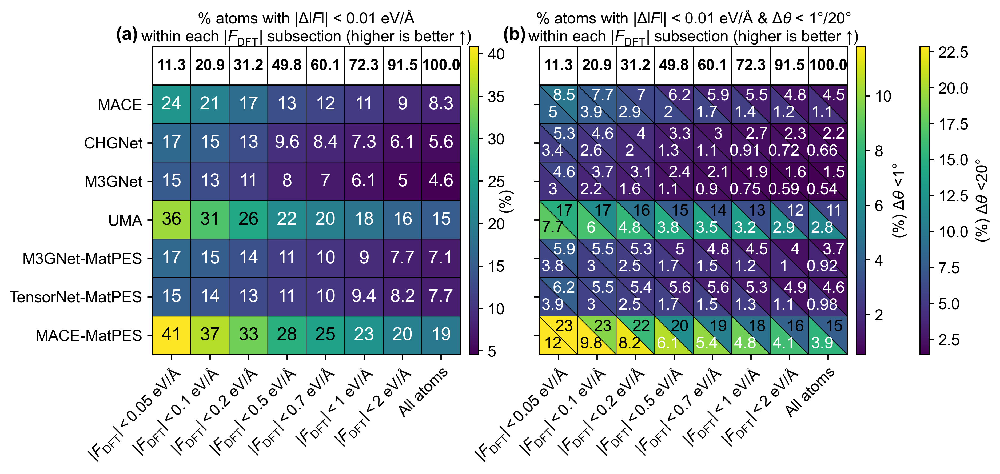

In [50]:
import importlib
import force_error_metrics
importlib.reload(force_error_metrics)
from force_error_metrics import merged_heatmaps_with_frac_row

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["mathtext.rm"] = "Arial"
plt.rcParams["mathtext.it"] = "Arial:italic"
plt.rcParams["mathtext.bf"] = "Arial:bold"

fig, (ax_l, ax_r) = merged_heatmaps_with_frac_row(
    # ── Left panel ─────────────────────────────────────────────────────
    data_left       = df_frac_neareq_sweep.values,
    col_labels_left = col_labels_neareq_sweep,
    title_left      = (
        rf"% atoms with $|\Delta\left|F\right||$ < {DF_CUTS_NEAREQ_SWEEP[0]:g} eV/Å"
        "\nwithin each $|F_{{\mathrm{{DFT}}}}|$ subsection (higher is better ↑)"
    ),
    cmap_left       = "viridis",
    fmt_left        = "{:.1f}",
    sig_figs_left   = 2,
    textsize_left   = 14,
    labelpad_left   = -5,
    cbar_label_left = "(%)",

    # ── Right panel ────────────────────────────────────────────────────
    data_lower        = vals_lower_neareq_sweep,
    data_upper        = vals_upper_neareq_sweep,
    col_labels_right  = col_labels_neareq_sweep,
    title_right       = (
        rf"% atoms with $|\Delta\left|F\right||$ < {DF_CUTS_NEAREQ_SWEEP[0]:g} eV/Å"
        rf" & $\Delta\theta$ < {ANGLE_CUTS_NEAREQ[0]}°/{ANGLE_CUTS_NEAREQ[1]}°"
       "\nwithin each $|F_{{\mathrm{{DFT}}}}|$ subsection (higher is better ↑)"
    ),
    cmap_lower        = "viridis",
    cmap_upper        = "viridis",
    fmt_right         = "{:.1f}",
    sig_figs_right    = 2,
    textsize_right    = 12.5,
    cbar_label_lower  = rf"(%) $\Delta\theta$ <{ANGLE_CUTS_NEAREQ[0]}°",
    cbar_label_upper  = rf"(%) $\Delta\theta$ <{ANGLE_CUTS_NEAREQ[1]}°",
    cbar_upper_labelpad = 5,
    text_lower_x      = 0.35,

    # ── Shared header row (population fraction of each window) ───────────
    frac_row_str    = frac_row_neareq_sweep.values,

    # ── Shared ─────────────────────────────────────────────────────────
    row_labels            = models_neareq,
    show_row_labels_left  = True,
    # suptitle              = rf"non-FE windows: $|F_\mathrm{{DFT}}| >$ {FDFT_MIN_NEAREQ} eV/Å",
    fontsize              = 12,
    suptitle_y            = 1.1,
    suptitle_x            = .55,

    # ── Layout knobs ───────────────────────────────────────────────────
    figsize              = (6.5, 4),
    bottom               = 0.025,
    top                  = 0.85,
    left_margin          = 0.14,
    gap_between_panels   = 0.1,
    cbar_width           = 0.015,
    gap_cbar_left        = 0.015,
    gap_cbar_right       = 0.015,
    gap_between_cbars    = 0.09,

    savepath = None,
)
ax_l.annotate("(a)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-28, +2.5), textcoords="offset points",
              fontsize=14, fontweight="bold", va="bottom",
              annotation_clip=False)
ax_r.annotate("(b)", xy=(0, 1), xycoords="axes fraction",
              xytext=(-28, +2.5), textcoords="offset points",
              fontsize=14, fontweight="bold", va="bottom",
              annotation_clip=False)


---

## Section 36 — SI: Querying Atom and Structure Subsets for Diagnostic Analysis

The `get_bad_atom_indices(...)` utility can be used to identify the specific atoms and structures belonging to any selected force-error or DFT force-magnitude subset for a given FP.

This makes it possible to trace the aggregate error metrics back to the underlying atomistic configurations. The returned indices can therefore be used for deeper investigation of difficult cases or to identify configurations that may be useful for targeted training-data augmentation.

For a selected `MODEL`, the function filters the flat per-atom arrays stored in `all_results_filtered` and returns:

- `atom_indices` — indices of atoms in the model-specific flat per-atom arrays that satisfy all specified criteria.
- `structure_indices` — `original_index` values of structures containing at least one matching atom, **when that provenance is available** (see note below).

Because the query is performed separately for the selected FP, the atoms identified for a given criterion can differ between models.

**Provenance note.** `structure_indices` currently returns empty for every model in `all_results_filtered`: the standardized reproduction results (see Section 0) do not carry the `original_indices`/nested per-structure Cartesian forces that `get_bad_atom_indices(...)` needs to map atoms back to structures. `atom_indices` (atom-level querying) is unaffected and fully functional. The generation workflow (see `../generation/`) now preserves `structure_id` and `atom_index` for every atom, but the canonical standardized datasets released with this repository predate that change and must be regenerated before this provenance is present in `all_results_filtered`. Structure-level querying is therefore not yet fully operational against the currently-released data; `get_bad_atom_indices(...)` itself is not being changed in this pass.

### Available filters

| Argument | Selection criterion |
| --- | --- |
| `dF_gt=X` | Force-magnitude error $\left\lvert\Delta\lvert F\rvert\right\rvert > X$ eV/Å |
| `dF_lt=X` | Force-magnitude error $\left\lvert\Delta\lvert F\rvert\right\rvert < X$ eV/Å |
| `dtheta_gt=X` | Force-angle error $\Delta\theta > X^\circ$ |
| `dtheta_lt=X` | Force-angle error $\Delta\theta < X^\circ$ |
| `fdft_gt=X` | DFT force magnitude $\lvert F_{\mathrm{DFT}}\rvert > X$ eV/Å |
| `fdft_lt=X` | DFT force magnitude $\lvert F_{\mathrm{DFT}}\rvert < X$ eV/Å |

All specified conditions are combined using **AND**, so only atoms satisfying every requested criterion are returned.

The corresponding `structure_indices` can then be used to retrieve the original structures for visualization, detailed error analysis, or potential inclusion in additional training data.

In [51]:
all_results_filtered.keys()

dict_keys(['MACE', 'CHGNet', 'M3GNet', 'UMA', 'M3GNet-MatPES', 'TensorNet-MatPES', 'MACE-MatPES'])

In [52]:
all_results_filtered["MACE"].keys()

dict_keys(['F_dft', 'F_mlip', 'deltaF', 'deltaTheta', 'e_vec'])

In [53]:
from force_error_metrics import get_bad_atom_indices                                                                           
                                                                                                                                
MODEL = "MACE-MatPES"   # change to any model in all_results_filtered                                                                                                                                              
                                                                                                                                                                                                            
# ── Totals ────────────────────────────────────────────────────────────────────                                                                                                                            
d              = all_results_filtered[MODEL]                                                                                                                                                                
total_atoms    = len(d.get("all_deltaF", d.get("deltaF", [])))                                                                                                                                              
total_structs  = len(d.get("original_indices", []))                                                                                                                                                         
print(f"{'[TOTAL]':<35} {total_atoms:>7,} atoms  |  {total_structs:>5,} structures")                                                                                                                        
print("-" * 70)                                                                                                                                                                                             
                                                                                                                                                                                                            
def _report(label, atom_idx, struct_idx):                                                                                                                                                                   
    pa = 100 * len(atom_idx)   / total_atoms   if total_atoms   else 0                                                                                                                                      
    ps = 100 * len(struct_idx) / total_structs if total_structs else 0                                                                                                                                      
    print(f"{label:<35} {len(atom_idx):>7,} atoms ({pa:5.1f}%)  |  {len(struct_idx):>5,} structures ({ps:5.1f}%)")                                                                                          
                                                                                                                                                                                                            
# ── Example 1: |Δ|F|| > 0.1 eV/Å ──────────────────────────────────────────────                                                                                                                              
_report("[|Δ|F|| > 0.1]",                                                                                                                                                                                     
        *get_bad_atom_indices(all_results_filtered, MODEL, dF_gt=0.1))                                                                                                                                      

# ── Example 2: |Δ|F|| < 0.05 eV/Å (well-predicted atoms) ─────────────────────                                                                                                                               
_report("[|Δ|F|| < 0.05]",                                  
        *get_bad_atom_indices(all_results_filtered, MODEL, dF_lt=0.05))                                                                                                                                     
                                                                                                                                                                                                            
# ── Example 3: Δθ > 20° ────────────────────────────────────────────────────                                                                                                                             
_report("[Δθ > 20°]",                                                                                                                                                                                     
        *get_bad_atom_indices(all_results_filtered, MODEL, dtheta_gt=20))                                                                                                                                   
                                                        
# ── Example 4: |F_DFT| > 1.0 eV/Å (high-force regime) ──────────────────────                                                                                                                               
_report("[|F_DFT| > 1.0]",
        *get_bad_atom_indices(all_results_filtered, MODEL, fdft_gt=1.0))                                                                                                                                    
                                                                                                                                                                                                            
# ── Example 5: non-FE AND large |Δ|F|| ───────────────────────────────                                                                                                                             
_report("[|F_DFT| < 1.0 AND |Δ|F|| > 0.1]",                                                                                                                                                                   
        *get_bad_atom_indices(all_results_filtered, MODEL, fdft_lt=1.0, dF_gt=0.1))                                                                                                                         
                                                                                                                                                                                                            
# ── Example 6: large angle AND large |Δ|F|| ────────────────────────────────────                                                                                                                             
_report("[|Δ|F|| > 0.1 AND Δθ > 20°]",                                                                                                                                                                      
        *get_bad_atom_indices(all_results_filtered, MODEL, dF_gt=0.1, dtheta_gt=20))                                                                                                                        
                                                                                                                                                                                                            
print("-" * 70)
atom_idx, struct_idx = get_bad_atom_indices(all_results_filtered, MODEL, dF_gt=0.1)                                                                                                                         
print("Original structure indices (first 10):", struct_idx[:10])  

[TOTAL]                             3,664,065 atoms  |      0 structures
----------------------------------------------------------------------
[|Δ|F|| > 0.1]                      798,446 atoms ( 21.8%)  |      0 structures (  0.0%)


[|Δ|F|| < 0.05]                     2,191,603 atoms ( 59.8%)  |      0 structures (  0.0%)
[Δθ > 20°]                          756,242 atoms ( 20.6%)  |      0 structures (  0.0%)


[|F_DFT| > 1.0]                     984,487 atoms ( 26.9%)  |      0 structures (  0.0%)
[|F_DFT| < 1.0 AND |Δ|F|| > 0.1]    375,465 atoms ( 10.2%)  |      0 structures (  0.0%)


[|Δ|F|| > 0.1 AND Δθ > 20°]         171,241 atoms (  4.7%)  |      0 structures (  0.0%)
----------------------------------------------------------------------
Original structure indices (first 10): []


In [54]:
print("Done.")

Done.
